## Test Model 2030

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

#pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_IT\\20240318_ITzeroem\\elec_s_7_ec_lv1.5_Co2L0.0-3h.nc")


INFO:pypsa.io:Imported network elec_s_7_ec_lv1.5_Co2L0.0-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [3]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 14 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 2 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 15 entries
Component 'Load' has 7 entries
Component 'Generator' has 102 entries
Component 'StorageUnit' has 27 entries
Component 'Store' has 7 entries


In [4]:
n.generators.loc['IT0 0 CCGT','marginal_cost']

46.81297235023577

In [5]:
# set marginal cost of load shedding to €
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 10


In [6]:
n.generators.loc['IT0 0 load','marginal_cost']


10.0

In [7]:
#solve network
#n.optimize(solver_name='gurobi')
n.lopf(solver_name='gurobi')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2918086421.py:3: DeprecatedWarning: lopf is deprecated as of 0.24 and will be removed in 1.0. Use linopy-based function ``n.optimize()`` instead. Migrate extra functionalities: https://pypsa.readthedocs.io/en/latest/examples/optimization-with-linopy-migrate-extra-functionalities.html.
  n.lopf(solver_name='gurobi')


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 8.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Set parameter Username
Academic license - for non-commercial use only - expires 2025-03-09
Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\pypsa-problem-75nxhmq3.lp
Reading time = 5.51 seconds
obj: 1375322 rows, 657075 columns, 2636577 nonzeros
Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 1375322 rows, 657075 columns and 2636577 nonzeros
Model fingerprint: 0x7df9b68c
Coefficient statistics:
  Matrix range     [1e-03, 6e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [1e+00, 3e+09]
  RHS range        [2e+00, 1e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 978468 rows and 213617 columns
Presolve time: 2.33s
Presolved: 396854 rows, 443458 columns, 1304341 no

INFO:pypsa.linopf:Optimization successful. Objective value: 2.17e+10


('ok', 'optimal')

In [8]:
def system_cost(n): #n.statistics.capex()
    tsc = n.statistics.capex() + n.statistics.opex()
    return tsc.droplevel(0).div(1e6) # million €/a

In [9]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


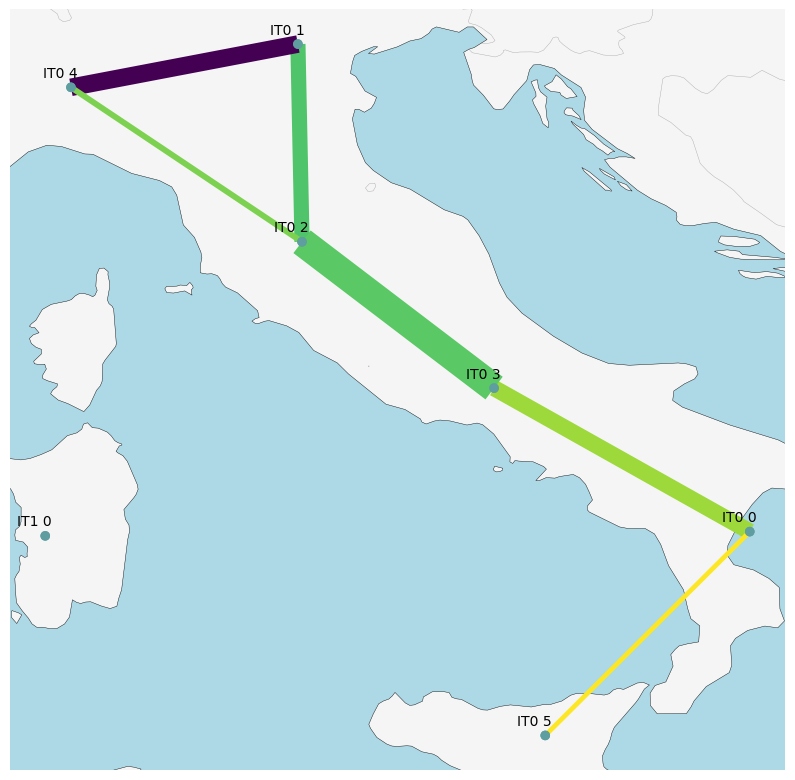

In [10]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [11]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


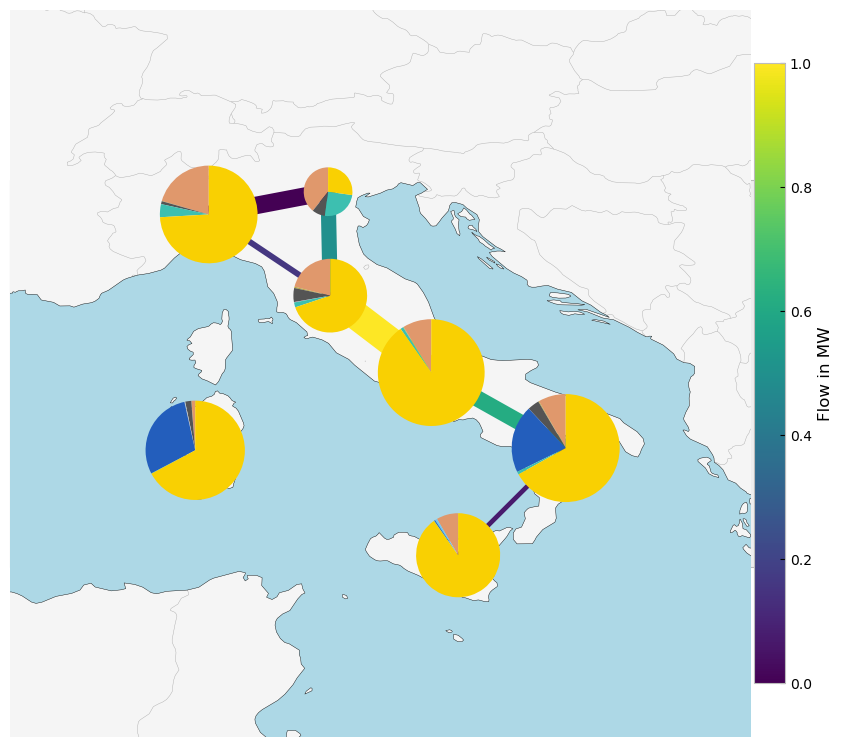

In [12]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [13]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3735415306.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


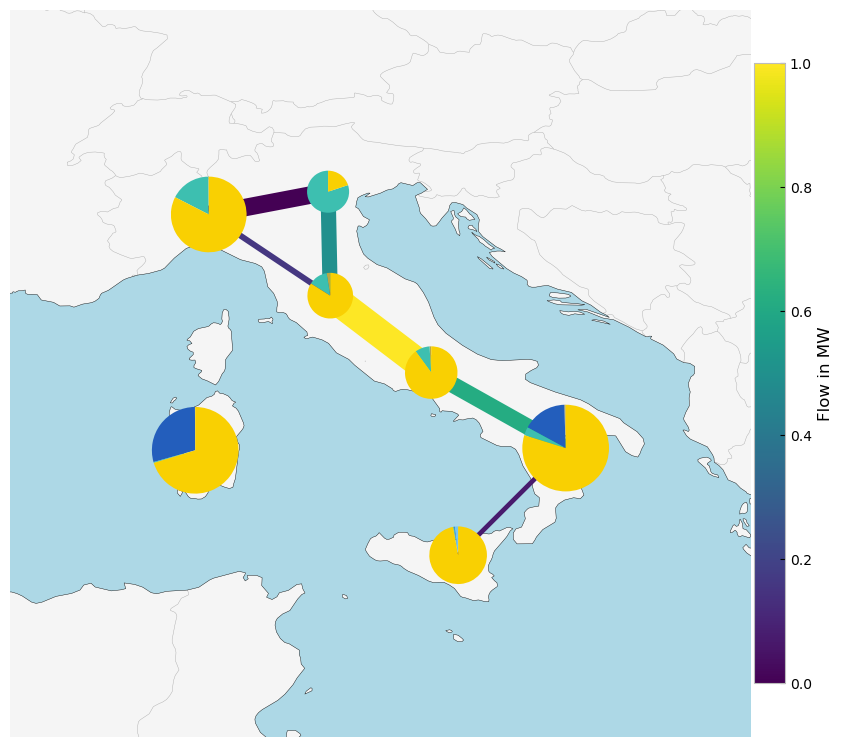

In [14]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

In [15]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity in Italy"
    )

    plt.show()
    return capacities

<Figure size 640x480 with 0 Axes>

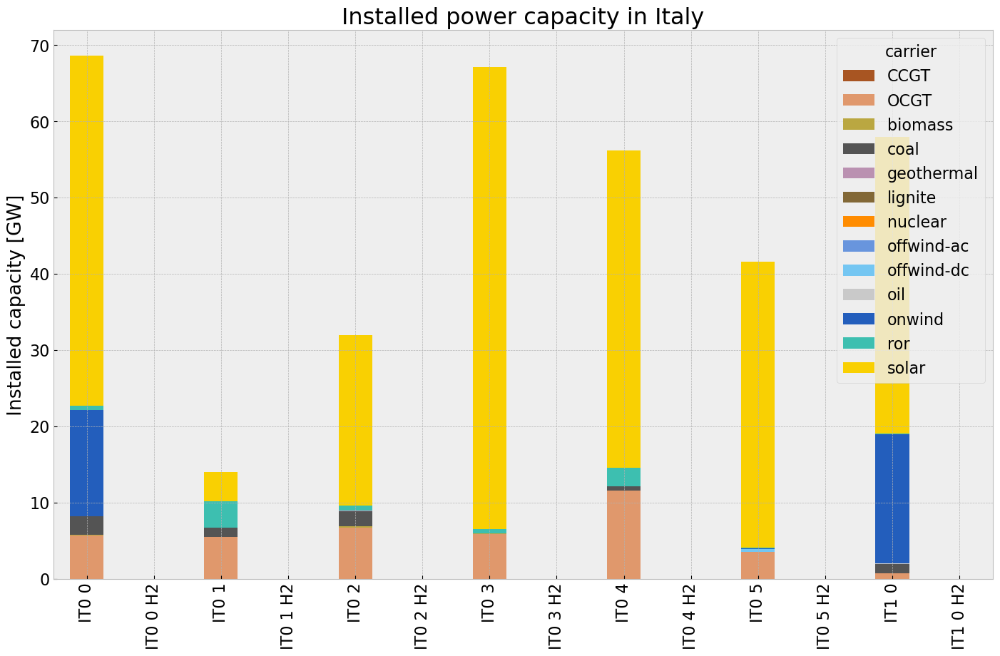

In [16]:
# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)


## Generation

In [17]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                #title=f"Generated electricity in Italy in {year}"
    )

    plt.show()
    return generations

<Figure size 640x480 with 0 Axes>

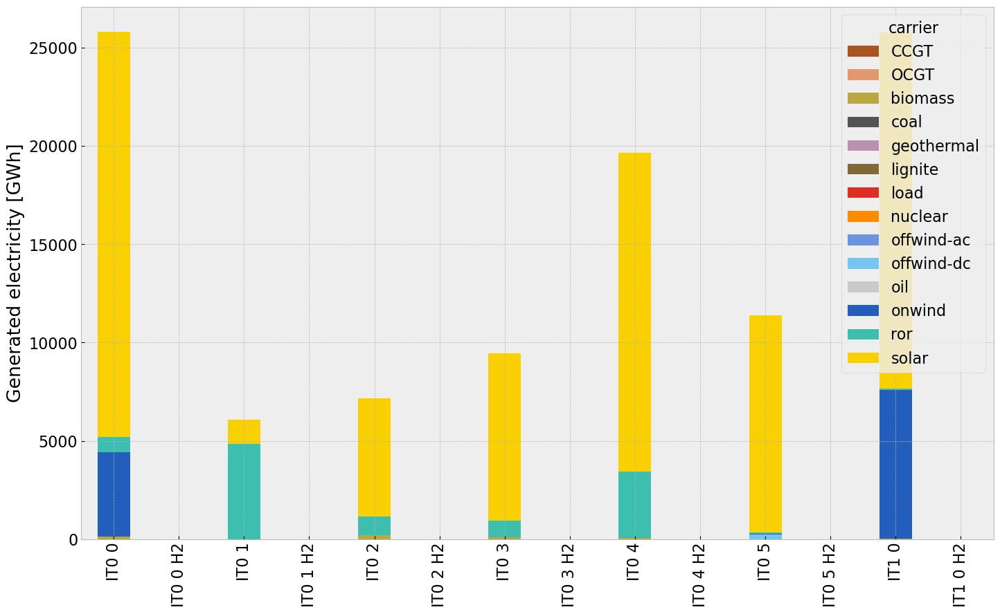

In [18]:

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [19]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2983392203.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2983392203.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [20]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [21]:
def gen_curve(n, start, end, colors):
    
    #p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)

    #sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,100)

In [22]:
p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    
if not n.storage_units.empty:
    sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
    p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\1302684455.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\1302684455.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\882899708.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-12-01', end='2013-12-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\882899708.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-12-01', end='2013-12-14', freq='3H')].sum(axis=1).plot(ax=ax)


(20.0, 100.0)

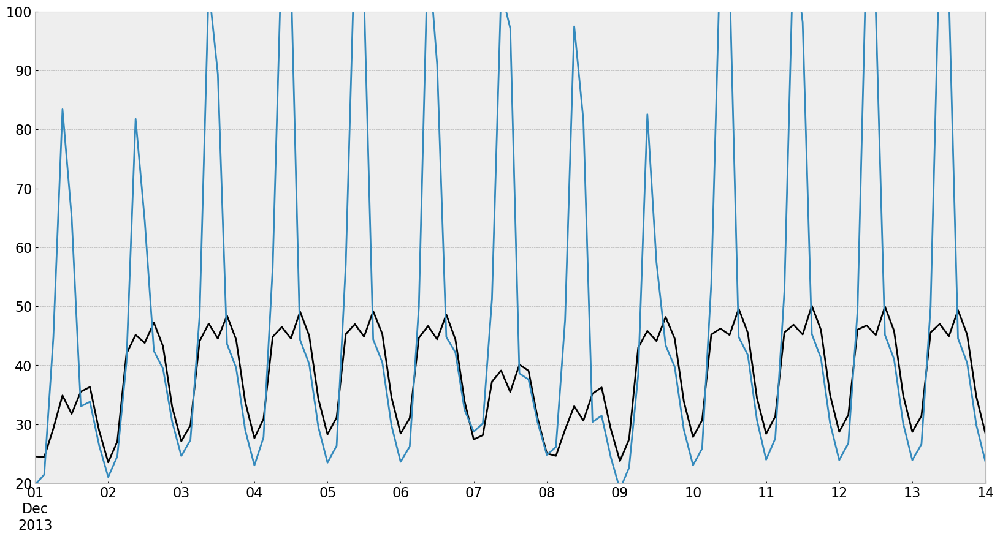

In [23]:
fig, ax = plt.subplots(figsize=(20, 10))
n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-12-01', end='2013-12-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)
p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-12-01', end='2013-12-14', freq='3H')].sum(axis=1).plot(ax=ax)
ax.set_ylim(20,100)

In [24]:
tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
tes.to_csv('energybalance.csv', index=True)

In [25]:
n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3090618187.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


<Axes: >

In [26]:
p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3075180031.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)


2013-01-08 00:00:00     24.437837
2013-01-08 03:00:00     27.326837
2013-01-08 06:00:00     43.696243
2013-01-08 09:00:00    104.980157
2013-01-08 12:00:00     92.158016
2013-01-08 15:00:00     43.062473
2013-01-08 18:00:00     38.960140
2013-01-08 21:00:00     28.517807
2013-01-09 00:00:00     22.459807
2013-01-09 03:00:00     25.061140
2013-01-09 06:00:00     39.775473
2013-01-09 09:00:00     88.685656
2013-01-09 12:00:00     67.069541
2013-01-09 15:00:00     43.109140
2013-01-09 18:00:00     39.271473
2013-01-09 21:00:00     28.772807
2013-01-10 00:00:00     22.618807
2013-01-10 03:00:00     25.282140
2013-01-10 06:00:00     40.102140
2013-01-10 09:00:00     65.961660
2013-01-10 12:00:00     51.258451
2013-01-10 15:00:00     43.228807
2013-01-10 18:00:00     39.232807
2013-01-10 21:00:00     28.815140
2013-01-11 00:00:00     23.737541
2013-01-11 03:00:00     25.632473
2013-01-11 06:00:00     43.117998
2013-01-11 09:00:00     95.148424
2013-01-11 12:00:00     75.299362
2013-01-11 15:

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


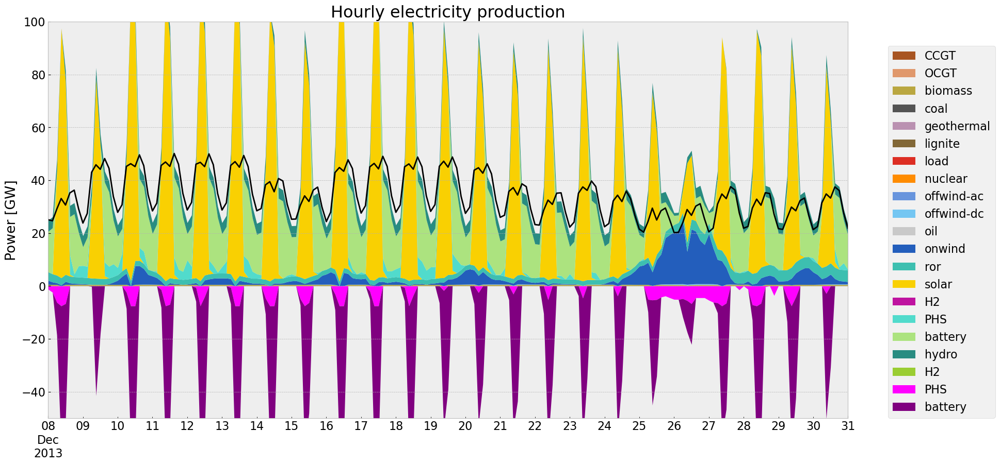

In [27]:
# winter
gen_curve(n, '2013-12-08', '2013-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


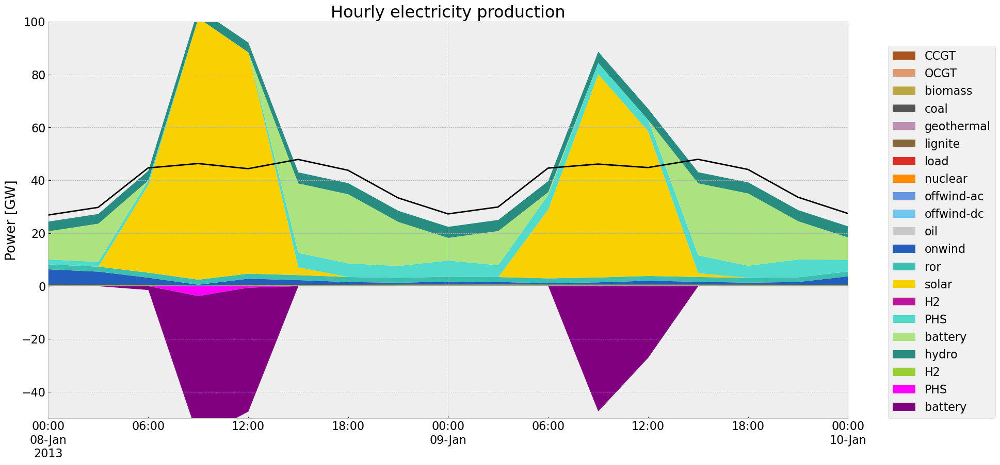

In [98]:

gen_curve(n, '2013-01-08', '2013-01-10', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


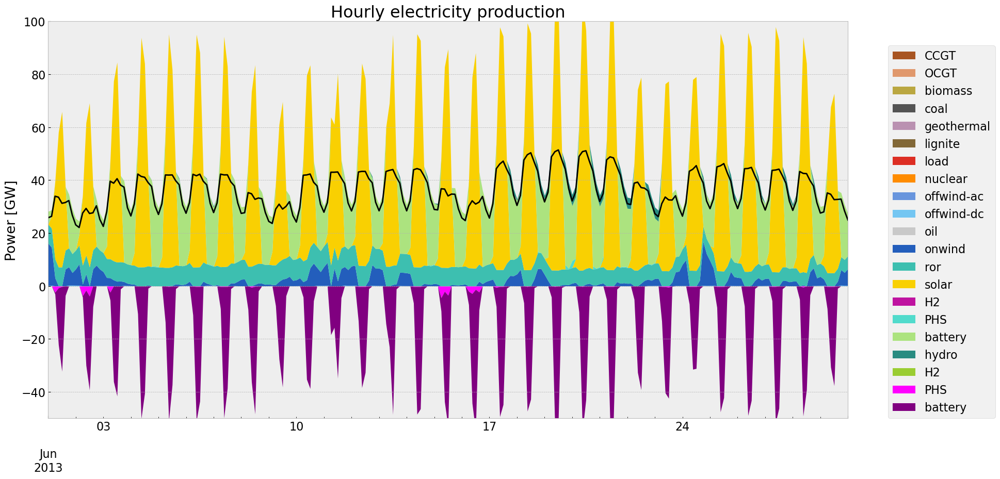

In [75]:
#summer
gen_curve(n, '2013-06-01', '2013-06-30', colors_gen)

## Storage

In [29]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,H2,PHS,battery,hydro
bus,,,,
IT0 0,0.0,NaN,12.779773,0.5030
IT0 1,0.0,2.4219,0.000000,2.1556
IT0 2,0.0,0.2810,2.986046,0.2280
IT0 3,0.0,1.8160,12.570756,0.0790
IT0 4,0.0,2.2330,2.094945,1.1272
IT0 5,0.0,0.5800,10.579825,0.0240
IT1 0,0.0,0.2400,13.448854,0.0780


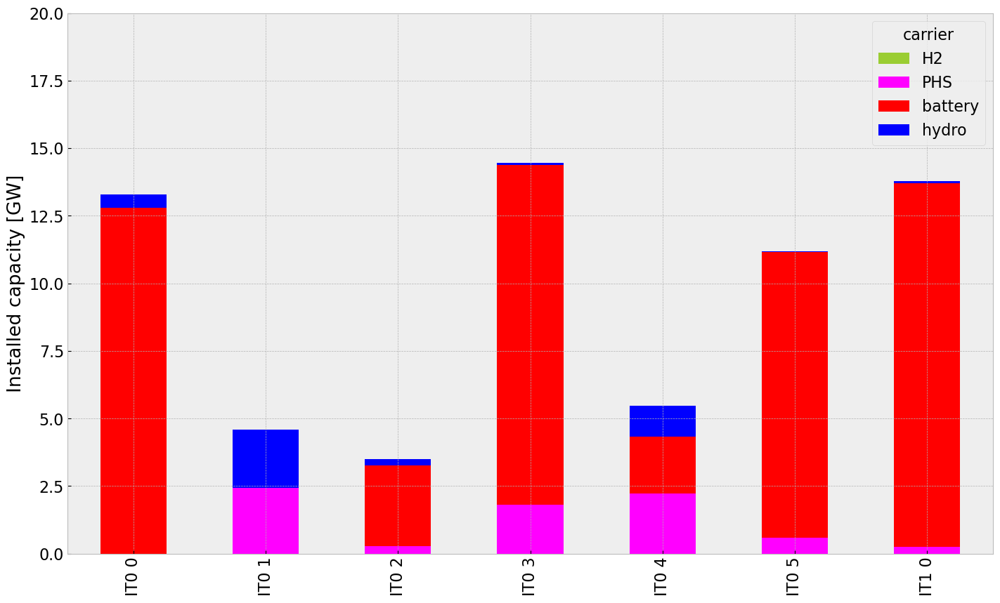

In [30]:
inst_store_table(n)

In [31]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


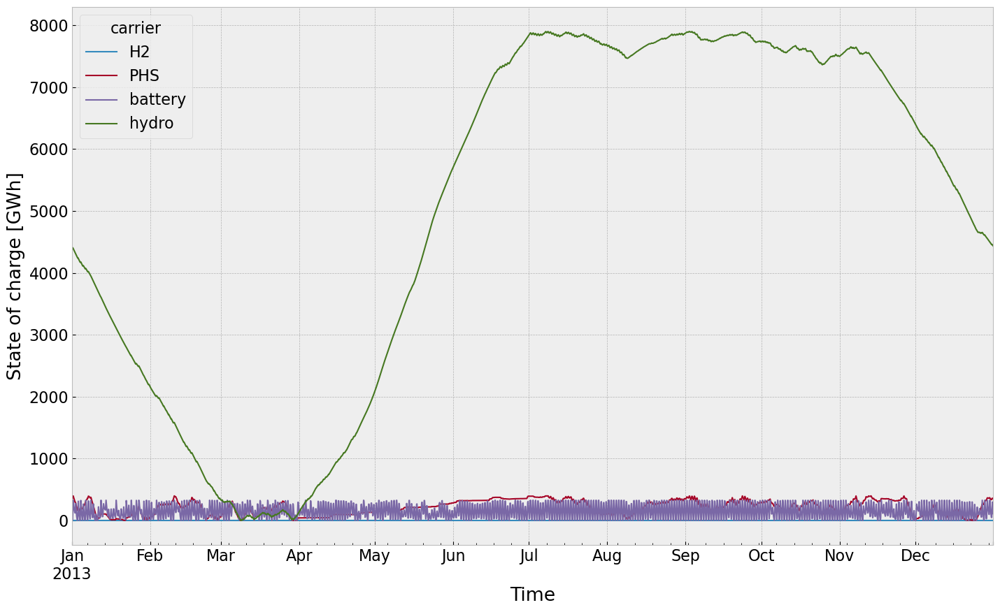

In [32]:
state_of_charge_plot(n)

## Electricity Price

In [90]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [92]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


In [97]:
n.buses_t.marginal_price['IT1 0'].sort_values(ascending=False).head(20)

snapshot
2013-01-09 06:00:00    2810.957277
2013-01-08 15:00:00    2810.957277
2013-01-09 00:00:00    2810.957277
2013-01-08 18:00:00    2810.957277
2013-01-08 21:00:00    2810.957277
2013-01-10 06:00:00    2810.957277
2013-01-10 03:00:00    2810.957277
2013-01-10 00:00:00    2810.957277
2013-01-09 21:00:00    2810.957277
2013-01-09 18:00:00    2810.957277
2013-01-09 15:00:00    2810.957277
2013-01-09 03:00:00    2810.957277
2013-01-09 12:00:00    2698.509766
2013-01-09 09:00:00    2698.509766
2013-11-27 21:00:00    1548.201323
2013-11-29 15:00:00    1548.201323
2013-11-30 00:00:00    1548.201323
2013-11-30 03:00:00    1548.201323
2013-11-29 21:00:00    1548.201323
2013-11-29 18:00:00    1548.201323
Name: IT1 0, dtype: float64

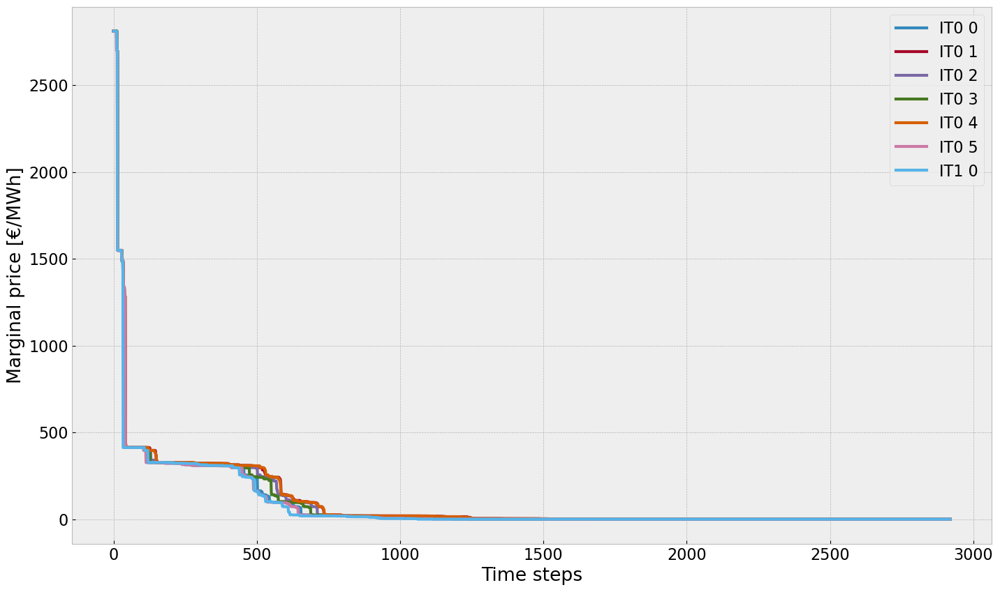

In [91]:
price_dur_curve_plot(n)

In [35]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    for index, value in region.items():
        if index.endswith('H2'):
            region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

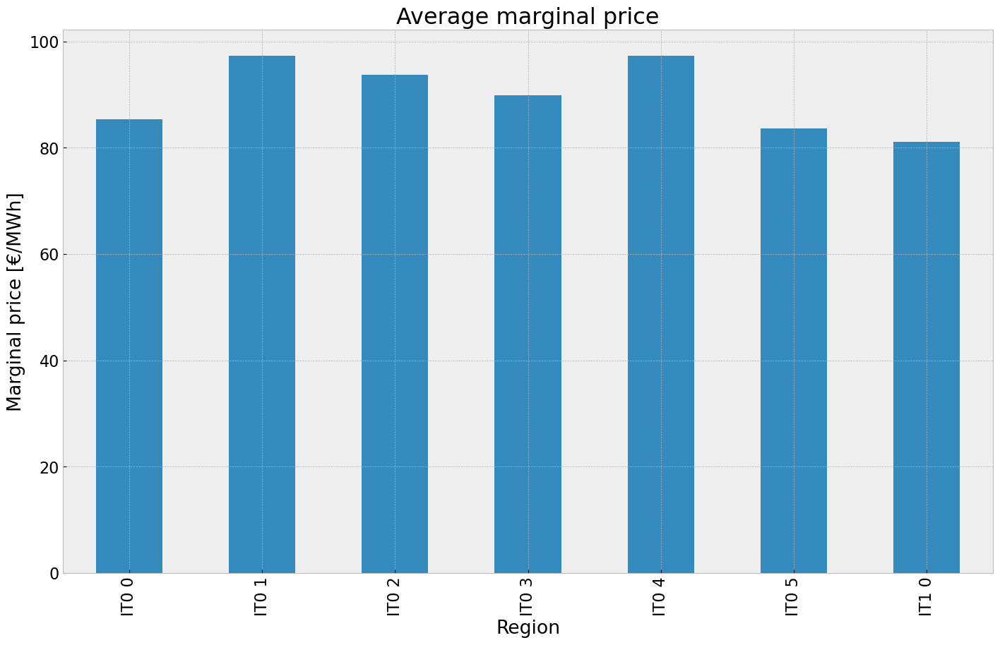

In [84]:
price_regions_table(n)

# Volcano Erruption Scenario
eruption start: 01.06.2013
reduction on radiation: 10%, source:
duration : until year end

In [37]:
#copy network
n1=n.copy()

#p_max_pu of solar generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
eruption_start=pd.to_datetime('2013-06-01 00:00:00')
for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= eruption_start:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.9 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

In [83]:
n1.generators_t.p_max_pu.sum()

Generator
IT0 0 offwind-ac     592.140808
IT0 0 onwind         426.462599
IT0 0 ror           1398.010907
IT0 0 solar          447.096750
IT0 1 offwind-ac     485.673662
IT0 1 offwind-dc     587.916862
IT0 1 onwind         122.401552
IT0 1 ror           1398.010907
IT0 1 solar          377.400308
IT0 2 offwind-ac     577.173398
IT0 2 offwind-dc     610.835270
IT0 2 onwind         264.123367
IT0 2 ror           1398.010907
IT0 2 solar          402.855738
IT0 3 offwind-ac     461.347475
IT0 3 offwind-dc     803.217696
IT0 3 onwind         196.444587
IT0 3 ror           1398.010907
IT0 3 solar          420.759604
IT0 4 offwind-ac     383.161814
IT0 4 onwind         103.927025
IT0 4 ror           1398.010907
IT0 4 solar          379.169634
IT0 5 offwind-ac     551.677994
IT0 5 offwind-dc     876.675033
IT0 5 onwind         358.098267
IT0 5 ror           1398.010907
IT0 5 solar          462.441395
IT1 0 offwind-ac     811.941052
IT1 0 onwind         565.816181
IT1 0 ror           1398.01090

## 1. Scenario: allow additional investment of extendable generators and storage

In [39]:
n1.optimize.create_model()


Index(['IT1 0 solar'], dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [40]:
#solve network

n1.optimize(solver_name='gurobi')

Index(['IT1 0 solar'], dtype='object', name='Generator')
Index(['IT1 0 solar'], dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]
INFO:linopy.io: Writing time: 17.11s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5uzoip_o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5uzoip_o.lp


Reading time = 4.93 seconds


INFO:gurobipy:Reading time = 4.93 seconds


obj: 1375428 rows, 656984 columns, 2636592 nonzeros


INFO:gurobipy:obj: 1375428 rows, 656984 columns, 2636592 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 1375428 rows, 656984 columns and 2636592 nonzeros


INFO:gurobipy:Optimize a model with 1375428 rows, 656984 columns and 2636592 nonzeros


Model fingerprint: 0x0cbf72f2


INFO:gurobipy:Model fingerprint: 0x0cbf72f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 3e+09]


INFO:gurobipy:  Bounds range     [1e+00, 3e+09]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 980039 rows and 213527 columns


INFO:gurobipy:Presolve removed 980039 rows and 213527 columns


Presolve time: 2.54s


INFO:gurobipy:Presolve time: 2.54s


Presolved: 395389 rows, 443457 columns, 1301411 nonzeros


INFO:gurobipy:Presolved: 395389 rows, 443457 columns, 1301411 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.70s


INFO:gurobipy:Ordering time: 0.70s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 66


INFO:gurobipy: Dense cols : 66


 AA' NZ     : 1.057e+06


INFO:gurobipy: AA' NZ     : 1.057e+06


 Factor NZ  : 6.993e+06 (roughly 400 MB of memory)


INFO:gurobipy: Factor NZ  : 6.993e+06 (roughly 400 MB of memory)


 Factor Ops : 6.121e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.121e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.40183331e+15 -1.45471025e+16  2.66e+07 4.12e+04  2.44e+11     5s


INFO:gurobipy:   0   1.40183331e+15 -1.45471025e+16  2.66e+07 4.12e+04  2.44e+11     5s


   1   1.23192335e+15 -9.67854415e+15  2.18e+07 1.57e+04  1.44e+11     5s


INFO:gurobipy:   1   1.23192335e+15 -9.67854415e+15  2.18e+07 1.57e+04  1.44e+11     5s


   2   1.10653435e+15 -6.82396840e+15  1.78e+07 6.66e+03  1.01e+11     6s


INFO:gurobipy:   2   1.10653435e+15 -6.82396840e+15  1.78e+07 6.66e+03  1.01e+11     6s


   3   7.76296490e+14 -3.87403097e+15  6.94e+06 1.54e+03  3.78e+10     7s


INFO:gurobipy:   3   7.76296490e+14 -3.87403097e+15  6.94e+06 1.54e+03  3.78e+10     7s


   4   5.57088462e+14 -1.19105862e+15  2.18e+06 2.01e+02  1.09e+10     7s


INFO:gurobipy:   4   5.57088462e+14 -1.19105862e+15  2.18e+06 2.01e+02  1.09e+10     7s


   5   3.20956736e+14 -5.31575742e+14  6.68e+05 6.86e+01  3.59e+09     8s


INFO:gurobipy:   5   3.20956736e+14 -5.31575742e+14  6.68e+05 6.86e+01  3.59e+09     8s


   6   1.36899829e+14 -2.65348206e+14  2.64e+05 2.25e+01  1.40e+09     8s


INFO:gurobipy:   6   1.36899829e+14 -2.65348206e+14  2.64e+05 2.25e+01  1.40e+09     8s


   7   7.04990097e+13 -1.38097282e+14  1.21e+05 5.50e+00  6.24e+08     8s


INFO:gurobipy:   7   7.04990097e+13 -1.38097282e+14  1.21e+05 5.50e+00  6.24e+08     8s


   8   4.87609807e+13 -9.14381867e+13  8.10e+04 2.42e+00  3.93e+08     9s


INFO:gurobipy:   8   4.87609807e+13 -9.14381867e+13  8.10e+04 2.42e+00  3.93e+08     9s


   9   3.00682149e+13 -4.28994167e+13  4.85e+04 4.33e-01  1.97e+08    10s


INFO:gurobipy:   9   3.00682149e+13 -4.28994167e+13  4.85e+04 4.33e-01  1.97e+08    10s


  10   4.42756697e+12 -1.75460390e+13  7.20e+03 5.48e-02  3.71e+07    11s


INFO:gurobipy:  10   4.42756697e+12 -1.75460390e+13  7.20e+03 5.48e-02  3.71e+07    11s


  11   1.82435410e+12 -6.05869222e+12  2.59e+03 7.87e-03  1.17e+07    11s


INFO:gurobipy:  11   1.82435410e+12 -6.05869222e+12  2.59e+03 7.87e-03  1.17e+07    11s


  12   8.68440515e+11 -4.30069706e+12  1.09e+03 5.00e-03  6.69e+06    12s


INFO:gurobipy:  12   8.68440515e+11 -4.30069706e+12  1.09e+03 5.00e-03  6.69e+06    12s


  13   5.75627572e+11 -2.08676373e+12  5.85e+02 2.17e-03  3.25e+06    12s


INFO:gurobipy:  13   5.75627572e+11 -2.08676373e+12  5.85e+02 2.17e-03  3.25e+06    12s


  14   4.16253187e+11 -1.37618420e+12  3.66e+02 1.40e-03  2.10e+06    13s


INFO:gurobipy:  14   4.16253187e+11 -1.37618420e+12  3.66e+02 1.40e-03  2.10e+06    13s


  15   3.09903391e+11 -9.82956318e+11  2.31e+02 1.01e-03  1.47e+06    13s


INFO:gurobipy:  15   3.09903391e+11 -9.82956318e+11  2.31e+02 1.01e-03  1.47e+06    13s


  16   2.23607259e+11 -6.65415509e+11  1.37e+02 6.85e-04  9.86e+05    14s


INFO:gurobipy:  16   2.23607259e+11 -6.65415509e+11  1.37e+02 6.85e-04  9.86e+05    14s


  17   1.76584907e+11 -4.62711849e+11  9.34e+01 4.88e-04  7.00e+05    15s


INFO:gurobipy:  17   1.76584907e+11 -4.62711849e+11  9.34e+01 4.88e-04  7.00e+05    15s


  18   1.53809978e+11 -3.29694666e+11  7.54e+01 3.55e-04  5.27e+05    15s


INFO:gurobipy:  18   1.53809978e+11 -3.29694666e+11  7.54e+01 3.55e-04  5.27e+05    15s


  19   1.21749873e+11 -2.59755718e+11  5.54e+01 2.82e-04  4.13e+05    16s


INFO:gurobipy:  19   1.21749873e+11 -2.59755718e+11  5.54e+01 2.82e-04  4.13e+05    16s


  20   9.29870337e+10 -1.45302416e+11  3.80e+01 1.65e-04  2.56e+05    16s


INFO:gurobipy:  20   9.29870337e+10 -1.45302416e+11  3.80e+01 1.65e-04  2.56e+05    16s


  21   7.06310911e+10 -1.00484691e+11  2.47e+01 1.24e-04  1.83e+05    17s


INFO:gurobipy:  21   7.06310911e+10 -1.00484691e+11  2.47e+01 1.24e-04  1.83e+05    17s


  22   6.51365458e+10 -3.63253930e+10  2.14e+01 6.33e-05  1.08e+05    18s


INFO:gurobipy:  22   6.51365458e+10 -3.63253930e+10  2.14e+01 6.33e-05  1.08e+05    18s


  23   5.25858601e+10 -2.40844586e+10  1.55e+01 4.87e-05  8.18e+04    18s


INFO:gurobipy:  23   5.25858601e+10 -2.40844586e+10  1.55e+01 4.87e-05  8.18e+04    18s


  24   4.77221641e+10 -6.62162017e+09  1.33e+01 2.99e-05  5.79e+04    19s


INFO:gurobipy:  24   4.77221641e+10 -6.62162017e+09  1.33e+01 2.99e-05  5.79e+04    19s


  25   4.04207324e+10  3.58894256e+09  9.56e+00 1.85e-05  3.92e+04    20s


INFO:gurobipy:  25   4.04207324e+10  3.58894256e+09  9.56e+00 1.85e-05  3.92e+04    20s


  26   3.39622540e+10  8.69588952e+09  6.32e+00 1.29e-05  2.69e+04    21s


INFO:gurobipy:  26   3.39622540e+10  8.69588952e+09  6.32e+00 1.29e-05  2.69e+04    21s


  27   3.10126898e+10  1.31184866e+10  4.83e+00 8.03e-06  1.90e+04    21s


INFO:gurobipy:  27   3.10126898e+10  1.31184866e+10  4.83e+00 8.03e-06  1.90e+04    21s


  28   2.85805597e+10  1.57465141e+10  3.62e+00 5.45e-06  1.36e+04    22s


INFO:gurobipy:  28   2.85805597e+10  1.57465141e+10  3.62e+00 5.45e-06  1.36e+04    22s


  29   2.74192504e+10  1.67103603e+10  3.02e+00 4.57e-06  1.14e+04    23s


INFO:gurobipy:  29   2.74192504e+10  1.67103603e+10  3.02e+00 4.57e-06  1.14e+04    23s


  30   2.63646392e+10  1.77584404e+10  2.43e+00 3.67e-06  9.13e+03    24s


INFO:gurobipy:  30   2.63646392e+10  1.77584404e+10  2.43e+00 3.67e-06  9.13e+03    24s


  31   2.59996320e+10  1.82419625e+10  2.24e+00 3.27e-06  8.23e+03    26s


INFO:gurobipy:  31   2.59996320e+10  1.82419625e+10  2.24e+00 3.27e-06  8.23e+03    26s


  32   2.55241850e+10  1.88327754e+10  1.94e+00 2.78e-06  7.10e+03    27s


INFO:gurobipy:  32   2.55241850e+10  1.88327754e+10  1.94e+00 2.78e-06  7.10e+03    27s


  33   2.50102306e+10  1.92401116e+10  1.64e+00 2.46e-06  6.12e+03    28s


INFO:gurobipy:  33   2.50102306e+10  1.92401116e+10  1.64e+00 2.46e-06  6.12e+03    28s


  34   2.46305660e+10  1.99041545e+10  1.42e+00 1.92e-06  5.02e+03    30s


INFO:gurobipy:  34   2.46305660e+10  1.99041545e+10  1.42e+00 1.92e-06  5.02e+03    30s


  35   2.40503190e+10  2.04859505e+10  1.05e+00 1.45e-06  3.78e+03    31s


INFO:gurobipy:  35   2.40503190e+10  2.04859505e+10  1.05e+00 1.45e-06  3.78e+03    31s


  36   2.37769912e+10  2.07966316e+10  8.96e-01 1.22e-06  3.16e+03    32s


INFO:gurobipy:  36   2.37769912e+10  2.07966316e+10  8.96e-01 1.22e-06  3.16e+03    32s


  37   2.36082659e+10  2.09004561e+10  7.94e-01 1.13e-06  2.87e+03    33s


INFO:gurobipy:  37   2.36082659e+10  2.09004561e+10  7.94e-01 1.13e-06  2.87e+03    33s


  38   2.35213350e+10  2.09626973e+10  7.40e-01 1.08e-06  2.71e+03    34s


INFO:gurobipy:  38   2.35213350e+10  2.09626973e+10  7.40e-01 1.08e-06  2.71e+03    34s


  39   2.34334531e+10  2.11279843e+10  6.88e-01 9.52e-07  2.45e+03    34s


INFO:gurobipy:  39   2.34334531e+10  2.11279843e+10  6.88e-01 9.52e-07  2.45e+03    34s


  40   2.32923774e+10  2.12962974e+10  6.05e-01 8.06e-07  2.12e+03    35s


INFO:gurobipy:  40   2.32923774e+10  2.12962974e+10  6.05e-01 8.06e-07  2.12e+03    35s


  41   2.31511782e+10  2.14262262e+10  5.27e-01 6.97e-07  1.83e+03    36s


INFO:gurobipy:  41   2.31511782e+10  2.14262262e+10  5.27e-01 6.97e-07  1.83e+03    36s


  42   2.30833338e+10  2.15911135e+10  4.84e-01 5.65e-07  1.58e+03    37s


INFO:gurobipy:  42   2.30833338e+10  2.15911135e+10  4.84e-01 5.65e-07  1.58e+03    37s


  43   2.30455534e+10  2.16503469e+10  4.62e-01 5.18e-07  1.48e+03    37s


INFO:gurobipy:  43   2.30455534e+10  2.16503469e+10  4.62e-01 5.18e-07  1.48e+03    37s


  44   2.29818760e+10  2.17550741e+10  4.23e-01 4.36e-07  1.30e+03    38s


INFO:gurobipy:  44   2.29818760e+10  2.17550741e+10  4.23e-01 4.36e-07  1.30e+03    38s


  45   2.28781163e+10  2.18114793e+10  3.54e-01 3.94e-07  1.13e+03    39s


INFO:gurobipy:  45   2.28781163e+10  2.18114793e+10  3.54e-01 3.94e-07  1.13e+03    39s


  46   2.28062889e+10  2.18923616e+10  3.09e-01 3.36e-07  9.69e+02    39s


INFO:gurobipy:  46   2.28062889e+10  2.18923616e+10  3.09e-01 3.36e-07  9.69e+02    39s


  47   2.27877132e+10  2.18994491e+10  2.97e-01 3.31e-07  9.42e+02    40s


INFO:gurobipy:  47   2.27877132e+10  2.18994491e+10  2.97e-01 3.31e-07  9.42e+02    40s


  48   2.27448972e+10  2.19560658e+10  2.68e-01 2.91e-07  8.37e+02    41s


INFO:gurobipy:  48   2.27448972e+10  2.19560658e+10  2.68e-01 2.91e-07  8.37e+02    41s


  49   2.27199043e+10  2.20047830e+10  2.51e-01 2.58e-07  7.59e+02    42s


INFO:gurobipy:  49   2.27199043e+10  2.20047830e+10  2.51e-01 2.58e-07  7.59e+02    42s


  50   2.26604203e+10  2.20346263e+10  2.12e-01 2.37e-07  6.64e+02    42s


INFO:gurobipy:  50   2.26604203e+10  2.20346263e+10  2.12e-01 2.37e-07  6.64e+02    42s


  51   2.26258248e+10  2.20693278e+10  1.88e-01 2.14e-07  5.90e+02    43s


INFO:gurobipy:  51   2.26258248e+10  2.20693278e+10  1.88e-01 2.14e-07  5.90e+02    43s


  52   2.26065429e+10  2.20861469e+10  1.74e-01 2.02e-07  5.52e+02    44s


INFO:gurobipy:  52   2.26065429e+10  2.20861469e+10  1.74e-01 2.02e-07  5.52e+02    44s


  53   2.26002501e+10  2.20988780e+10  1.69e-01 1.92e-07  5.32e+02    45s


INFO:gurobipy:  53   2.26002501e+10  2.20988780e+10  1.69e-01 1.92e-07  5.32e+02    45s


  54   2.25804953e+10  2.21183487e+10  1.56e-01 1.78e-07  4.90e+02    45s


INFO:gurobipy:  54   2.25804953e+10  2.21183487e+10  1.56e-01 1.78e-07  4.90e+02    45s


  55   2.25685168e+10  2.21344567e+10  1.48e-01 1.66e-07  4.60e+02    46s


INFO:gurobipy:  55   2.25685168e+10  2.21344567e+10  1.48e-01 1.66e-07  4.60e+02    46s


  56   2.25464487e+10  2.21585512e+10  1.33e-01 1.47e-07  4.11e+02    47s


INFO:gurobipy:  56   2.25464487e+10  2.21585512e+10  1.33e-01 1.47e-07  4.11e+02    47s


  57   2.25196946e+10  2.21631038e+10  1.17e-01 1.43e-07  3.78e+02    48s


INFO:gurobipy:  57   2.25196946e+10  2.21631038e+10  1.17e-01 1.43e-07  3.78e+02    48s


  58   2.25064807e+10  2.21935537e+10  1.09e-01 1.19e-07  3.32e+02    48s


INFO:gurobipy:  58   2.25064807e+10  2.21935537e+10  1.09e-01 1.19e-07  3.32e+02    48s


  59   2.25026046e+10  2.22000203e+10  1.06e-01 1.14e-07  3.21e+02    49s


INFO:gurobipy:  59   2.25026046e+10  2.22000203e+10  1.06e-01 1.14e-07  3.21e+02    49s


  60   2.24768545e+10  2.22176691e+10  8.87e-02 1.01e-07  2.75e+02    50s


INFO:gurobipy:  60   2.24768545e+10  2.22176691e+10  8.87e-02 1.01e-07  2.75e+02    50s


  61   2.24637060e+10  2.22315602e+10  8.01e-02 8.98e-08  2.46e+02    50s


INFO:gurobipy:  61   2.24637060e+10  2.22315602e+10  8.01e-02 8.98e-08  2.46e+02    50s


  62   2.24545324e+10  2.22464086e+10  7.41e-02 7.79e-08  2.21e+02    51s


INFO:gurobipy:  62   2.24545324e+10  2.22464086e+10  7.41e-02 7.79e-08  2.21e+02    51s


  63   2.24395192e+10  2.22530821e+10  6.44e-02 7.25e-08  1.98e+02    52s


INFO:gurobipy:  63   2.24395192e+10  2.22530821e+10  6.44e-02 7.25e-08  1.98e+02    52s


  64   2.24279731e+10  2.22626493e+10  5.70e-02 6.43e-08  1.75e+02    53s


INFO:gurobipy:  64   2.24279731e+10  2.22626493e+10  5.70e-02 6.43e-08  1.75e+02    53s


  65   2.24196870e+10  2.22641246e+10  5.16e-02 6.31e-08  1.65e+02    53s


INFO:gurobipy:  65   2.24196870e+10  2.22641246e+10  5.16e-02 6.31e-08  1.65e+02    53s


  66   2.24072806e+10  2.22733771e+10  4.36e-02 5.52e-08  1.42e+02    54s


INFO:gurobipy:  66   2.24072806e+10  2.22733771e+10  4.36e-02 5.52e-08  1.42e+02    54s


  67   2.24019644e+10  2.22794767e+10  4.01e-02 5.00e-08  1.30e+02    55s


INFO:gurobipy:  67   2.24019644e+10  2.22794767e+10  4.01e-02 5.00e-08  1.30e+02    55s


  68   2.23906147e+10  2.22873373e+10  3.27e-02 4.33e-08  1.10e+02    55s


INFO:gurobipy:  68   2.23906147e+10  2.22873373e+10  3.27e-02 4.33e-08  1.10e+02    55s


  69   2.23847965e+10  2.22929874e+10  2.90e-02 3.85e-08  9.74e+01    56s


INFO:gurobipy:  69   2.23847965e+10  2.22929874e+10  2.90e-02 3.85e-08  9.74e+01    56s


  70   2.23798286e+10  2.22978235e+10  2.59e-02 3.46e-08  8.70e+01    57s


INFO:gurobipy:  70   2.23798286e+10  2.22978235e+10  2.59e-02 3.46e-08  8.70e+01    57s


  71   2.23764291e+10  2.23054079e+10  2.36e-02 2.83e-08  7.53e+01    58s


INFO:gurobipy:  71   2.23764291e+10  2.23054079e+10  2.36e-02 2.83e-08  7.53e+01    58s


  72   2.23708837e+10  2.23106544e+10  2.01e-02 2.37e-08  6.39e+01    58s


INFO:gurobipy:  72   2.23708837e+10  2.23106544e+10  2.01e-02 2.37e-08  6.39e+01    58s


  73   2.23667153e+10  2.23132616e+10  1.74e-02 2.14e-08  5.67e+01    59s


INFO:gurobipy:  73   2.23667153e+10  2.23132616e+10  1.74e-02 2.14e-08  5.67e+01    59s


  74   2.23618134e+10  2.23170449e+10  1.44e-02 1.83e-08  4.75e+01    60s


INFO:gurobipy:  74   2.23618134e+10  2.23170449e+10  1.44e-02 1.83e-08  4.75e+01    60s


  75   2.23596866e+10  2.23190669e+10  1.31e-02 1.65e-08  4.31e+01    61s


INFO:gurobipy:  75   2.23596866e+10  2.23190669e+10  1.31e-02 1.65e-08  4.31e+01    61s


  76   2.23573026e+10  2.23204237e+10  1.16e-02 1.54e-08  3.91e+01    62s


INFO:gurobipy:  76   2.23573026e+10  2.23204237e+10  1.16e-02 1.54e-08  3.91e+01    62s


  77   2.23547050e+10  2.23231689e+10  9.95e-03 1.31e-08  3.35e+01    62s


INFO:gurobipy:  77   2.23547050e+10  2.23231689e+10  9.95e-03 1.31e-08  3.35e+01    62s


  78   2.23534014e+10  2.23252559e+10  9.15e-03 1.13e-08  2.99e+01    63s


INFO:gurobipy:  78   2.23534014e+10  2.23252559e+10  9.15e-03 1.13e-08  2.99e+01    63s


  79   2.23519798e+10  2.23260401e+10  8.23e-03 1.07e-08  2.75e+01    64s


INFO:gurobipy:  79   2.23519798e+10  2.23260401e+10  8.23e-03 1.07e-08  2.75e+01    64s


  80   2.23505857e+10  2.23275113e+10  7.33e-03 9.50e-09  2.45e+01    65s


INFO:gurobipy:  80   2.23505857e+10  2.23275113e+10  7.33e-03 9.50e-09  2.45e+01    65s


  81   2.23498174e+10  2.23281216e+10  6.85e-03 9.01e-09  2.30e+01    65s


INFO:gurobipy:  81   2.23498174e+10  2.23281216e+10  6.85e-03 9.01e-09  2.30e+01    65s


  82   2.23480698e+10  2.23295595e+10  5.76e-03 7.79e-09  1.96e+01    66s


INFO:gurobipy:  82   2.23480698e+10  2.23295595e+10  5.76e-03 7.79e-09  1.96e+01    66s


  83   2.23477255e+10  2.23300812e+10  5.53e-03 7.35e-09  1.87e+01    67s


INFO:gurobipy:  83   2.23477255e+10  2.23300812e+10  5.53e-03 7.35e-09  1.87e+01    67s


  84   2.23471822e+10  2.23307922e+10  5.19e-03 6.76e-09  1.74e+01    67s


INFO:gurobipy:  84   2.23471822e+10  2.23307922e+10  5.19e-03 6.76e-09  1.74e+01    67s


  85   2.23470023e+10  2.23311627e+10  5.08e-03 6.44e-09  1.68e+01    68s


INFO:gurobipy:  85   2.23470023e+10  2.23311627e+10  5.08e-03 6.44e-09  1.68e+01    68s


  86   2.23462887e+10  2.23316823e+10  4.64e-03 6.01e-09  1.55e+01    69s


INFO:gurobipy:  86   2.23462887e+10  2.23316823e+10  4.64e-03 6.01e-09  1.55e+01    69s


  87   2.23454875e+10  2.23325511e+10  4.11e-03 6.59e-09  1.37e+01    69s


INFO:gurobipy:  87   2.23454875e+10  2.23325511e+10  4.11e-03 6.59e-09  1.37e+01    69s


  88   2.23449776e+10  2.23329451e+10  3.79e-03 1.50e-08  1.28e+01    70s


INFO:gurobipy:  88   2.23449776e+10  2.23329451e+10  3.79e-03 1.50e-08  1.28e+01    70s


  89   2.23443158e+10  2.23335292e+10  3.39e-03 6.71e-08  1.14e+01    71s


INFO:gurobipy:  89   2.23443158e+10  2.23335292e+10  3.39e-03 6.71e-08  1.14e+01    71s


  90   2.23441783e+10  2.23337287e+10  3.30e-03 8.71e-08  1.11e+01    71s


INFO:gurobipy:  90   2.23441783e+10  2.23337287e+10  3.30e-03 8.71e-08  1.11e+01    71s


  91   2.23436476e+10  2.23347872e+10  2.99e-03 1.26e-07  9.40e+00    72s


INFO:gurobipy:  91   2.23436476e+10  2.23347872e+10  2.99e-03 1.26e-07  9.40e+00    72s


  92   2.23430306e+10  2.23350846e+10  2.61e-03 9.63e-08  8.43e+00    73s


INFO:gurobipy:  92   2.23430306e+10  2.23350846e+10  2.61e-03 9.63e-08  8.43e+00    73s


  93   2.23427374e+10  2.23354509e+10  2.43e-03 9.53e-08  7.73e+00    74s


INFO:gurobipy:  93   2.23427374e+10  2.23354509e+10  2.43e-03 9.53e-08  7.73e+00    74s


  94   2.23424190e+10  2.23357074e+10  2.23e-03 9.49e-08  7.12e+00    74s


INFO:gurobipy:  94   2.23424190e+10  2.23357074e+10  2.23e-03 9.49e-08  7.12e+00    74s


  95   2.23418645e+10  2.23363052e+10  1.90e-03 2.43e-07  5.90e+00    75s


INFO:gurobipy:  95   2.23418645e+10  2.23363052e+10  1.90e-03 2.43e-07  5.90e+00    75s


  96   2.23413020e+10  2.23365060e+10  1.56e-03 2.39e-07  5.09e+00    76s


INFO:gurobipy:  96   2.23413020e+10  2.23365060e+10  1.56e-03 2.39e-07  5.09e+00    76s


  97   2.23410244e+10  2.23369971e+10  1.41e-03 2.10e-07  4.28e+00    77s


INFO:gurobipy:  97   2.23410244e+10  2.23369971e+10  1.41e-03 2.10e-07  4.28e+00    77s


  98   2.23408052e+10  2.23371090e+10  1.28e-03 2.06e-07  3.93e+00    77s


INFO:gurobipy:  98   2.23408052e+10  2.23371090e+10  1.28e-03 2.06e-07  3.93e+00    77s


  99   2.23404046e+10  2.23373280e+10  1.05e-03 2.11e-07  3.27e+00    78s


INFO:gurobipy:  99   2.23404046e+10  2.23373280e+10  1.05e-03 2.11e-07  3.27e+00    78s


 100   2.23400347e+10  2.23373985e+10  8.28e-04 2.15e-07  2.80e+00    79s


INFO:gurobipy: 100   2.23400347e+10  2.23373985e+10  8.28e-04 2.15e-07  2.80e+00    79s


 101   2.23399914e+10  2.23374976e+10  8.03e-04 2.10e-07  2.65e+00    79s


INFO:gurobipy: 101   2.23399914e+10  2.23374976e+10  8.03e-04 2.10e-07  2.65e+00    79s


 102   2.23397948e+10  2.23375924e+10  6.89e-04 2.08e-07  2.34e+00    80s


INFO:gurobipy: 102   2.23397948e+10  2.23375924e+10  6.89e-04 2.08e-07  2.34e+00    80s


 103   2.23395927e+10  2.23379266e+10  5.71e-04 1.78e-07  1.77e+00    81s


INFO:gurobipy: 103   2.23395927e+10  2.23379266e+10  5.71e-04 1.78e-07  1.77e+00    81s


 104   2.23395649e+10  2.23379505e+10  5.56e-04 1.76e-07  1.72e+00    82s


INFO:gurobipy: 104   2.23395649e+10  2.23379505e+10  5.56e-04 1.76e-07  1.72e+00    82s


 105   2.23392745e+10  2.23380321e+10  3.90e-04 1.62e-07  1.32e+00    82s


INFO:gurobipy: 105   2.23392745e+10  2.23380321e+10  3.90e-04 1.62e-07  1.32e+00    82s


 106   2.23391194e+10  2.23381056e+10  3.03e-04 1.53e-07  1.08e+00    83s


INFO:gurobipy: 106   2.23391194e+10  2.23381056e+10  3.03e-04 1.53e-07  1.08e+00    83s


 107   2.23390793e+10  2.23381963e+10  2.81e-04 1.39e-07  9.40e-01    84s


INFO:gurobipy: 107   2.23390793e+10  2.23381963e+10  2.81e-04 1.39e-07  9.40e-01    84s


 108   2.23389567e+10  2.23383066e+10  2.78e-04 1.29e-07  6.93e-01    85s


INFO:gurobipy: 108   2.23389567e+10  2.23383066e+10  2.78e-04 1.29e-07  6.93e-01    85s


 109   2.23388712e+10  2.23383690e+10  3.33e-04 1.24e-07  5.36e-01    85s


INFO:gurobipy: 109   2.23388712e+10  2.23383690e+10  3.33e-04 1.24e-07  5.36e-01    85s


 110   2.23388337e+10  2.23384167e+10  2.09e-04 9.44e-08  4.44e-01    86s


INFO:gurobipy: 110   2.23388337e+10  2.23384167e+10  2.09e-04 9.44e-08  4.44e-01    86s


 111   2.23387965e+10  2.23384328e+10  1.73e-04 8.49e-08  3.88e-01    87s


INFO:gurobipy: 111   2.23387965e+10  2.23384328e+10  1.73e-04 8.49e-08  3.88e-01    87s


 112   2.23387786e+10  2.23384734e+10  1.59e-04 5.94e-08  3.25e-01    88s


INFO:gurobipy: 112   2.23387786e+10  2.23384734e+10  1.59e-04 5.94e-08  3.25e-01    88s


 113   2.23387592e+10  2.23384835e+10  1.45e-04 5.29e-08  2.94e-01    90s


INFO:gurobipy: 113   2.23387592e+10  2.23384835e+10  1.45e-04 5.29e-08  2.94e-01    90s


 114   2.23387194e+10  2.23384935e+10  1.23e-04 4.71e-08  2.41e-01    93s


INFO:gurobipy: 114   2.23387194e+10  2.23384935e+10  1.23e-04 4.71e-08  2.41e-01    93s


 115   2.23386976e+10  2.23385052e+10  1.07e-04 3.90e-08  2.05e-01    94s


INFO:gurobipy: 115   2.23386976e+10  2.23385052e+10  1.07e-04 3.90e-08  2.05e-01    94s


 116   2.23386832e+10  2.23385183e+10  9.92e-05 2.97e-08  1.76e-01    96s


INFO:gurobipy: 116   2.23386832e+10  2.23385183e+10  9.92e-05 2.97e-08  1.76e-01    96s


 117   2.23386506e+10  2.23385313e+10  1.24e-04 2.11e-08  1.27e-01    98s


INFO:gurobipy: 117   2.23386506e+10  2.23385313e+10  1.24e-04 2.11e-08  1.27e-01    98s


 118   2.23386170e+10  2.23385406e+10  9.19e-05 1.72e-08  8.15e-02    99s


INFO:gurobipy: 118   2.23386170e+10  2.23385406e+10  9.19e-05 1.72e-08  8.15e-02    99s


 119   2.23385993e+10  2.23385521e+10  7.40e-05 2.71e-08  5.04e-02   101s


INFO:gurobipy: 119   2.23385993e+10  2.23385521e+10  7.40e-05 2.71e-08  5.04e-02   101s


 120   2.23385805e+10  2.23385553e+10  3.29e-05 1.93e-08  2.69e-02   103s


INFO:gurobipy: 120   2.23385805e+10  2.23385553e+10  3.29e-05 1.93e-08  2.69e-02   103s


 121   2.23385754e+10  2.23385582e+10  2.46e-05 9.91e-09  1.84e-02   104s


INFO:gurobipy: 121   2.23385754e+10  2.23385582e+10  2.46e-05 9.91e-09  1.84e-02   104s


 122   2.23385717e+10  2.23385591e+10  1.85e-05 6.30e-09  1.34e-02   105s


INFO:gurobipy: 122   2.23385717e+10  2.23385591e+10  1.85e-05 6.30e-09  1.34e-02   105s


 123   2.23385693e+10  2.23385595e+10  1.66e-05 4.70e-09  1.04e-02   106s


INFO:gurobipy: 123   2.23385693e+10  2.23385595e+10  1.66e-05 4.70e-09  1.04e-02   106s


 124   2.23385666e+10  2.23385599e+10  1.17e-05 3.70e-09  7.09e-03   106s


INFO:gurobipy: 124   2.23385666e+10  2.23385599e+10  1.17e-05 3.70e-09  7.09e-03   106s


 125   2.23385646e+10  2.23385602e+10  7.57e-06 2.25e-09  4.63e-03   107s


INFO:gurobipy: 125   2.23385646e+10  2.23385602e+10  7.57e-06 2.25e-09  4.63e-03   107s


 126   2.23385635e+10  2.23385605e+10  5.65e-06 3.98e-09  3.20e-03   108s


INFO:gurobipy: 126   2.23385635e+10  2.23385605e+10  5.65e-06 3.98e-09  3.20e-03   108s


 127   2.23385626e+10  2.23385606e+10  3.04e-06 3.77e-09  2.07e-03   108s


INFO:gurobipy: 127   2.23385626e+10  2.23385606e+10  3.04e-06 3.77e-09  2.07e-03   108s


 128   2.23385619e+10  2.23385607e+10  1.77e-06 3.21e-09  1.29e-03   109s


INFO:gurobipy: 128   2.23385619e+10  2.23385607e+10  1.77e-06 3.21e-09  1.29e-03   109s


 129   2.23385616e+10  2.23385607e+10  1.29e-06 1.01e-08  9.07e-04   109s


INFO:gurobipy: 129   2.23385616e+10  2.23385607e+10  1.29e-06 1.01e-08  9.07e-04   109s


 130   2.23385613e+10  2.23385608e+10  8.49e-07 6.72e-09  5.74e-04   110s


INFO:gurobipy: 130   2.23385613e+10  2.23385608e+10  8.49e-07 6.72e-09  5.74e-04   110s


 131   2.23385609e+10  2.23385608e+10  1.02e-06 8.52e-09  1.31e-04   110s


INFO:gurobipy: 131   2.23385609e+10  2.23385608e+10  1.02e-06 8.52e-09  1.31e-04   110s


 132   2.23385608e+10  2.23385608e+10  7.67e-07 1.34e-09  5.11e-05   111s


INFO:gurobipy: 132   2.23385608e+10  2.23385608e+10  7.67e-07 1.34e-09  5.11e-05   111s


 133   2.23385608e+10  2.23385608e+10  2.65e-05 2.54e-09  8.70e-06   112s


INFO:gurobipy: 133   2.23385608e+10  2.23385608e+10  2.65e-05 2.54e-09  8.70e-06   112s


 134   2.23385608e+10  2.23385608e+10  2.76e-06 1.27e-09  1.32e-06   112s


INFO:gurobipy: 134   2.23385608e+10  2.23385608e+10  2.76e-06 1.27e-09  1.32e-06   112s


 135   2.23385608e+10  2.23385608e+10  5.40e-07 3.44e-09  1.99e-07   113s


INFO:gurobipy: 135   2.23385608e+10  2.23385608e+10  5.40e-07 3.44e-09  1.99e-07   113s


 136   2.23385608e+10  2.23385608e+10  1.68e-08 4.50e-09  1.50e-08   113s


INFO:gurobipy: 136   2.23385608e+10  2.23385608e+10  1.68e-08 4.50e-09  1.50e-08   113s


 137   2.23385608e+10  2.23385608e+10  5.48e-09 5.30e-09  3.06e-10   114s


INFO:gurobipy: 137   2.23385608e+10  2.23385608e+10  5.48e-09 5.30e-09  3.06e-10   114s


INFO:gurobipy:


Barrier solved model in 137 iterations and 114.12 seconds (36.69 work units)


INFO:gurobipy:Barrier solved model in 137 iterations and 114.12 seconds (36.69 work units)


Optimal objective 2.23385608e+10


INFO:gurobipy:Optimal objective 2.23385608e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  257760 variables added to crossover basis                      115s


INFO:gurobipy:  257760 variables added to crossover basis                      115s


INFO:gurobipy:


  134549 DPushes remaining with DInf 4.1169383e+00               117s


INFO:gurobipy:  134549 DPushes remaining with DInf 4.1169383e+00               117s


   21267 DPushes remaining with DInf 4.5463456e-02               160s


INFO:gurobipy:   21267 DPushes remaining with DInf 4.5463456e-02               160s


    1370 DPushes remaining with DInf 4.3919122e-02               161s


INFO:gurobipy:    1370 DPushes remaining with DInf 4.3919122e-02               161s


       0 DPushes remaining with DInf 4.2700200e-02               164s


INFO:gurobipy:       0 DPushes remaining with DInf 4.2700200e-02               164s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   23883 PPushes remaining with PInf 8.0294773e-04               164s


INFO:gurobipy:   23883 PPushes remaining with PInf 8.0294773e-04               164s


   18336 PPushes remaining with PInf 5.6527913e-04               180s


INFO:gurobipy:   18336 PPushes remaining with PInf 5.6527913e-04               180s


   16139 PPushes remaining with PInf 3.2679000e-04               189s


INFO:gurobipy:   16139 PPushes remaining with PInf 3.2679000e-04               189s


   14964 PPushes remaining with PInf 2.2786107e-04               195s


INFO:gurobipy:   14964 PPushes remaining with PInf 2.2786107e-04               195s


   14211 PPushes remaining with PInf 1.2610595e-04               198s


INFO:gurobipy:   14211 PPushes remaining with PInf 1.2610595e-04               198s


   13573 PPushes remaining with PInf 6.8957094e-05               202s


INFO:gurobipy:   13573 PPushes remaining with PInf 6.8957094e-05               202s


   13022 PPushes remaining with PInf 4.8232315e-05               205s


INFO:gurobipy:   13022 PPushes remaining with PInf 4.8232315e-05               205s


       0 PPushes remaining with PInf 0.0000000e+00               210s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               210s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4151793e-01    210s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4151793e-01    210s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  103944    2.2338561e+10   0.000000e+00   2.415179e-01    210s


INFO:gurobipy:  103944    2.2338561e+10   0.000000e+00   2.415179e-01    210s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 9


INFO:gurobipy:Extra simplex iterations after uncrush: 9


  104702    2.2338561e+10   0.000000e+00   0.000000e+00    214s


INFO:gurobipy:  104702    2.2338561e+10   0.000000e+00   0.000000e+00    214s


INFO:gurobipy:


Solved in 104702 iterations and 213.94 seconds (92.37 work units)


INFO:gurobipy:Solved in 104702 iterations and 213.94 seconds (92.37 work units)


Optimal objective  2.233856078e+10


INFO:gurobipy:Optimal objective  2.233856078e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 656984 primals, 1375428 duals
Objective: 2.23e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper

('ok', 'optimal')

In [41]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

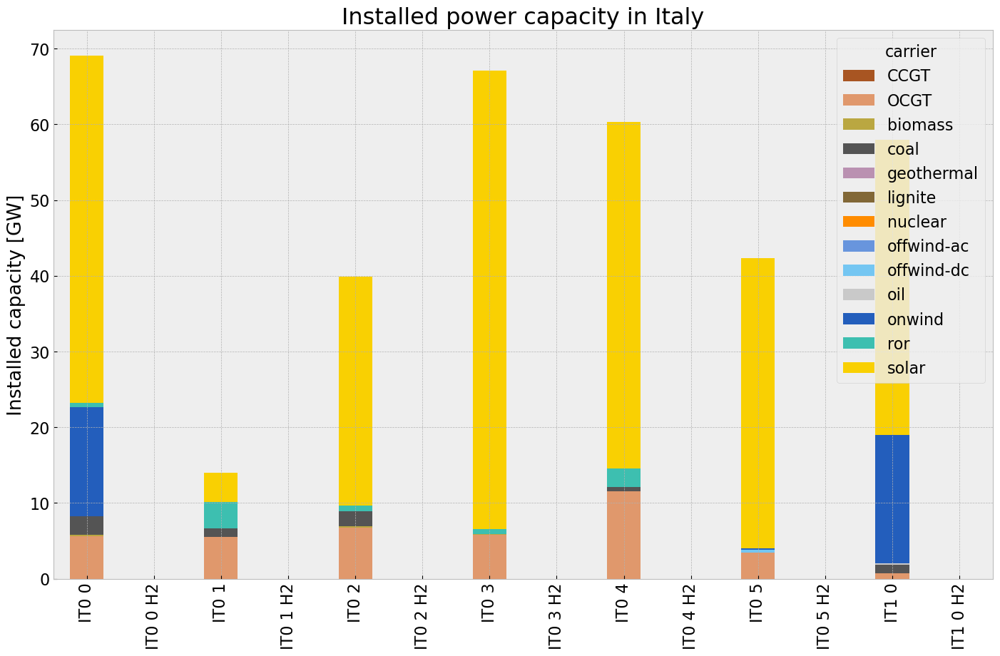

In [42]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

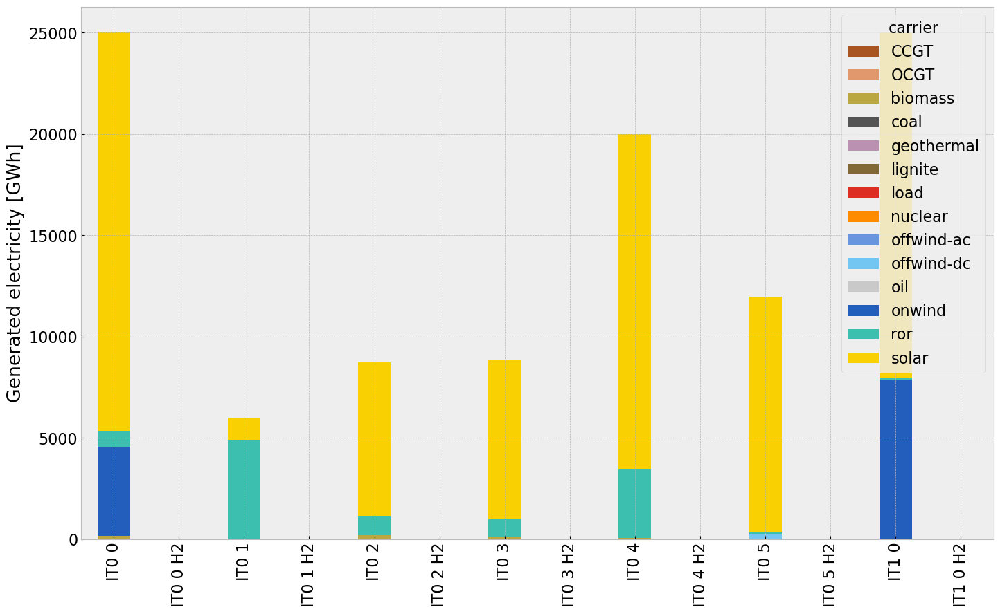

In [43]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


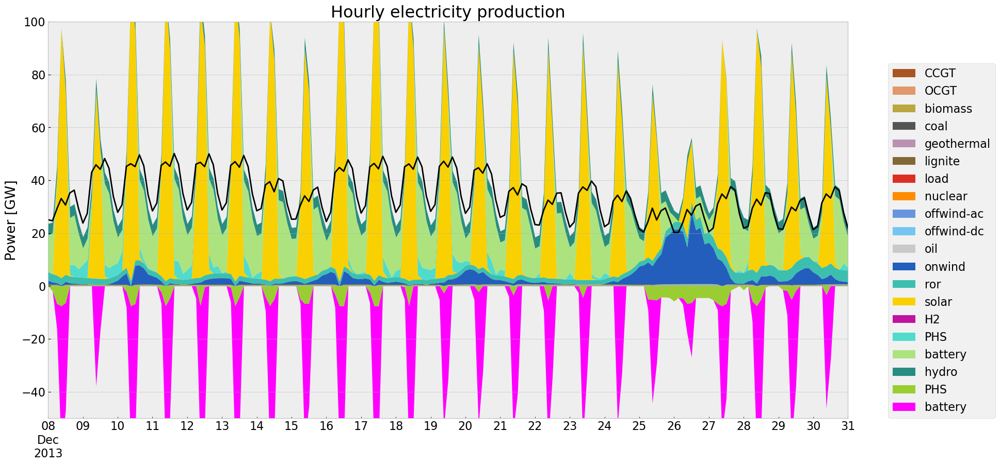

In [44]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


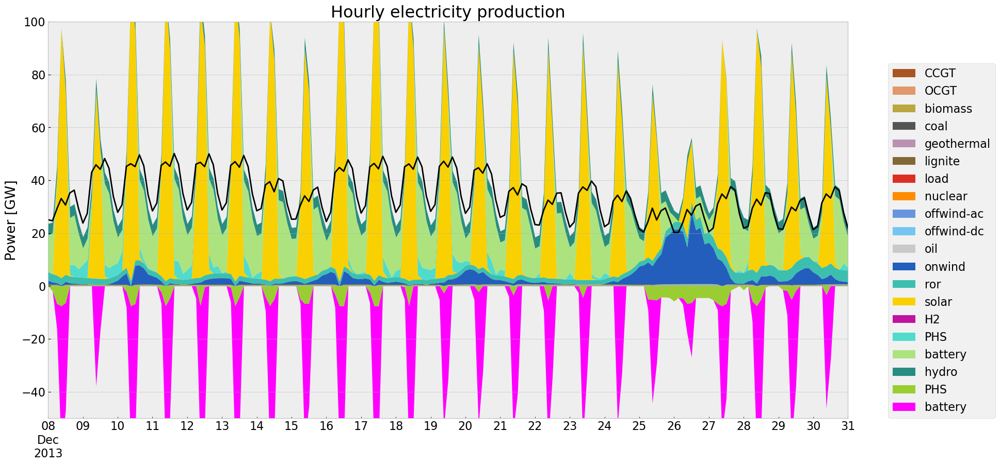

In [45]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

## Storage

carrier,H2,PHS,battery,hydro
bus,,,,
IT0 0,0.0,NaN,12.779773,0.5030
IT0 1,0.0,2.4219,0.000000,2.1556
IT0 2,0.0,0.2810,2.988811,0.2280
IT0 3,0.0,1.8160,12.570756,0.0790
IT0 4,0.0,2.2330,2.094945,1.1272
IT0 5,0.0,0.5800,10.579825,0.0240
IT1 0,0.0,0.2400,13.448854,0.0780


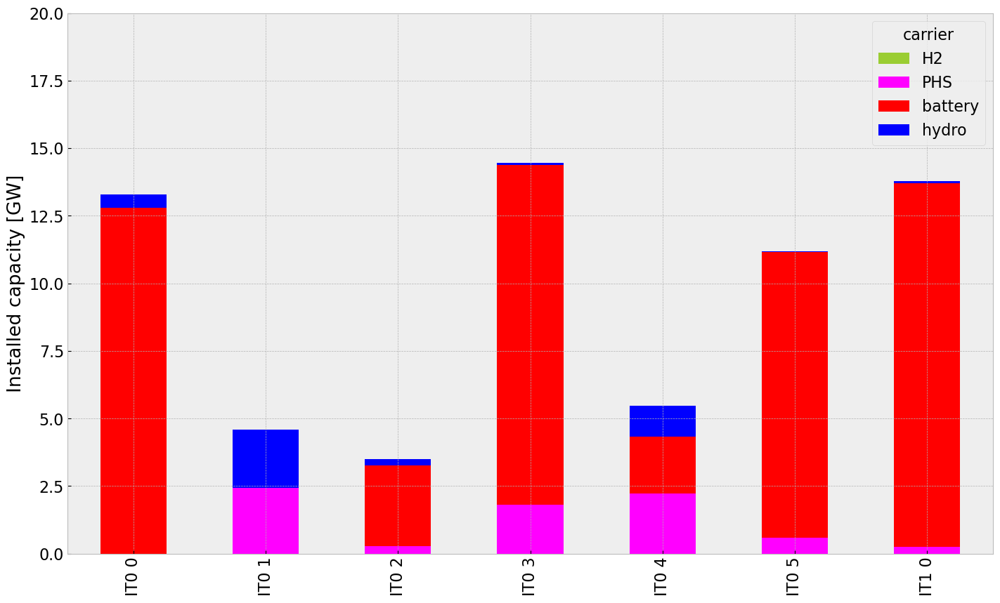

In [46]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


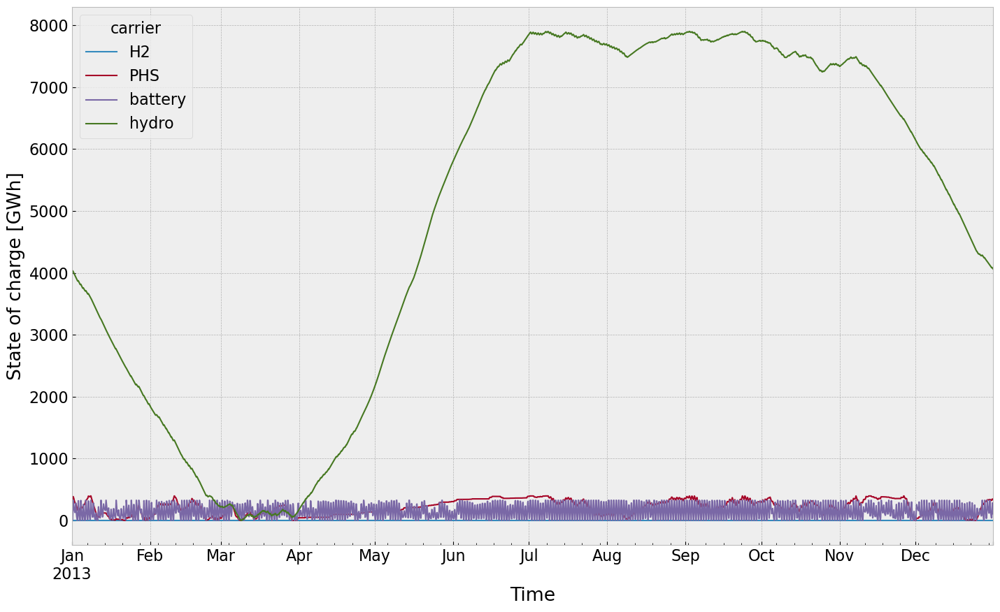

In [47]:
state_of_charge_plot(n1)


## Electricity Price


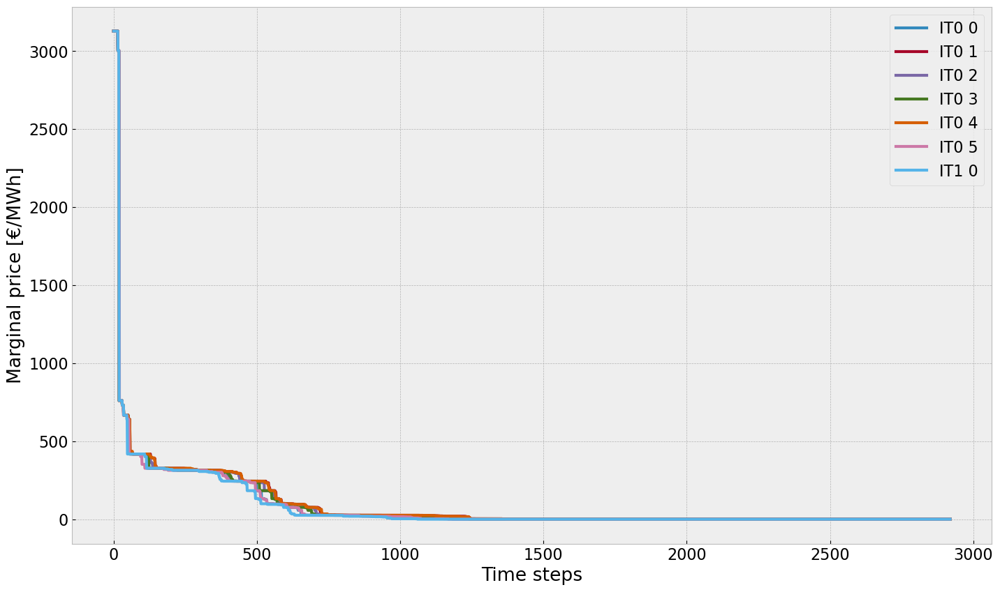

In [48]:
price_dur_curve_plot(n1)



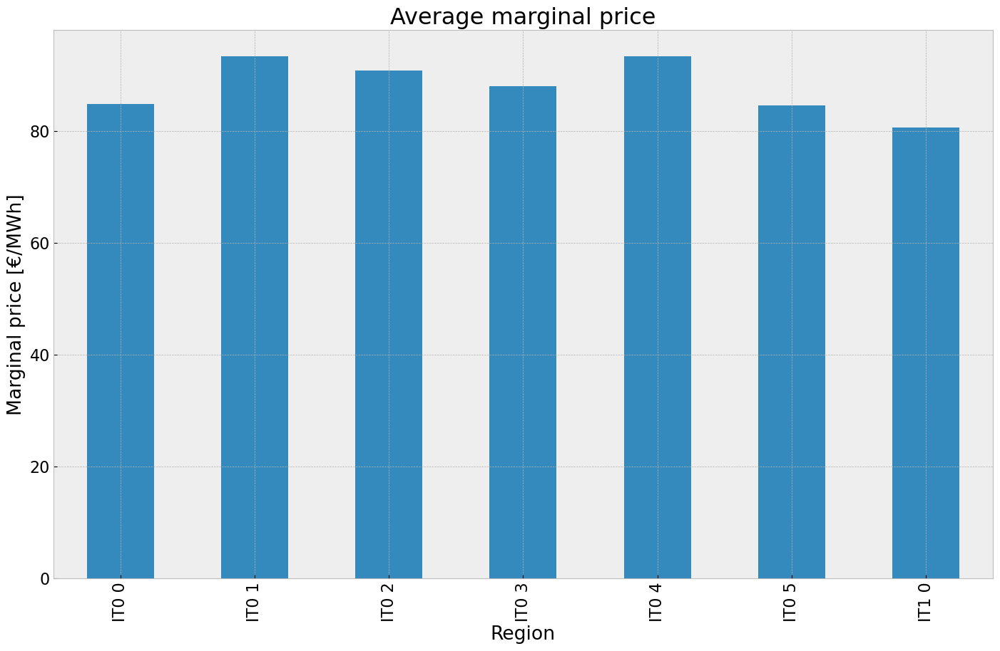

In [49]:
price_regions_table(n1)

## 2. Scenario: perfect foresight with no additional investment

In [50]:
#copy network
n2=n1.copy()

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']

In [51]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,45862.265361,0.0,True,1.0,0.019501,39296.472708,45862.265361,16635.653452,,1.0,1.0,0,0,0,1,0,45862.265361,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,3798.089184,0.0,True,1.0,0.020751,39296.472708,3798.089184,21081.614271,,1.0,1.0,0,0,0,1,0,3798.089184,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 2 solar,solar,IT0 2,22320.559121,0.0,True,1.0,0.020771,39296.472708,22320.559121,18300.762261,,1.0,1.0,0,0,0,1,0,30269.939417,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 3 solar,solar,IT0 3,60530.317049,0.0,True,1.0,0.020850,39296.472708,60530.317049,20734.931209,,1.0,1.0,0,0,0,1,0,60530.317049,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 4 solar,solar,IT0 4,41581.943613,0.0,True,1.0,0.019302,39296.472708,41581.943613,17095.252603,,1.0,1.0,0,0,0,1,0,45771.087533,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 5 solar,solar,IT0 5,37471.327854,0.0,True,1.0,0.019770,39296.472708,37471.327854,15455.916505,,1.0,1.0,0,0,0,1,0,38236.147423,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,38931.424726,0.0,True,1.0,0.019415,39296.472708,38931.424726,6273.290436,,1.0,1.0,0,0,0,1,0,38931.424726,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


In [52]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [53]:
n2.optimize(solver_name ='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]
INFO:linopy.io: Writing time: 17.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ccl77eh0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ccl77eh0.lp


Reading time = 5.05 seconds


INFO:gurobipy:Reading time = 5.05 seconds


obj: 1375449 rows, 656984 columns, 2636613 nonzeros


INFO:gurobipy:obj: 1375449 rows, 656984 columns, 2636613 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 1375449 rows, 656984 columns and 2636613 nonzeros


INFO:gurobipy:Optimize a model with 1375449 rows, 656984 columns and 2636613 nonzeros


Model fingerprint: 0x72c14e89


INFO:gurobipy:Model fingerprint: 0x72c14e89


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 3e+09]


INFO:gurobipy:  Bounds range     [1e+00, 3e+09]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1209086 rows and 313076 columns


INFO:gurobipy:Presolve removed 1209086 rows and 313076 columns


Presolve time: 2.10s


INFO:gurobipy:Presolve time: 2.10s


Presolved: 166363 rows, 343908 columns, 714649 nonzeros


INFO:gurobipy:Presolved: 166363 rows, 343908 columns, 714649 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.20s


INFO:gurobipy:Ordering time: 0.20s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 22


INFO:gurobipy: Dense cols : 22


 AA' NZ     : 3.854e+05


INFO:gurobipy: AA' NZ     : 3.854e+05


 Factor NZ  : 4.100e+06 (roughly 240 MB of memory)


INFO:gurobipy: Factor NZ  : 4.100e+06 (roughly 240 MB of memory)


 Factor Ops : 3.686e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.686e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.91915319e+15 -1.10068596e+16  4.47e+06 2.47e+05  1.37e+11     3s


INFO:gurobipy:   0   1.91915319e+15 -1.10068596e+16  4.47e+06 2.47e+05  1.37e+11     3s


   1   1.21065996e+15 -2.48629298e+15  2.26e+06 1.56e+04  5.23e+10     3s


INFO:gurobipy:   1   1.21065996e+15 -2.48629298e+15  2.26e+06 1.56e+04  5.23e+10     3s


   2   8.36702683e+14 -1.14718523e+15  1.23e+06 4.47e+03  2.83e+10     4s


INFO:gurobipy:   2   8.36702683e+14 -1.14718523e+15  1.23e+06 4.47e+03  2.83e+10     4s


   3   2.30344673e+14 -2.56749088e+14  1.18e+05 1.47e+02  3.04e+09     4s


INFO:gurobipy:   3   2.30344673e+14 -2.56749088e+14  1.18e+05 1.47e+02  3.04e+09     4s


   4   2.54780998e+13 -1.06104941e+14  1.08e+04 1.98e+01  3.84e+08     4s


INFO:gurobipy:   4   2.54780998e+13 -1.06104941e+14  1.08e+04 1.98e+01  3.84e+08     4s


   5   8.37204581e+12 -4.63917383e+13  3.27e+03 6.17e+00  1.26e+08     5s


INFO:gurobipy:   5   8.37204581e+12 -4.63917383e+13  3.27e+03 6.17e+00  1.26e+08     5s


   6   5.47932423e+12 -2.57369097e+13  1.97e+03 2.83e+00  6.90e+07     5s


INFO:gurobipy:   6   5.47932423e+12 -2.57369097e+13  1.97e+03 2.83e+00  6.90e+07     5s


   7   3.59603555e+12 -1.50086115e+13  1.09e+03 1.49e+00  3.83e+07     5s


INFO:gurobipy:   7   3.59603555e+12 -1.50086115e+13  1.09e+03 1.49e+00  3.83e+07     5s


   8   2.32121165e+12 -6.79815593e+12  6.46e+02 5.83e-01  1.86e+07     6s


INFO:gurobipy:   8   2.32121165e+12 -6.79815593e+12  6.46e+02 5.83e-01  1.86e+07     6s


   9   1.47930975e+12 -2.15038589e+12  3.94e+02 1.28e-01  7.68e+06     6s


INFO:gurobipy:   9   1.47930975e+12 -2.15038589e+12  3.94e+02 1.28e-01  7.68e+06     6s


  10   8.32293855e+11 -8.22925108e+11  2.27e+02 2.61e-02  3.47e+06     6s


INFO:gurobipy:  10   8.32293855e+11 -8.22925108e+11  2.27e+02 2.61e-02  3.47e+06     6s


  11   4.26860207e+11 -4.44926047e+11  1.22e+02 9.27e-03  1.72e+06     7s


INFO:gurobipy:  11   4.26860207e+11 -4.44926047e+11  1.22e+02 9.27e-03  1.72e+06     7s


  12   2.63161682e+11 -2.39537237e+11  7.54e+01 3.65e-03  9.44e+05     7s


INFO:gurobipy:  12   2.63161682e+11 -2.39537237e+11  7.54e+01 3.65e-03  9.44e+05     7s


  13   1.60991607e+11 -1.49923609e+11  4.41e+01 2.02e-03  5.52e+05     7s


INFO:gurobipy:  13   1.60991607e+11 -1.49923609e+11  4.41e+01 2.02e-03  5.52e+05     7s


  14   1.36804028e+11 -1.22142791e+11  3.71e+01 1.62e-03  4.52e+05     7s


INFO:gurobipy:  14   1.36804028e+11 -1.22142791e+11  3.71e+01 1.62e-03  4.52e+05     7s


  15   1.10334652e+11 -9.15037629e+10  2.82e+01 1.21e-03  3.44e+05     8s


INFO:gurobipy:  15   1.10334652e+11 -9.15037629e+10  2.82e+01 1.21e-03  3.44e+05     8s


  16   8.11355472e+10 -6.05074368e+10  1.90e+01 8.29e-04  2.34e+05     8s


INFO:gurobipy:  16   8.11355472e+10 -6.05074368e+10  1.90e+01 8.29e-04  2.34e+05     8s


  17   6.62251375e+10 -3.27144219e+10  1.41e+01 5.19e-04  1.60e+05     9s


INFO:gurobipy:  17   6.62251375e+10 -3.27144219e+10  1.41e+01 5.19e-04  1.60e+05     9s


  18   5.77643332e+10 -1.66622298e+10  1.13e+01 3.54e-04  1.18e+05     9s


INFO:gurobipy:  18   5.77643332e+10 -1.66622298e+10  1.13e+01 3.54e-04  1.18e+05     9s


  19   5.02821794e+10 -6.44014665e+09  9.12e+00 2.53e-04  8.87e+04     9s


INFO:gurobipy:  19   5.02821794e+10 -6.44014665e+09  9.12e+00 2.53e-04  8.87e+04     9s


  20   4.19709525e+10  1.36312993e+08  6.50e+00 1.89e-04  6.45e+04    10s


INFO:gurobipy:  20   4.19709525e+10  1.36312993e+08  6.50e+00 1.89e-04  6.45e+04    10s


  21   3.76077825e+10  3.18778993e+09  5.15e+00 1.61e-04  5.26e+04    10s


INFO:gurobipy:  21   3.76077825e+10  3.18778993e+09  5.15e+00 1.61e-04  5.26e+04    10s


  22   3.39919296e+10  7.13218154e+09  4.01e+00 1.25e-04  4.07e+04    11s


INFO:gurobipy:  22   3.39919296e+10  7.13218154e+09  4.01e+00 1.25e-04  4.07e+04    11s


  23   3.22888823e+10  1.13883981e+10  3.43e+00 9.00e-05  3.15e+04    11s


INFO:gurobipy:  23   3.22888823e+10  1.13883981e+10  3.43e+00 9.00e-05  3.15e+04    11s


  24   2.95458536e+10  1.38584111e+10  2.53e+00 6.88e-05  2.35e+04    12s


INFO:gurobipy:  24   2.95458536e+10  1.38584111e+10  2.53e+00 6.88e-05  2.35e+04    12s


  25   2.81945482e+10  1.66382605e+10  2.06e+00 4.63e-05  1.72e+04    12s


INFO:gurobipy:  25   2.81945482e+10  1.66382605e+10  2.06e+00 4.63e-05  1.72e+04    12s


  26   2.66698302e+10  1.78080139e+10  1.53e+00 3.68e-05  1.31e+04    13s


INFO:gurobipy:  26   2.66698302e+10  1.78080139e+10  1.53e+00 3.68e-05  1.31e+04    13s


  27   2.57999481e+10  1.96784359e+10  1.21e+00 2.20e-05  9.03e+03    13s


INFO:gurobipy:  27   2.57999481e+10  1.96784359e+10  1.21e+00 2.20e-05  9.03e+03    13s


  28   2.52468565e+10  2.05158221e+10  1.02e+00 1.52e-05  6.97e+03    14s


INFO:gurobipy:  28   2.52468565e+10  2.05158221e+10  1.02e+00 1.52e-05  6.97e+03    14s


  29   2.44907534e+10  2.10704570e+10  7.41e-01 1.08e-05  5.03e+03    14s


INFO:gurobipy:  29   2.44907534e+10  2.10704570e+10  7.41e-01 1.08e-05  5.03e+03    14s


  30   2.40969880e+10  2.15087175e+10  5.93e-01 7.54e-06  3.80e+03    14s


INFO:gurobipy:  30   2.40969880e+10  2.15087175e+10  5.93e-01 7.54e-06  3.80e+03    14s


  31   2.39075340e+10  2.17477669e+10  5.25e-01 5.69e-06  3.17e+03    15s


INFO:gurobipy:  31   2.39075340e+10  2.17477669e+10  5.25e-01 5.69e-06  3.17e+03    15s


  32   2.35184744e+10  2.19744658e+10  3.84e-01 3.91e-06  2.26e+03    15s


INFO:gurobipy:  32   2.35184744e+10  2.19744658e+10  3.84e-01 3.91e-06  2.26e+03    15s


  33   2.33071798e+10  2.20723221e+10  3.03e-01 3.18e-06  1.81e+03    16s


INFO:gurobipy:  33   2.33071798e+10  2.20723221e+10  3.03e-01 3.18e-06  1.81e+03    16s


  34   2.30752218e+10  2.21870678e+10  2.16e-01 2.33e-06  1.30e+03    16s


INFO:gurobipy:  34   2.30752218e+10  2.21870678e+10  2.16e-01 2.33e-06  1.30e+03    16s


  35   2.29855697e+10  2.22757316e+10  1.81e-01 1.69e-06  1.04e+03    16s


INFO:gurobipy:  35   2.29855697e+10  2.22757316e+10  1.81e-01 1.69e-06  1.04e+03    16s


  36   2.28761670e+10  2.23514768e+10  1.38e-01 1.15e-06  7.67e+02    17s


INFO:gurobipy:  36   2.28761670e+10  2.23514768e+10  1.38e-01 1.15e-06  7.67e+02    17s


  37   2.28035158e+10  2.23921334e+10  1.10e-01 8.80e-07  6.02e+02    17s


INFO:gurobipy:  37   2.28035158e+10  2.23921334e+10  1.10e-01 8.80e-07  6.02e+02    17s


  38   2.27415539e+10  2.24293515e+10  8.80e-02 6.26e-07  4.57e+02    18s


INFO:gurobipy:  38   2.27415539e+10  2.24293515e+10  8.80e-02 6.26e-07  4.57e+02    18s


  39   2.27092534e+10  2.24506162e+10  7.49e-02 4.88e-07  3.78e+02    18s


INFO:gurobipy:  39   2.27092534e+10  2.24506162e+10  7.49e-02 4.88e-07  3.78e+02    18s


  40   2.26399824e+10  2.24654943e+10  4.72e-02 3.92e-07  2.55e+02    18s


INFO:gurobipy:  40   2.26399824e+10  2.24654943e+10  4.72e-02 3.92e-07  2.55e+02    18s


  41   2.26169582e+10  2.24767301e+10  3.77e-02 3.20e-07  2.05e+02    19s


INFO:gurobipy:  41   2.26169582e+10  2.24767301e+10  3.77e-02 3.20e-07  2.05e+02    19s


  42   2.25986908e+10  2.24884414e+10  2.98e-02 2.46e-07  1.61e+02    19s


INFO:gurobipy:  42   2.25986908e+10  2.24884414e+10  2.98e-02 2.46e-07  1.61e+02    19s


  43   2.25871003e+10  2.24986986e+10  2.50e-02 1.83e-07  1.29e+02    20s


INFO:gurobipy:  43   2.25871003e+10  2.24986986e+10  2.50e-02 1.83e-07  1.29e+02    20s


  44   2.25730785e+10  2.25083986e+10  1.89e-02 1.25e-07  9.46e+01    20s


INFO:gurobipy:  44   2.25730785e+10  2.25083986e+10  1.89e-02 1.25e-07  9.46e+01    20s


  45   2.25611413e+10  2.25147076e+10  1.40e-02 8.70e-08  6.79e+01    20s


INFO:gurobipy:  45   2.25611413e+10  2.25147076e+10  1.40e-02 8.70e-08  6.79e+01    20s


  46   2.25565767e+10  2.25155983e+10  1.20e-02 8.18e-08  5.99e+01    21s


INFO:gurobipy:  46   2.25565767e+10  2.25155983e+10  1.20e-02 8.18e-08  5.99e+01    21s


  47   2.25513269e+10  2.25188801e+10  9.67e-03 6.29e-08  4.74e+01    21s


INFO:gurobipy:  47   2.25513269e+10  2.25188801e+10  9.67e-03 6.29e-08  4.74e+01    21s


  48   2.25453523e+10  2.25207343e+10  7.02e-03 5.23e-08  3.60e+01    22s


INFO:gurobipy:  48   2.25453523e+10  2.25207343e+10  7.02e-03 5.23e-08  3.60e+01    22s


  49   2.25430480e+10  2.25214269e+10  6.00e-03 4.86e-08  3.16e+01    22s


INFO:gurobipy:  49   2.25430480e+10  2.25214269e+10  6.00e-03 4.86e-08  3.16e+01    22s


  50   2.25422967e+10  2.25223468e+10  5.67e-03 4.36e-08  2.92e+01    22s


INFO:gurobipy:  50   2.25422967e+10  2.25223468e+10  5.67e-03 4.36e-08  2.92e+01    22s


  51   2.25398907e+10  2.25243380e+10  4.57e-03 3.30e-08  2.27e+01    23s


INFO:gurobipy:  51   2.25398907e+10  2.25243380e+10  4.57e-03 3.30e-08  2.27e+01    23s


  52   2.25368509e+10  2.25261260e+10  3.14e-03 2.29e-08  1.57e+01    23s


INFO:gurobipy:  52   2.25368509e+10  2.25261260e+10  3.14e-03 2.29e-08  1.57e+01    23s


  53   2.25355133e+10  2.25275990e+10  2.51e-03 1.46e-08  1.16e+01    24s


INFO:gurobipy:  53   2.25355133e+10  2.25275990e+10  2.51e-03 1.46e-08  1.16e+01    24s


  54   2.25340355e+10  2.25286185e+10  1.80e-03 9.05e-09  7.93e+00    24s


INFO:gurobipy:  54   2.25340355e+10  2.25286185e+10  1.80e-03 9.05e-09  7.93e+00    24s


  55   2.25331324e+10  2.25292587e+10  1.35e-03 9.33e-08  5.67e+00    25s


INFO:gurobipy:  55   2.25331324e+10  2.25292587e+10  1.35e-03 9.33e-08  5.67e+00    25s


  56   2.25325263e+10  2.25294823e+10  1.08e-03 1.84e-07  4.46e+00    25s


INFO:gurobipy:  56   2.25325263e+10  2.25294823e+10  1.08e-03 1.84e-07  4.46e+00    25s


  57   2.25321033e+10  2.25297277e+10  8.74e-04 1.17e-07  3.48e+00    26s


INFO:gurobipy:  57   2.25321033e+10  2.25297277e+10  8.74e-04 1.17e-07  3.48e+00    26s


  58   2.25314691e+10  2.25299595e+10  5.66e-04 7.92e-08  2.21e+00    26s


INFO:gurobipy:  58   2.25314691e+10  2.25299595e+10  5.66e-04 7.92e-08  2.21e+00    26s


  59   2.25310607e+10  2.25300819e+10  3.64e-04 4.95e-08  1.43e+00    26s


INFO:gurobipy:  59   2.25310607e+10  2.25300819e+10  3.64e-04 4.95e-08  1.43e+00    26s


  60   2.25309917e+10  2.25301323e+10  3.29e-04 4.37e-08  1.26e+00    27s


INFO:gurobipy:  60   2.25309917e+10  2.25301323e+10  3.29e-04 4.37e-08  1.26e+00    27s


  61   2.25309641e+10  2.25301455e+10  3.15e-04 4.72e-08  1.20e+00    27s


INFO:gurobipy:  61   2.25309641e+10  2.25301455e+10  3.15e-04 4.72e-08  1.20e+00    27s


  62   2.25309062e+10  2.25302026e+10  2.87e-04 5.30e-08  1.03e+00    28s


INFO:gurobipy:  62   2.25309062e+10  2.25302026e+10  2.87e-04 5.30e-08  1.03e+00    28s


  63   2.25308379e+10  2.25302158e+10  2.52e-04 5.15e-08  9.12e-01    28s


INFO:gurobipy:  63   2.25308379e+10  2.25302158e+10  2.52e-04 5.15e-08  9.12e-01    28s


  64   2.25307425e+10  2.25302242e+10  2.08e-04 5.25e-08  7.59e-01    28s


INFO:gurobipy:  64   2.25307425e+10  2.25302242e+10  2.08e-04 5.25e-08  7.59e-01    28s


  65   2.25306636e+10  2.25302592e+10  1.83e-04 1.27e-07  5.93e-01    29s


INFO:gurobipy:  65   2.25306636e+10  2.25302592e+10  1.83e-04 1.27e-07  5.93e-01    29s


  66   2.25306427e+10  2.25302656e+10  1.73e-04 1.24e-07  5.53e-01    29s


INFO:gurobipy:  66   2.25306427e+10  2.25302656e+10  1.73e-04 1.24e-07  5.53e-01    29s


  67   2.25305333e+10  2.25302856e+10  1.23e-04 1.38e-07  3.63e-01    29s


INFO:gurobipy:  67   2.25305333e+10  2.25302856e+10  1.23e-04 1.38e-07  3.63e-01    29s


  68   2.25304694e+10  2.25303050e+10  8.85e-05 2.16e-07  2.41e-01    30s


INFO:gurobipy:  68   2.25304694e+10  2.25303050e+10  8.85e-05 2.16e-07  2.41e-01    30s


  69   2.25304246e+10  2.25303131e+10  5.99e-05 1.15e-07  1.64e-01    30s


INFO:gurobipy:  69   2.25304246e+10  2.25303131e+10  5.99e-05 1.15e-07  1.64e-01    30s


  70   2.25303973e+10  2.25303214e+10  4.04e-05 5.03e-08  1.11e-01    30s


INFO:gurobipy:  70   2.25303973e+10  2.25303214e+10  4.04e-05 5.03e-08  1.11e-01    30s


  71   2.25303836e+10  2.25303276e+10  3.00e-05 5.62e-08  8.22e-02    31s


INFO:gurobipy:  71   2.25303836e+10  2.25303276e+10  3.00e-05 5.62e-08  8.22e-02    31s


  72   2.25303700e+10  2.25303319e+10  2.51e-05 3.02e-08  5.59e-02    31s


INFO:gurobipy:  72   2.25303700e+10  2.25303319e+10  2.51e-05 3.02e-08  5.59e-02    31s


  73   2.25303612e+10  2.25303340e+10  3.01e-05 2.04e-08  3.99e-02    31s


INFO:gurobipy:  73   2.25303612e+10  2.25303340e+10  3.01e-05 2.04e-08  3.99e-02    31s


  74   2.25303572e+10  2.25303345e+10  1.00e-04 1.52e-08  3.33e-02    32s


INFO:gurobipy:  74   2.25303572e+10  2.25303345e+10  1.00e-04 1.52e-08  3.33e-02    32s


  75   2.25303540e+10  2.25303354e+10  8.31e-05 1.27e-08  2.73e-02    32s


INFO:gurobipy:  75   2.25303540e+10  2.25303354e+10  8.31e-05 1.27e-08  2.73e-02    32s


  76   2.25303495e+10  2.25303365e+10  5.57e-05 8.72e-09  1.89e-02    32s


INFO:gurobipy:  76   2.25303495e+10  2.25303365e+10  5.57e-05 8.72e-09  1.89e-02    32s


  77   2.25303477e+10  2.25303377e+10  4.78e-05 4.34e-09  1.47e-02    33s


INFO:gurobipy:  77   2.25303477e+10  2.25303377e+10  4.78e-05 4.34e-09  1.47e-02    33s


  78   2.25303445e+10  2.25303379e+10  2.91e-05 3.85e-09  9.67e-03    33s


INFO:gurobipy:  78   2.25303445e+10  2.25303379e+10  2.91e-05 3.85e-09  9.67e-03    33s


  79   2.25303430e+10  2.25303385e+10  2.03e-05 2.12e-09  6.70e-03    33s


INFO:gurobipy:  79   2.25303430e+10  2.25303385e+10  2.03e-05 2.12e-09  6.70e-03    33s


  80   2.25303422e+10  2.25303388e+10  1.44e-05 1.66e-09  4.97e-03    34s


INFO:gurobipy:  80   2.25303422e+10  2.25303388e+10  1.44e-05 1.66e-09  4.97e-03    34s


  81   2.25303412e+10  2.25303391e+10  9.32e-06 8.59e-10  3.14e-03    34s


INFO:gurobipy:  81   2.25303412e+10  2.25303391e+10  9.32e-06 8.59e-10  3.14e-03    34s


  82   2.25303403e+10  2.25303393e+10  4.54e-06 3.51e-10  1.55e-03    34s


INFO:gurobipy:  82   2.25303403e+10  2.25303393e+10  4.54e-06 3.51e-10  1.55e-03    34s


  83   2.25303399e+10  2.25303394e+10  2.39e-06 4.95e-10  8.10e-04    35s


INFO:gurobipy:  83   2.25303399e+10  2.25303394e+10  2.39e-06 4.95e-10  8.10e-04    35s


  84   2.25303397e+10  2.25303394e+10  1.28e-06 4.38e-10  4.48e-04    35s


INFO:gurobipy:  84   2.25303397e+10  2.25303394e+10  1.28e-06 4.38e-10  4.48e-04    35s


  85   2.25303396e+10  2.25303394e+10  6.39e-06 9.34e-10  2.60e-04    35s


INFO:gurobipy:  85   2.25303396e+10  2.25303394e+10  6.39e-06 9.34e-10  2.60e-04    35s


  86   2.25303395e+10  2.25303394e+10  3.74e-06 7.25e-09  1.06e-04    36s


INFO:gurobipy:  86   2.25303395e+10  2.25303394e+10  3.74e-06 7.25e-09  1.06e-04    36s


  87   2.25303395e+10  2.25303394e+10  6.28e-06 1.89e-10  8.41e-05    36s


INFO:gurobipy:  87   2.25303395e+10  2.25303394e+10  6.28e-06 1.89e-10  8.41e-05    36s


  88   2.25303395e+10  2.25303394e+10  2.48e-05 8.67e-09  1.92e-05    37s


INFO:gurobipy:  88   2.25303395e+10  2.25303394e+10  2.48e-05 8.67e-09  1.92e-05    37s


  89   2.25303394e+10  2.25303394e+10  1.09e-05 4.22e-09  3.94e-06    37s


INFO:gurobipy:  89   2.25303394e+10  2.25303394e+10  1.09e-05 4.22e-09  3.94e-06    37s


  90   2.25303394e+10  2.25303394e+10  8.19e-05 4.45e-08  1.49e-07    37s


INFO:gurobipy:  90   2.25303394e+10  2.25303394e+10  8.19e-05 4.45e-08  1.49e-07    37s


  91   2.25303394e+10  2.25303394e+10  4.07e-05 4.46e-08  1.19e-07    38s


INFO:gurobipy:  91   2.25303394e+10  2.25303394e+10  4.07e-05 4.46e-08  1.19e-07    38s


INFO:gurobipy:


Barrier solved model in 91 iterations and 37.73 seconds (14.36 work units)


INFO:gurobipy:Barrier solved model in 91 iterations and 37.73 seconds (14.36 work units)


Optimal objective 2.25303394e+10


INFO:gurobipy:Optimal objective 2.25303394e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   14726 DPushes remaining with DInf 0.0000000e+00                38s


INFO:gurobipy:   14726 DPushes remaining with DInf 0.0000000e+00                38s


       0 DPushes remaining with DInf 0.0000000e+00                39s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                39s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.25


INFO:gurobipy:


   57954 PPushes remaining with PInf 1.7457130e-04                39s


INFO:gurobipy:   57954 PPushes remaining with PInf 1.7457130e-04                39s


   16727 PPushes remaining with PInf 9.1876242e-04                45s


INFO:gurobipy:   16727 PPushes remaining with PInf 9.1876242e-04                45s


   15388 PPushes remaining with PInf 9.1876319e-04                47s


INFO:gurobipy:   15388 PPushes remaining with PInf 9.1876319e-04                47s


   13976 PPushes remaining with PInf 9.1876254e-04                50s


INFO:gurobipy:   13976 PPushes remaining with PInf 9.1876254e-04                50s


       0 PPushes remaining with PInf 0.0000000e+00                55s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                55s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 5.3105296e-01     55s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 5.3105296e-01     55s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   67274    2.2530339e+10   0.000000e+00   5.310529e-01     55s


INFO:gurobipy:   67274    2.2530339e+10   0.000000e+00   5.310529e-01     55s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   67277    2.2530339e+10   0.000000e+00   0.000000e+00     56s


INFO:gurobipy:   67277    2.2530339e+10   0.000000e+00   0.000000e+00     56s


INFO:gurobipy:


Solved in 67277 iterations and 55.96 seconds (21.40 work units)


INFO:gurobipy:Solved in 67277 iterations and 55.96 seconds (21.40 work units)


Optimal objective  2.253033945e+10


INFO:gurobipy:Optimal objective  2.253033945e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 656984 primals, 1375449 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper

('ok', 'optimal')

In [54]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

In [55]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,45862.265361,0.0,True,1.0,0.019501,39296.472708,45862.265361,16635.653452,,1.0,1.0,0,0,0,1,0,45862.265361,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,3798.089184,0.0,True,1.0,0.020751,39296.472708,3798.089184,21081.614271,,1.0,1.0,0,0,0,1,0,3798.089184,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 2 solar,solar,IT0 2,22320.559121,0.0,True,1.0,0.020771,39296.472708,22320.559121,18300.762261,,1.0,1.0,0,0,0,1,0,22320.559121,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 3 solar,solar,IT0 3,60530.317049,0.0,True,1.0,0.020850,39296.472708,60530.317049,20734.931209,,1.0,1.0,0,0,0,1,0,60530.317049,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 4 solar,solar,IT0 4,41581.943613,0.0,True,1.0,0.019302,39296.472708,41581.943613,17095.252603,,1.0,1.0,0,0,0,1,0,41581.943613,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 5 solar,solar,IT0 5,37471.327854,0.0,True,1.0,0.019770,39296.472708,37471.327854,15455.916505,,1.0,1.0,0,0,0,1,0,37471.327853,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,38931.424726,0.0,True,1.0,0.019415,39296.472708,38931.424726,6273.290436,,1.0,1.0,0,0,0,1,0,38931.424726,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


<Figure size 640x480 with 0 Axes>

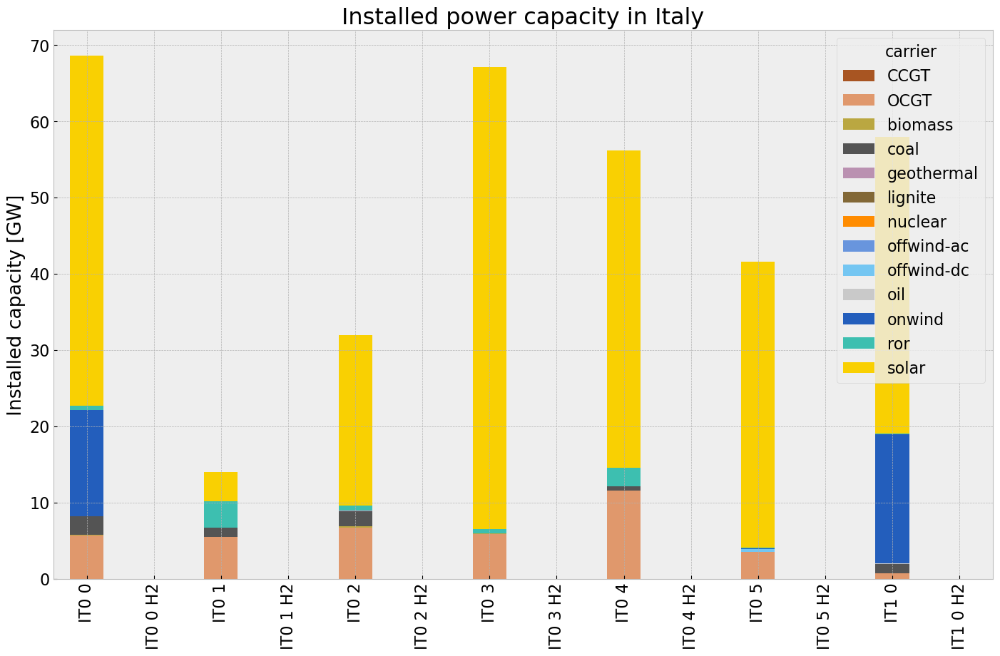

In [56]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

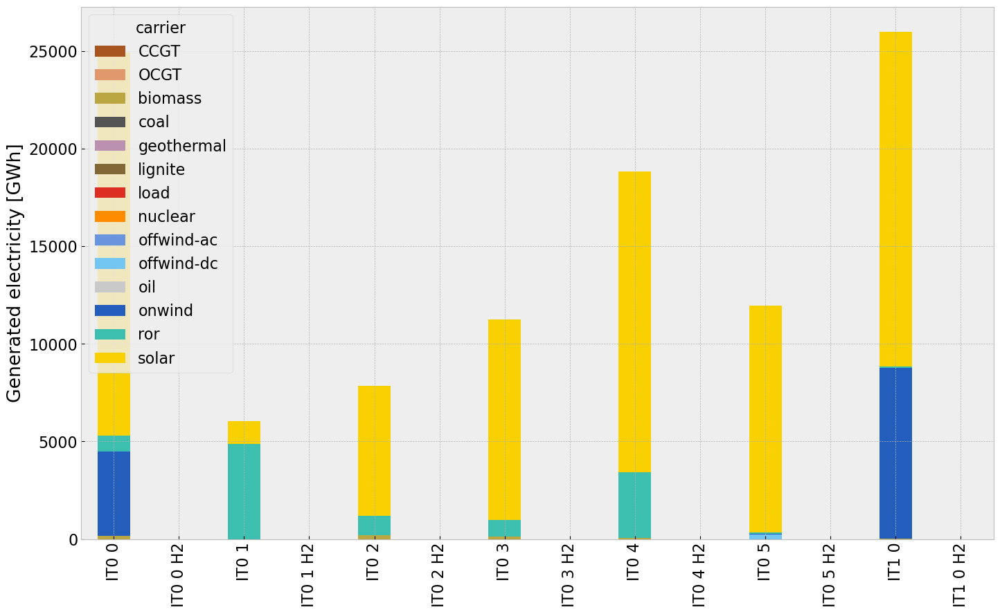

In [57]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3164538613.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3164538613.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage

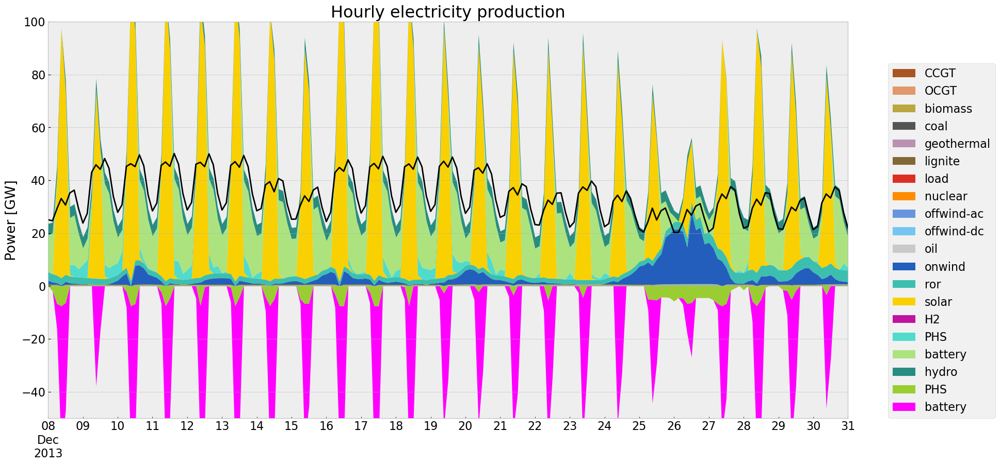

In [58]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


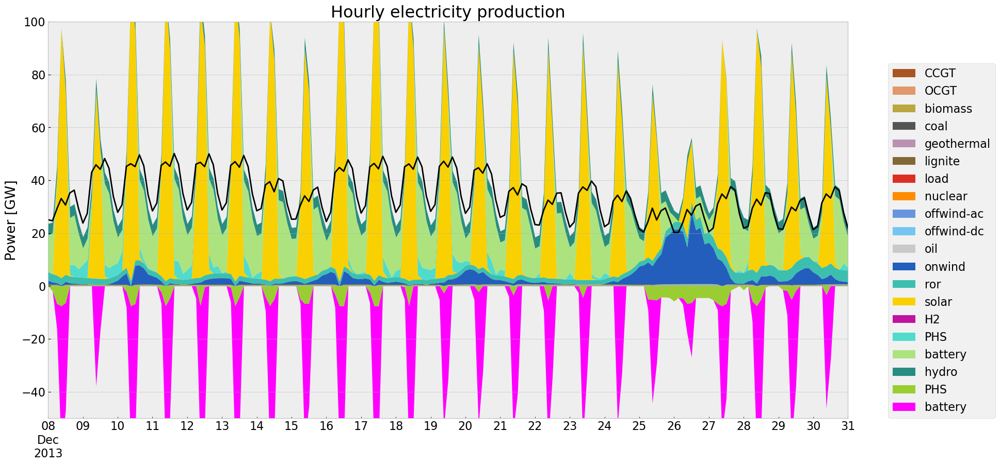

In [59]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)



C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3374477851.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3374477851.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


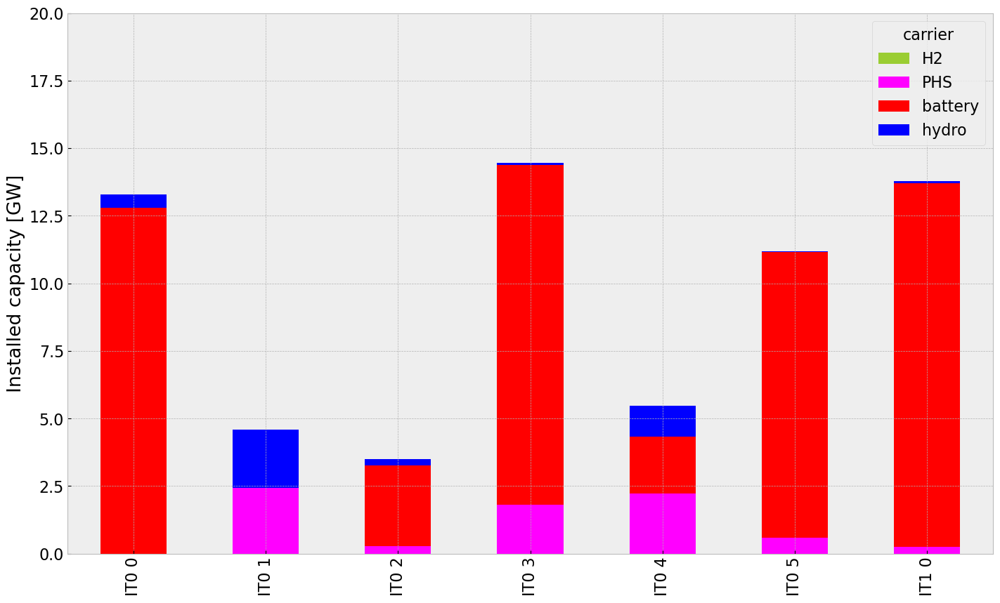

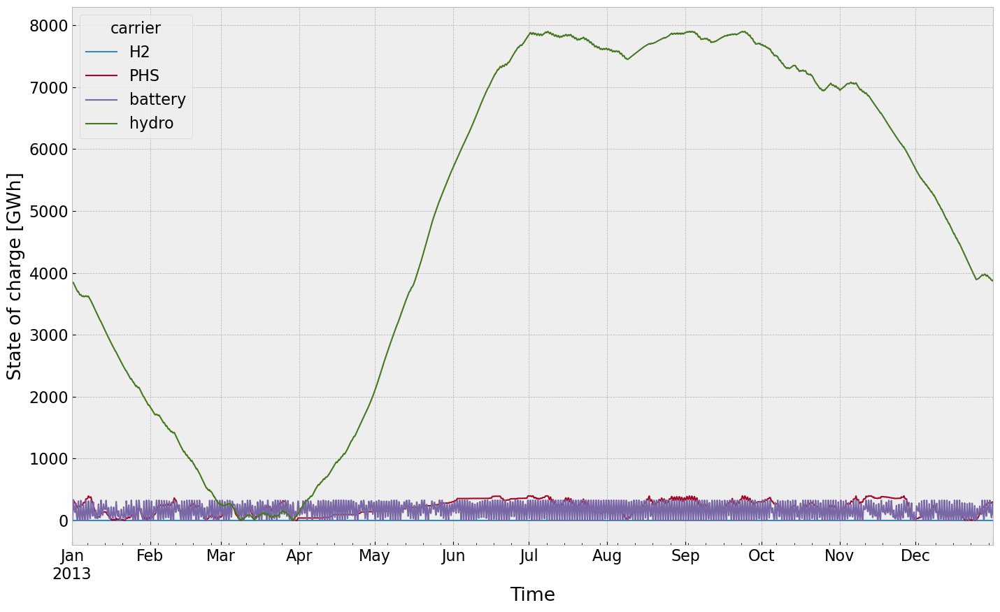

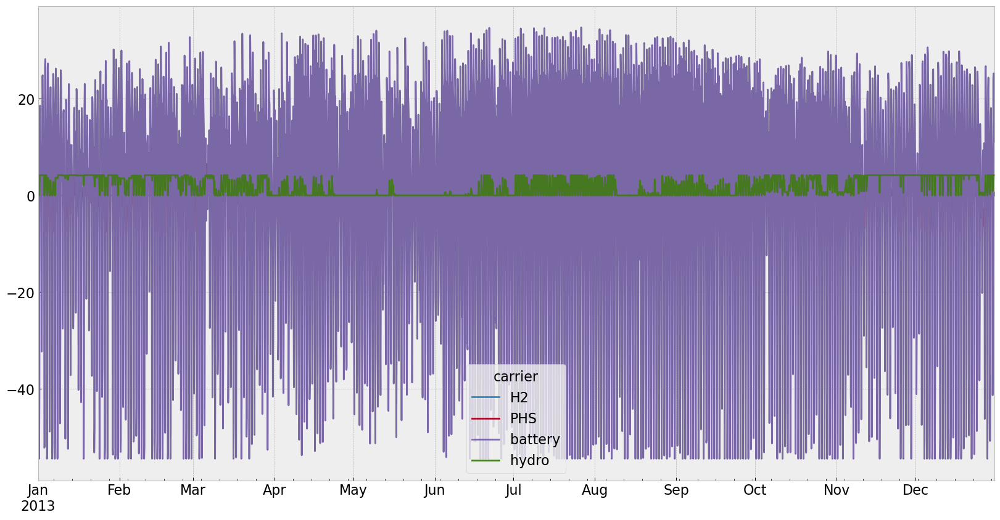

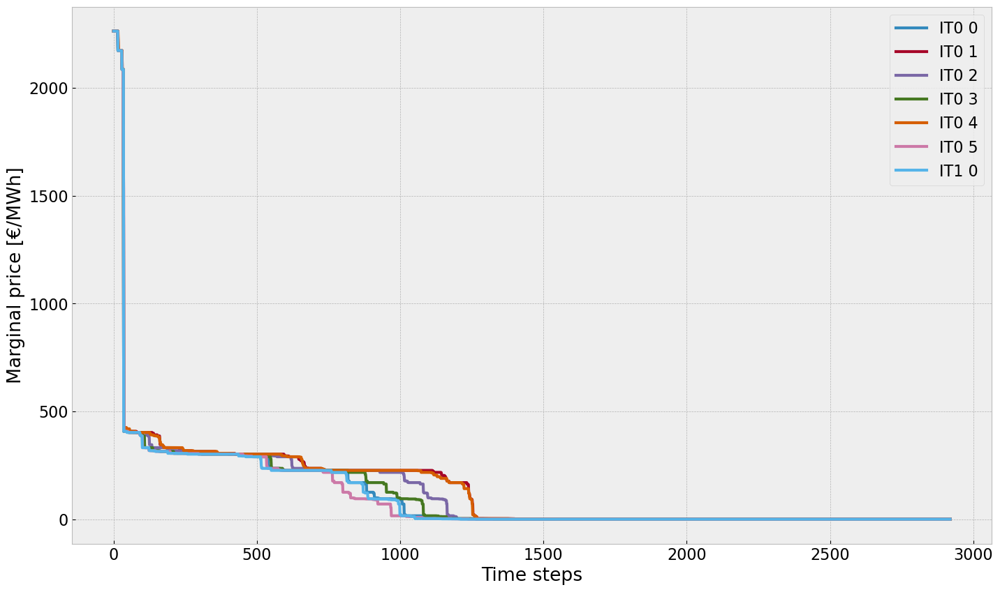

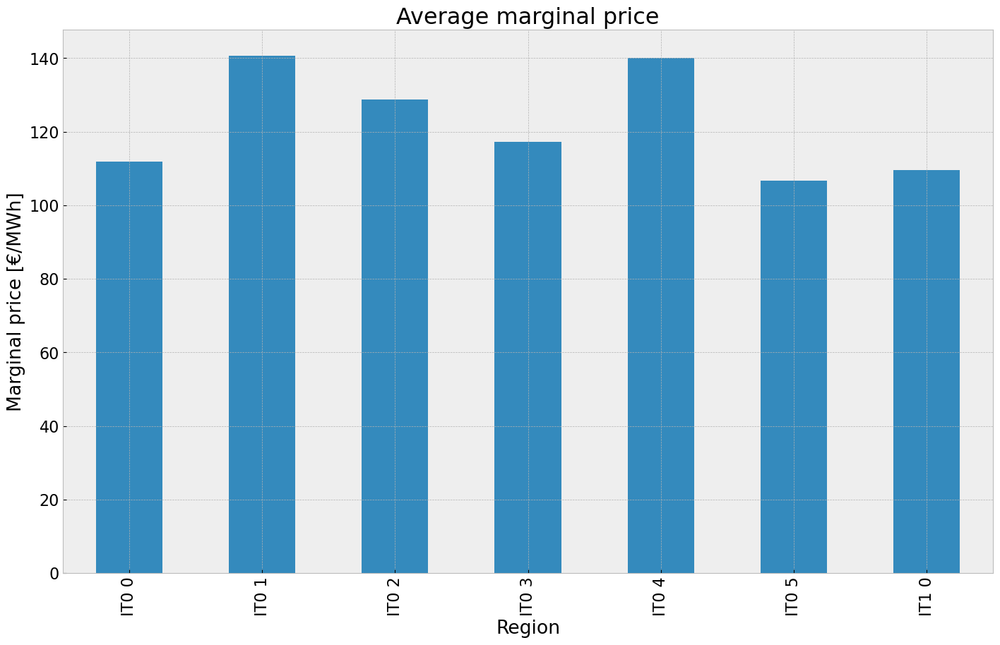

In [60]:
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
price_dur_curve_plot(n2)
price_regions_table(n2)


## 3. Scenario: rolling horizon foresight with no additional investment

In [61]:
n3= n2.copy()
n3.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [62]:
optimize.optimize_with_rolling_horizon(n3, horizon=24, overlap=0,
                                       solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sjhu8c5b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sjhu8c5b.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21769 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21769 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


Model fingerprint: 0x504bc61b


INFO:gurobipy:Model fingerprint: 0x504bc61b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2644 columns


INFO:gurobipy:Presolve removed 10065 rows and 2644 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2831 columns, 5857 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2831 columns, 5857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1357    2.2576482e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1357    2.2576482e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1357 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1357 iterations and 0.09 seconds (0.04 work units)


Optimal objective  2.257648247e+10


INFO:gurobipy:Optimal objective  2.257648247e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.26e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k5p8mrpr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k5p8mrpr.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21780 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21780 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21780 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21780 nonzeros


Model fingerprint: 0x699be90d


INFO:gurobipy:Model fingerprint: 0x699be90d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2626 columns


INFO:gurobipy:Presolve removed 10065 rows and 2626 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1248    1.8900860e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1248    1.8900860e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1248 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1248 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.890086025e+10


INFO:gurobipy:Optimal objective  1.890086025e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9pnr9lx9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9pnr9lx9.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21682 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21682 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21682 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21682 nonzeros


Model fingerprint: 0xf29ac64f


INFO:gurobipy:Model fingerprint: 0xf29ac64f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2634 columns


INFO:gurobipy:Presolve removed 10065 rows and 2634 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2841 columns, 5867 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2841 columns, 5867 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1448    2.4836952e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1448    2.4836952e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1448 iterations and 0.09 seconds (0.05 work units)


INFO:gurobipy:Solved in 1448 iterations and 0.09 seconds (0.05 work units)


Optimal objective  2.483695249e+10


INFO:gurobipy:Optimal objective  2.483695249e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.48e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imndzaqj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imndzaqj.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21795 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21795 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21795 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21795 nonzeros


Model fingerprint: 0x00b27fa8


INFO:gurobipy:Model fingerprint: 0x00b27fa8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2622 columns


INFO:gurobipy:Presolve removed 10065 rows and 2622 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2853 columns, 5879 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2853 columns, 5879 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1171    2.3376964e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1171    2.3376964e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1171 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1171 iterations and 0.07 seconds (0.03 work units)


Optimal objective  2.337696422e+10


INFO:gurobipy:Optimal objective  2.337696422e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.34e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0rzov97.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0rzov97.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21866 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21866 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21866 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21866 nonzeros


Model fingerprint: 0xf0989a92


INFO:gurobipy:Model fingerprint: 0xf0989a92


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2620 columns


INFO:gurobipy:Presolve removed 10065 rows and 2620 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2855 columns, 5881 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2855 columns, 5881 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1185    2.5324419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1185    2.5324419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1185 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1185 iterations and 0.08 seconds (0.03 work units)


Optimal objective  2.532441888e+10


INFO:gurobipy:Optimal objective  2.532441888e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.53e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-flu2obp8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-flu2obp8.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21867 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21867 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21867 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21867 nonzeros


Model fingerprint: 0x7318e952


INFO:gurobipy:Model fingerprint: 0x7318e952


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2618 columns


INFO:gurobipy:Presolve removed 10065 rows and 2618 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1166    2.2201169e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1166    2.2201169e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1166 iterations and 0.07 seconds (0.04 work units)


INFO:gurobipy:Solved in 1166 iterations and 0.07 seconds (0.04 work units)


Optimal objective  2.220116906e+10


INFO:gurobipy:Optimal objective  2.220116906e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.22e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pfqkqir.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pfqkqir.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21837 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21837 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21837 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21837 nonzeros


Model fingerprint: 0xa12f8053


INFO:gurobipy:Model fingerprint: 0xa12f8053


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2624 columns


INFO:gurobipy:Presolve removed 10065 rows and 2624 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1219    2.3799084e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1219    2.3799084e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1219 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1219 iterations and 0.08 seconds (0.04 work units)


Optimal objective  2.379908433e+10


INFO:gurobipy:Optimal objective  2.379908433e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.38e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ecn50qgq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ecn50qgq.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21869 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21869 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21869 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21869 nonzeros


Model fingerprint: 0x5e6b5da3


INFO:gurobipy:Model fingerprint: 0x5e6b5da3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1199    2.0916528e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1199    2.0916528e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1199 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1199 iterations and 0.09 seconds (0.04 work units)


Optimal objective  2.091652797e+10


INFO:gurobipy:Optimal objective  2.091652797e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.09e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-43u9os58.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-43u9os58.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21852 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21852 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


Model fingerprint: 0x8ae1a4d3


INFO:gurobipy:Model fingerprint: 0x8ae1a4d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1491    1.9110183e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1491    1.9110183e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1491 iterations and 0.09 seconds (0.06 work units)


INFO:gurobipy:Solved in 1491 iterations and 0.09 seconds (0.06 work units)


Optimal objective  1.911018319e+10


INFO:gurobipy:Optimal objective  1.911018319e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bmxswl4_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bmxswl4_.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21807 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21807 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21807 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21807 nonzeros


Model fingerprint: 0xf94bd202


INFO:gurobipy:Model fingerprint: 0xf94bd202


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2616 columns


INFO:gurobipy:Presolve removed 10065 rows and 2616 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1231    2.4460840e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1231    2.4460840e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1231 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 1231 iterations and 0.09 seconds (0.03 work units)


Optimal objective  2.446083964e+10


INFO:gurobipy:Optimal objective  2.446083964e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.45e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t7o_gf6j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t7o_gf6j.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21840 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21840 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


Model fingerprint: 0x8cbb2b14


INFO:gurobipy:Model fingerprint: 0x8cbb2b14


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1313    2.0810471e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1313    2.0810471e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1313 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1313 iterations and 0.08 seconds (0.04 work units)


Optimal objective  2.081047115e+10


INFO:gurobipy:Optimal objective  2.081047115e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.08e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ltwovtac.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ltwovtac.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21863 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21863 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21863 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21863 nonzeros


Model fingerprint: 0x5bcf61fa


INFO:gurobipy:Model fingerprint: 0x5bcf61fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2610 columns


INFO:gurobipy:Presolve removed 10065 rows and 2610 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1504    1.9567923e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1504    1.9567923e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1504 iterations and 0.09 seconds (0.05 work units)


INFO:gurobipy:Solved in 1504 iterations and 0.09 seconds (0.05 work units)


Optimal objective  1.956792335e+10


INFO:gurobipy:Optimal objective  1.956792335e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fcqmqyu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fcqmqyu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21882 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21882 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21882 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21882 nonzeros


Model fingerprint: 0x0257dd01


INFO:gurobipy:Model fingerprint: 0x0257dd01


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2609 columns


INFO:gurobipy:Presolve removed 10065 rows and 2609 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1242    2.0365831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1242    2.0365831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1242 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1242 iterations and 0.08 seconds (0.04 work units)


Optimal objective  2.036583137e+10


INFO:gurobipy:Optimal objective  2.036583137e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.04e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttvell4x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttvell4x.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21843 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21843 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21843 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21843 nonzeros


Model fingerprint: 0x97002167


INFO:gurobipy:Model fingerprint: 0x97002167


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1637    2.0130754e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1637    2.0130754e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1637 iterations and 0.08 seconds (0.05 work units)


INFO:gurobipy:Solved in 1637 iterations and 0.08 seconds (0.05 work units)


Optimal objective  2.013075374e+10


INFO:gurobipy:Optimal objective  2.013075374e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cg6rna57.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cg6rna57.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21858 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21858 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21858 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21858 nonzeros


Model fingerprint: 0x745fadaa


INFO:gurobipy:Model fingerprint: 0x745fadaa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1153    2.3234506e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1153    2.3234506e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1153 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1153 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.323450563e+10


INFO:gurobipy:Optimal objective  2.323450563e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.32e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zu8p_z3w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zu8p_z3w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21794 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21794 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21794 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21794 nonzeros


Model fingerprint: 0xe83e5b9d


INFO:gurobipy:Model fingerprint: 0xe83e5b9d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2629 columns


INFO:gurobipy:Presolve removed 10065 rows and 2629 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1289    1.9145973e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1289    1.9145973e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1289 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1289 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.914597346e+10


INFO:gurobipy:Optimal objective  1.914597346e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0iq786bo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0iq786bo.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21800 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21800 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21800 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21800 nonzeros


Model fingerprint: 0x5b4c4d08


INFO:gurobipy:Model fingerprint: 0x5b4c4d08


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2635 columns


INFO:gurobipy:Presolve removed 10065 rows and 2635 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2840 columns, 5866 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2840 columns, 5866 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1535    2.3367696e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1535    2.3367696e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1535 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1535 iterations and 0.10 seconds (0.05 work units)


Optimal objective  2.336769650e+10


INFO:gurobipy:Optimal objective  2.336769650e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.34e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0oobpssl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0oobpssl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21873 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21873 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21873 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21873 nonzeros


Model fingerprint: 0x31b249a0


INFO:gurobipy:Model fingerprint: 0x31b249a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1392    2.4053556e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1392    2.4053556e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1392 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1392 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.405355620e+10


INFO:gurobipy:Optimal objective  2.405355620e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.41e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9rxekdz2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9rxekdz2.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21867 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21867 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21867 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21867 nonzeros


Model fingerprint: 0xd223e80b


INFO:gurobipy:Model fingerprint: 0xd223e80b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2614 columns


INFO:gurobipy:Presolve removed 10065 rows and 2614 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1650    2.0319381e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1650    2.0319381e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1650 iterations and 0.10 seconds (0.06 work units)


INFO:gurobipy:Solved in 1650 iterations and 0.10 seconds (0.06 work units)


Optimal objective  2.031938147e+10


INFO:gurobipy:Optimal objective  2.031938147e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.03e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zajku6qs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zajku6qs.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21819 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21819 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21819 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21819 nonzeros


Model fingerprint: 0xf4299889


INFO:gurobipy:Model fingerprint: 0xf4299889


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2617 columns


INFO:gurobipy:Presolve removed 10065 rows and 2617 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2858 columns, 5884 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2858 columns, 5884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1366    1.9894922e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1366    1.9894922e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1366 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1366 iterations and 0.09 seconds (0.04 work units)


Optimal objective  1.989492169e+10


INFO:gurobipy:Optimal objective  1.989492169e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uf72h4uk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uf72h4uk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21792 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21792 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21792 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21792 nonzeros


Model fingerprint: 0x111465fe


INFO:gurobipy:Model fingerprint: 0x111465fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2623 columns


INFO:gurobipy:Presolve removed 10065 rows and 2623 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2852 columns, 5878 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2852 columns, 5878 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1339    1.8918803e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1339    1.8918803e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1339 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1339 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.891880252e+10


INFO:gurobipy:Optimal objective  1.891880252e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h3eufkud.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h3eufkud.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21864 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21864 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


Model fingerprint: 0xf4872d02


INFO:gurobipy:Model fingerprint: 0xf4872d02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2614 columns


INFO:gurobipy:Presolve removed 10065 rows and 2614 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1480    2.3348357e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1480    2.3348357e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1480 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1480 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.334835693e+10


INFO:gurobipy:Optimal objective  2.334835693e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.33e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kmrpfx0q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kmrpfx0q.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21840 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21840 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


Model fingerprint: 0xed3bb647


INFO:gurobipy:Model fingerprint: 0xed3bb647


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1351    1.9012810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1351    1.9012810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1351 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1351 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.901280973e+10


INFO:gurobipy:Optimal objective  1.901280973e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7luk5bdn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7luk5bdn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21817 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21817 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21817 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21817 nonzeros


Model fingerprint: 0x737fa5a4


INFO:gurobipy:Model fingerprint: 0x737fa5a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2610 columns


INFO:gurobipy:Presolve removed 10065 rows and 2610 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1231    1.9031455e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1231    1.9031455e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1231 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1231 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.903145514e+10


INFO:gurobipy:Optimal objective  1.903145514e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9adob73k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9adob73k.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21874 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21874 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21874 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21874 nonzeros


Model fingerprint: 0xa474936b


INFO:gurobipy:Model fingerprint: 0xa474936b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1263    1.8816653e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1263    1.8816653e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1263 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1263 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.881665345e+10


INFO:gurobipy:Optimal objective  1.881665345e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w04931gc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w04931gc.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21884 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21884 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21884 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21884 nonzeros


Model fingerprint: 0x0c97c086


INFO:gurobipy:Model fingerprint: 0x0c97c086


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2613 columns


INFO:gurobipy:Presolve removed 10065 rows and 2613 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1276    1.8999725e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1276    1.8999725e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1276 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1276 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.899972531e+10


INFO:gurobipy:Optimal objective  1.899972531e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6m6xzay_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6m6xzay_.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21845 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21845 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21845 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21845 nonzeros


Model fingerprint: 0x56a8ac91


INFO:gurobipy:Model fingerprint: 0x56a8ac91


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2614 columns


INFO:gurobipy:Presolve removed 10065 rows and 2614 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1400    1.8985756e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1400    1.8985756e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1400 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1400 iterations and 0.09 seconds (0.04 work units)


Optimal objective  1.898575559e+10


INFO:gurobipy:Optimal objective  1.898575559e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e0l_qvm3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e0l_qvm3.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 11433 rows, 5475 columns, 21875 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21875 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21875 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21875 nonzeros


Model fingerprint: 0x11a1d53a


INFO:gurobipy:Model fingerprint: 0x11a1d53a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1137    1.8834396e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1137    1.8834396e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1137 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 1137 iterations and 0.09 seconds (0.03 work units)


Optimal objective  1.883439582e+10


INFO:gurobipy:Optimal objective  1.883439582e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v778vvuy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v778vvuy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21864 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21864 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


Model fingerprint: 0x62b22f62


INFO:gurobipy:Model fingerprint: 0x62b22f62


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1408    2.1391797e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1408    2.1391797e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1408 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1408 iterations and 0.12 seconds (0.05 work units)


Optimal objective  2.139179659e+10


INFO:gurobipy:Optimal objective  2.139179659e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.14e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2r84r4s3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2r84r4s3.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21860 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21860 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21860 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21860 nonzeros


Model fingerprint: 0x7496942e


INFO:gurobipy:Model fingerprint: 0x7496942e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2609 columns


INFO:gurobipy:Presolve removed 10065 rows and 2609 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1081    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1081    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1081 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1081 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878424264e+10


INFO:gurobipy:Optimal objective  1.878424264e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__15fp_f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__15fp_f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21866 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21866 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21866 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21866 nonzeros


Model fingerprint: 0x0c20d1f1


INFO:gurobipy:Model fingerprint: 0x0c20d1f1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2610 columns


INFO:gurobipy:Presolve removed 10065 rows and 2610 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     998    1.8784244e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     998    1.8784244e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 998 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 998 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.878424418e+10


INFO:gurobipy:Optimal objective  1.878424418e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u7je_8jx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u7je_8jx.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21848 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21848 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21848 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21848 nonzeros


Model fingerprint: 0xb98d1fc4


INFO:gurobipy:Model fingerprint: 0xb98d1fc4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2618 columns


INFO:gurobipy:Presolve removed 10065 rows and 2618 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     971    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     971    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 971 iterations and 0.09 seconds (0.02 work units)


INFO:gurobipy:Solved in 971 iterations and 0.09 seconds (0.02 work units)


Optimal objective  1.878424857e+10


INFO:gurobipy:Optimal objective  1.878424857e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-racmxkqd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-racmxkqd.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21871 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21871 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21871 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21871 nonzeros


Model fingerprint: 0x9c9c66b0


INFO:gurobipy:Model fingerprint: 0x9c9c66b0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2609 columns


INFO:gurobipy:Presolve removed 10065 rows and 2609 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1096    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1096    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1096 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1096 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878424620e+10


INFO:gurobipy:Optimal objective  1.878424620e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64rhgjco.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64rhgjco.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21839 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21839 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21839 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21839 nonzeros


Model fingerprint: 0xd5e42b40


INFO:gurobipy:Model fingerprint: 0xd5e42b40


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2619 columns


INFO:gurobipy:Presolve removed 10065 rows and 2619 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2856 columns, 5882 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2856 columns, 5882 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1038    1.8784252e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1038    1.8784252e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1038 iterations and 0.10 seconds (0.03 work units)


INFO:gurobipy:Solved in 1038 iterations and 0.10 seconds (0.03 work units)


Optimal objective  1.878425203e+10


INFO:gurobipy:Optimal objective  1.878425203e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vxerx62.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vxerx62.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21737 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21737 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21737 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21737 nonzeros


Model fingerprint: 0xba7121f8


INFO:gurobipy:Model fingerprint: 0xba7121f8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2625 columns


INFO:gurobipy:Presolve removed 10065 rows and 2625 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2850 columns, 5876 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2850 columns, 5876 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     962    1.8784242e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     962    1.8784242e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 962 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 962 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.878424166e+10


INFO:gurobipy:Optimal objective  1.878424166e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8d5zu6sc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8d5zu6sc.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21692 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21692 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21692 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21692 nonzeros


Model fingerprint: 0xbab8e06c


INFO:gurobipy:Model fingerprint: 0xbab8e06c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2651 columns


INFO:gurobipy:Presolve removed 10065 rows and 2651 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     938    1.8784250e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     938    1.8784250e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 938 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 938 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.878425010e+10


INFO:gurobipy:Optimal objective  1.878425010e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qx2orwon.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qx2orwon.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21825 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21825 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21825 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21825 nonzeros


Model fingerprint: 0xadb5c8fd


INFO:gurobipy:Model fingerprint: 0xadb5c8fd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2627 columns


INFO:gurobipy:Presolve removed 10065 rows and 2627 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2848 columns, 5874 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2848 columns, 5874 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     949    1.8784241e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     949    1.8784241e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 949 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 949 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878424113e+10


INFO:gurobipy:Optimal objective  1.878424113e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ex58i9_3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ex58i9_3.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21794 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21794 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21794 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21794 nonzeros


Model fingerprint: 0x758524b1


INFO:gurobipy:Model fingerprint: 0x758524b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2613 columns


INFO:gurobipy:Presolve removed 10065 rows and 2613 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1011    1.8784247e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1011    1.8784247e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1011 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1011 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878424741e+10


INFO:gurobipy:Optimal objective  1.878424741e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r361gfen.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r361gfen.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21840 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21840 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21840 nonzeros


Model fingerprint: 0x923db3bc


INFO:gurobipy:Model fingerprint: 0x923db3bc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2603 columns


INFO:gurobipy:Presolve removed 10065 rows and 2603 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2872 columns, 5898 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2872 columns, 5898 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     953    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     953    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 953 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 953 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.878423664e+10


INFO:gurobipy:Optimal objective  1.878423664e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqm90gtv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqm90gtv.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21885 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21885 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21885 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21885 nonzeros


Model fingerprint: 0x08a44fa3


INFO:gurobipy:Model fingerprint: 0x08a44fa3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2604 columns


INFO:gurobipy:Presolve removed 10065 rows and 2604 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2871 columns, 5897 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2871 columns, 5897 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     986    1.8784239e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     986    1.8784239e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 986 iterations and 0.09 seconds (0.02 work units)


INFO:gurobipy:Solved in 986 iterations and 0.09 seconds (0.02 work units)


Optimal objective  1.878423907e+10


INFO:gurobipy:Optimal objective  1.878423907e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sw32k1v3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sw32k1v3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21784 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21784 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21784 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21784 nonzeros


Model fingerprint: 0x11127622


INFO:gurobipy:Model fingerprint: 0x11127622


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2625 columns


INFO:gurobipy:Presolve removed 10065 rows and 2625 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2850 columns, 5876 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2850 columns, 5876 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     700    1.8784239e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     700    1.8784239e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 700 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 700 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878423862e+10


INFO:gurobipy:Optimal objective  1.878423862e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pxre5dpz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pxre5dpz.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21807 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21807 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21807 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21807 nonzeros


Model fingerprint: 0x28d67175


INFO:gurobipy:Model fingerprint: 0x28d67175


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     853    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     853    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 853 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 853 iterations and 0.09 seconds (0.03 work units)


Optimal objective  1.878423719e+10


INFO:gurobipy:Optimal objective  1.878423719e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gqx5le9s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gqx5le9s.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21744 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21744 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21744 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21744 nonzeros


Model fingerprint: 0x0b856f51


INFO:gurobipy:Model fingerprint: 0x0b856f51


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2611 columns


INFO:gurobipy:Presolve removed 10065 rows and 2611 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2864 columns, 5890 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     884    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     884    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 884 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 884 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.878424647e+10


INFO:gurobipy:Optimal objective  1.878424647e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-312t75ux.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-312t75ux.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21823 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21823 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21823 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21823 nonzeros


Model fingerprint: 0xafbec165


INFO:gurobipy:Model fingerprint: 0xafbec165


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2609 columns


INFO:gurobipy:Presolve removed 10065 rows and 2609 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     821    1.8784238e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     821    1.8784238e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 821 iterations and 0.06 seconds (0.03 work units)


INFO:gurobipy:Solved in 821 iterations and 0.06 seconds (0.03 work units)


Optimal objective  1.878423844e+10


INFO:gurobipy:Optimal objective  1.878423844e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1c_7ojl_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1c_7ojl_.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21852 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21852 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


Model fingerprint: 0x03da255b


INFO:gurobipy:Model fingerprint: 0x03da255b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2605 columns


INFO:gurobipy:Presolve removed 10065 rows and 2605 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2870 columns, 5896 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2870 columns, 5896 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1003    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1003    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1003 iterations and 0.10 seconds (0.03 work units)


INFO:gurobipy:Solved in 1003 iterations and 0.10 seconds (0.03 work units)


Optimal objective  1.878424553e+10


INFO:gurobipy:Optimal objective  1.878424553e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_k4k0u_7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_k4k0u_7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21896 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21896 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21896 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21896 nonzeros


Model fingerprint: 0xb8e197fc


INFO:gurobipy:Model fingerprint: 0xb8e197fc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2601 columns


INFO:gurobipy:Presolve removed 10065 rows and 2601 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2874 columns, 5900 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2874 columns, 5900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     716    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     716    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 716 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 716 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.878424335e+10


INFO:gurobipy:Optimal objective  1.878424335e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z26ps6of.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z26ps6of.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21883 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21883 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21883 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21883 nonzeros


Model fingerprint: 0x62ff5c95


INFO:gurobipy:Model fingerprint: 0x62ff5c95


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2598 columns


INFO:gurobipy:Presolve removed 10065 rows and 2598 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2877 columns, 5903 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2877 columns, 5903 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     728    1.8784240e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     728    1.8784240e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 728 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 728 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.878424012e+10


INFO:gurobipy:Optimal objective  1.878424012e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6b38bd15.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6b38bd15.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21882 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21882 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21882 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21882 nonzeros


Model fingerprint: 0x34953a79


INFO:gurobipy:Model fingerprint: 0x34953a79


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [3e+01, 3e+09]


INFO:gurobipy:  Bounds range     [3e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2592 columns


INFO:gurobipy:Presolve removed 10065 rows and 2592 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2883 columns, 5909 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2883 columns, 5909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     711    1.8784245e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     711    1.8784245e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 711 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 711 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878424516e+10


INFO:gurobipy:Optimal objective  1.878424516e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2q5o1sif.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2q5o1sif.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21890 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21890 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21890 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21890 nonzeros


Model fingerprint: 0x2ba889be


INFO:gurobipy:Model fingerprint: 0x2ba889be


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2601 columns


INFO:gurobipy:Presolve removed 10065 rows and 2601 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2874 columns, 5900 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2874 columns, 5900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     902    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     902    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 902 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 902 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878423669e+10


INFO:gurobipy:Optimal objective  1.878423669e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-255keo6_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-255keo6_.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21883 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21883 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21883 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21883 nonzeros


Model fingerprint: 0x0db513b6


INFO:gurobipy:Model fingerprint: 0x0db513b6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2592 columns


INFO:gurobipy:Presolve removed 10065 rows and 2592 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2883 columns, 5909 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2883 columns, 5909 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1040    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1040    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1040 iterations and 0.06 seconds (0.03 work units)


INFO:gurobipy:Solved in 1040 iterations and 0.06 seconds (0.03 work units)


Optimal objective  1.878424561e+10


INFO:gurobipy:Optimal objective  1.878424561e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5fuzehub.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5fuzehub.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21856 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21856 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21856 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21856 nonzeros


Model fingerprint: 0xce088503


INFO:gurobipy:Model fingerprint: 0xce088503


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2590 columns


INFO:gurobipy:Presolve removed 10065 rows and 2590 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2885 columns, 5911 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2885 columns, 5911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1023    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1023    1.8784237e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1023 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1023 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878423706e+10


INFO:gurobipy:Optimal objective  1.878423706e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z51bng6h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z51bng6h.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21727 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21727 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21727 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21727 nonzeros


Model fingerprint: 0x4f300bd7


INFO:gurobipy:Model fingerprint: 0x4f300bd7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2618 columns


INFO:gurobipy:Presolve removed 10065 rows and 2618 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     919    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     919    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 919 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 919 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.878424618e+10


INFO:gurobipy:Optimal objective  1.878424618e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gocg5ey8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gocg5ey8.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21734 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21734 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21734 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21734 nonzeros


Model fingerprint: 0x2210735f


INFO:gurobipy:Model fingerprint: 0x2210735f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2614 columns


INFO:gurobipy:Presolve removed 10065 rows and 2614 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2861 columns, 5887 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     990    1.8784245e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     990    1.8784245e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 990 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 990 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878424494e+10


INFO:gurobipy:Optimal objective  1.878424494e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g0trb488.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g0trb488.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21841 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21841 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21841 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21841 nonzeros


Model fingerprint: 0x8adc0c59


INFO:gurobipy:Model fingerprint: 0x8adc0c59


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2597 columns


INFO:gurobipy:Presolve removed 10065 rows and 2597 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2878 columns, 5904 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2878 columns, 5904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1084    1.8784242e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1084    1.8784242e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1084 iterations and 0.11 seconds (0.03 work units)


INFO:gurobipy:Solved in 1084 iterations and 0.11 seconds (0.03 work units)


Optimal objective  1.878424185e+10


INFO:gurobipy:Optimal objective  1.878424185e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-flbd6lf4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-flbd6lf4.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21796 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21796 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21796 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21796 nonzeros


Model fingerprint: 0xfa507ee1


INFO:gurobipy:Model fingerprint: 0xfa507ee1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2607 columns


INFO:gurobipy:Presolve removed 10065 rows and 2607 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2868 columns, 5894 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2868 columns, 5894 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     922    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     922    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 922 iterations and 0.06 seconds (0.02 work units)


INFO:gurobipy:Solved in 922 iterations and 0.06 seconds (0.02 work units)


Optimal objective  1.878424909e+10


INFO:gurobipy:Optimal objective  1.878424909e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cnvegkas.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cnvegkas.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21698 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21698 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21698 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21698 nonzeros


Model fingerprint: 0xfc98abd3


INFO:gurobipy:Model fingerprint: 0xfc98abd3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2631 columns


INFO:gurobipy:Presolve removed 10065 rows and 2631 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2844 columns, 5870 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2844 columns, 5870 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1021    1.8784244e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1021    1.8784244e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1021 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1021 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878424447e+10


INFO:gurobipy:Optimal objective  1.878424447e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mfac8g5f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mfac8g5f.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21718 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21718 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21718 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21718 nonzeros


Model fingerprint: 0x21783ea6


INFO:gurobipy:Model fingerprint: 0x21783ea6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2628 columns


INFO:gurobipy:Presolve removed 10065 rows and 2628 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2847 columns, 5873 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2847 columns, 5873 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     973    1.8784261e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     973    1.8784261e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 973 iterations and 0.10 seconds (0.02 work units)


INFO:gurobipy:Solved in 973 iterations and 0.10 seconds (0.02 work units)


Optimal objective  1.878426149e+10


INFO:gurobipy:Optimal objective  1.878426149e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k9ii0bfd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k9ii0bfd.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21874 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21874 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21874 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21874 nonzeros


Model fingerprint: 0x71283140


INFO:gurobipy:Model fingerprint: 0x71283140


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2600 columns


INFO:gurobipy:Presolve removed 10065 rows and 2600 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2875 columns, 5901 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2875 columns, 5901 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     951    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     951    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 951 iterations and 0.06 seconds (0.03 work units)


INFO:gurobipy:Solved in 951 iterations and 0.06 seconds (0.03 work units)


Optimal objective  1.878424896e+10


INFO:gurobipy:Optimal objective  1.878424896e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-75wwkr63.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-75wwkr63.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21869 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21869 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21869 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21869 nonzeros


Model fingerprint: 0x0850cc48


INFO:gurobipy:Model fingerprint: 0x0850cc48


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+01, 3e+09]


INFO:gurobipy:  Bounds range     [2e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2597 columns


INFO:gurobipy:Presolve removed 10065 rows and 2597 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2878 columns, 5904 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2878 columns, 5904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     965    1.8784253e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     965    1.8784253e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 965 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 965 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878425290e+10


INFO:gurobipy:Optimal objective  1.878425290e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fyqarxb3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fyqarxb3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21851 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21851 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21851 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21851 nonzeros


Model fingerprint: 0xb6b9cfd2


INFO:gurobipy:Model fingerprint: 0xb6b9cfd2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2603 columns


INFO:gurobipy:Presolve removed 10065 rows and 2603 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2872 columns, 5898 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2872 columns, 5898 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     979    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     979    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 979 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 979 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.878424943e+10


INFO:gurobipy:Optimal objective  1.878424943e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ze6qye8c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ze6qye8c.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21760 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21760 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21760 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21760 nonzeros


Model fingerprint: 0xf6e8303f


INFO:gurobipy:Model fingerprint: 0xf6e8303f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2621 columns


INFO:gurobipy:Presolve removed 10065 rows and 2621 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     915    1.8784250e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     915    1.8784250e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 915 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 915 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878424975e+10


INFO:gurobipy:Optimal objective  1.878424975e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q7sq9br.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q7sq9br.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21811 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21811 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21811 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21811 nonzeros


Model fingerprint: 0x389f0716


INFO:gurobipy:Model fingerprint: 0x389f0716


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     970    1.8784261e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     970    1.8784261e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 970 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 970 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.878426099e+10


INFO:gurobipy:Optimal objective  1.878426099e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ndk1nicb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ndk1nicb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21863 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21863 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21863 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21863 nonzeros


Model fingerprint: 0xe7300116


INFO:gurobipy:Model fingerprint: 0xe7300116


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2616 columns


INFO:gurobipy:Presolve removed 10065 rows and 2616 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1026    1.8784252e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1026    1.8784252e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1026 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1026 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.878425196e+10


INFO:gurobipy:Optimal objective  1.878425196e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wm9dk630.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wm9dk630.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21759 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21759 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21759 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21759 nonzeros


Model fingerprint: 0x6794d8e0


INFO:gurobipy:Model fingerprint: 0x6794d8e0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2638 columns


INFO:gurobipy:Presolve removed 10065 rows and 2638 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1470    1.8930904e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1470    1.8930904e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1470 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1470 iterations and 0.15 seconds (0.05 work units)


Optimal objective  1.893090393e+10


INFO:gurobipy:Optimal objective  1.893090393e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nfjoc_3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nfjoc_3.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21725 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21725 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21725 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21725 nonzeros


Model fingerprint: 0x907b66dd


INFO:gurobipy:Model fingerprint: 0x907b66dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2636 columns


INFO:gurobipy:Presolve removed 10065 rows and 2636 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1012    1.8784255e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1012    1.8784255e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1012 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1012 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878425507e+10


INFO:gurobipy:Optimal objective  1.878425507e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mker0ssv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mker0ssv.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21802 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21802 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21802 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21802 nonzeros


Model fingerprint: 0x1e6df1dd


INFO:gurobipy:Model fingerprint: 0x1e6df1dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2616 columns


INFO:gurobipy:Presolve removed 10065 rows and 2616 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1372    1.8814817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1372    1.8814817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1372 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1372 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.881481662e+10


INFO:gurobipy:Optimal objective  1.881481662e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cv3z1uyi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cv3z1uyi.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21687 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21687 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21687 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21687 nonzeros


Model fingerprint: 0xc5f57bee


INFO:gurobipy:Model fingerprint: 0xc5f57bee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2644 columns


INFO:gurobipy:Presolve removed 10065 rows and 2644 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2831 columns, 5857 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2831 columns, 5857 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1397    1.8951959e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1397    1.8951959e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1397 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1397 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.895195890e+10


INFO:gurobipy:Optimal objective  1.895195890e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8e2_e7d0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8e2_e7d0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21749 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21749 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21749 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21749 nonzeros


Model fingerprint: 0x7d6a3d1b


INFO:gurobipy:Model fingerprint: 0x7d6a3d1b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2631 columns


INFO:gurobipy:Presolve removed 10065 rows and 2631 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2844 columns, 5870 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2844 columns, 5870 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1310    1.8803198e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1310    1.8803198e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1310 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1310 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.880319756e+10


INFO:gurobipy:Optimal objective  1.880319756e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kc3dk6eq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kc3dk6eq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21692 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21692 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21692 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21692 nonzeros


Model fingerprint: 0x65592b7c


INFO:gurobipy:Model fingerprint: 0x65592b7c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2648 columns


INFO:gurobipy:Presolve removed 10065 rows and 2648 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1368 rows, 2827 columns, 5853 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2827 columns, 5853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1520    1.9392105e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1520    1.9392105e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1520 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1520 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.939210487e+10


INFO:gurobipy:Optimal objective  1.939210487e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-32_ruzjj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-32_ruzjj.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21775 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21775 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21775 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21775 nonzeros


Model fingerprint: 0xd5a1bae8


INFO:gurobipy:Model fingerprint: 0xd5a1bae8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2641 columns


INFO:gurobipy:Presolve removed 10065 rows and 2641 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2834 columns, 5860 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2834 columns, 5860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1453    1.8986307e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1453    1.8986307e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1453 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1453 iterations and 0.13 seconds (0.05 work units)


Optimal objective  1.898630688e+10


INFO:gurobipy:Optimal objective  1.898630688e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zg2z304i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zg2z304i.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21836 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21836 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21836 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21836 nonzeros


Model fingerprint: 0xb75399a9


INFO:gurobipy:Model fingerprint: 0xb75399a9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2610 columns


INFO:gurobipy:Presolve removed 10065 rows and 2610 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2865 columns, 5891 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1327    1.8866541e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1327    1.8866541e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1327 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1327 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.886654105e+10


INFO:gurobipy:Optimal objective  1.886654105e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b32rj9m6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b32rj9m6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21730 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21730 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21730 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21730 nonzeros


Model fingerprint: 0x64f2c520


INFO:gurobipy:Model fingerprint: 0x64f2c520


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2638 columns


INFO:gurobipy:Presolve removed 10065 rows and 2638 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1432    1.8814831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1432    1.8814831e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1432 iterations and 0.12 seconds (0.04 work units)


INFO:gurobipy:Solved in 1432 iterations and 0.12 seconds (0.04 work units)


Optimal objective  1.881483148e+10


INFO:gurobipy:Optimal objective  1.881483148e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urk3d9lr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urk3d9lr.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21740 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21740 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21740 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21740 nonzeros


Model fingerprint: 0x312ad4c3


INFO:gurobipy:Model fingerprint: 0x312ad4c3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2641 columns


INFO:gurobipy:Presolve removed 10065 rows and 2641 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2834 columns, 5860 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2834 columns, 5860 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1472    1.9067142e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1472    1.9067142e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1472 iterations and 0.12 seconds (0.04 work units)


INFO:gurobipy:Solved in 1472 iterations and 0.12 seconds (0.04 work units)


Optimal objective  1.906714208e+10


INFO:gurobipy:Optimal objective  1.906714208e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-42tan2uc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-42tan2uc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21854 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21854 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21854 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21854 nonzeros


Model fingerprint: 0xba83c391


INFO:gurobipy:Model fingerprint: 0xba83c391


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2622 columns


INFO:gurobipy:Presolve removed 10065 rows and 2622 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2853 columns, 5879 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2853 columns, 5879 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1468    1.8861719e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1468    1.8861719e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1468 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1468 iterations and 0.13 seconds (0.05 work units)


Optimal objective  1.886171928e+10


INFO:gurobipy:Optimal objective  1.886171928e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zufjia_o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zufjia_o.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21742 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21742 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21742 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21742 nonzeros


Model fingerprint: 0x831cadaf


INFO:gurobipy:Model fingerprint: 0x831cadaf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2647 columns


INFO:gurobipy:Presolve removed 10065 rows and 2647 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2828 columns, 5854 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2828 columns, 5854 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1011    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1011    1.8784246e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1011 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 1011 iterations and 0.09 seconds (0.03 work units)


Optimal objective  1.878424574e+10


INFO:gurobipy:Optimal objective  1.878424574e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28k0dr_a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28k0dr_a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21822 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21822 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21822 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21822 nonzeros


Model fingerprint: 0xab290442


INFO:gurobipy:Model fingerprint: 0xab290442


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2642 columns


INFO:gurobipy:Presolve removed 10065 rows and 2642 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2833 columns, 5859 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2833 columns, 5859 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1023    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1023    1.8784243e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1023 iterations and 0.10 seconds (0.03 work units)


INFO:gurobipy:Solved in 1023 iterations and 0.10 seconds (0.03 work units)


Optimal objective  1.878424262e+10


INFO:gurobipy:Optimal objective  1.878424262e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g424uhj9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g424uhj9.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21689 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21689 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21689 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21689 nonzeros


Model fingerprint: 0xb0d1454c


INFO:gurobipy:Model fingerprint: 0xb0d1454c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2663 columns


INFO:gurobipy:Presolve removed 10065 rows and 2663 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2812 columns, 5838 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2812 columns, 5838 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1175    1.8784463e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1175    1.8784463e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1175 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1175 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.878446326e+10


INFO:gurobipy:Optimal objective  1.878446326e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q0qx89g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7q0qx89g.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21848 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21848 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21848 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21848 nonzeros


Model fingerprint: 0xd3c8f6a8


INFO:gurobipy:Model fingerprint: 0xd3c8f6a8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2629 columns


INFO:gurobipy:Presolve removed 10065 rows and 2629 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1003    1.8784251e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1003    1.8784251e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1003 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1003 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.878425125e+10


INFO:gurobipy:Optimal objective  1.878425125e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f4ccpvpw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f4ccpvpw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21746 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21746 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21746 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21746 nonzeros


Model fingerprint: 0xd2435c34


INFO:gurobipy:Model fingerprint: 0xd2435c34


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2649 columns


INFO:gurobipy:Presolve removed 10065 rows and 2649 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2826 columns, 5852 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2826 columns, 5852 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     990    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     990    1.8784249e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 990 iterations and 0.11 seconds (0.03 work units)


INFO:gurobipy:Solved in 990 iterations and 0.11 seconds (0.03 work units)


Optimal objective  1.878424922e+10


INFO:gurobipy:Optimal objective  1.878424922e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ghk8_cm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ghk8_cm.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21761 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21761 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21761 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21761 nonzeros


Model fingerprint: 0x681116f6


INFO:gurobipy:Model fingerprint: 0x681116f6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2613 columns


INFO:gurobipy:Presolve removed 10065 rows and 2613 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2862 columns, 5888 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1402    1.8836315e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1402    1.8836315e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1402 iterations and 0.13 seconds (0.04 work units)


INFO:gurobipy:Solved in 1402 iterations and 0.13 seconds (0.04 work units)


Optimal objective  1.883631521e+10


INFO:gurobipy:Optimal objective  1.883631521e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1l9z2who.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1l9z2who.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21782 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21782 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21782 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21782 nonzeros


Model fingerprint: 0x58e2a81e


INFO:gurobipy:Model fingerprint: 0x58e2a81e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2627 columns


INFO:gurobipy:Presolve removed 10065 rows and 2627 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2848 columns, 5874 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2848 columns, 5874 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1204    1.8784578e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1204    1.8784578e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1204 iterations and 0.10 seconds (0.03 work units)


INFO:gurobipy:Solved in 1204 iterations and 0.10 seconds (0.03 work units)


Optimal objective  1.878457833e+10


INFO:gurobipy:Optimal objective  1.878457833e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cp1hxd11.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cp1hxd11.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21769 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21769 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


Model fingerprint: 0x35f516b4


INFO:gurobipy:Model fingerprint: 0x35f516b4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2629 columns


INFO:gurobipy:Presolve removed 10065 rows and 2629 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1424    1.8835119e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1424    1.8835119e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1424 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1424 iterations and 0.10 seconds (0.05 work units)


Optimal objective  1.883511903e+10


INFO:gurobipy:Optimal objective  1.883511903e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5pobp0s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5pobp0s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21694 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21694 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21694 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21694 nonzeros


Model fingerprint: 0x2de0ae25


INFO:gurobipy:Model fingerprint: 0x2de0ae25


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [4e+00, 3e+09]


INFO:gurobipy:  Bounds range     [4e+00, 3e+09]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2640 columns


INFO:gurobipy:Presolve removed 10065 rows and 2640 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2835 columns, 5861 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2835 columns, 5861 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1677    2.0245380e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1677    2.0245380e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1677 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1677 iterations and 0.13 seconds (0.06 work units)


Optimal objective  2.024537990e+10


INFO:gurobipy:Optimal objective  2.024537990e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-achdlo55.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-achdlo55.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21738 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21738 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21738 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21738 nonzeros


Model fingerprint: 0x1f83e7c5


INFO:gurobipy:Model fingerprint: 0x1f83e7c5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [4e+00, 3e+09]


INFO:gurobipy:  Bounds range     [4e+00, 3e+09]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2653 columns


INFO:gurobipy:Presolve removed 10065 rows and 2653 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1368 rows, 2822 columns, 5848 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2822 columns, 5848 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1354    1.8969579e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1354    1.8969579e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1354 iterations and 0.14 seconds (0.04 work units)


INFO:gurobipy:Solved in 1354 iterations and 0.14 seconds (0.04 work units)


Optimal objective  1.896957911e+10


INFO:gurobipy:Optimal objective  1.896957911e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s7q_zuv6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s7q_zuv6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21852 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21852 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21852 nonzeros


Model fingerprint: 0x780429d0


INFO:gurobipy:Model fingerprint: 0x780429d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2619 columns


INFO:gurobipy:Presolve removed 10065 rows and 2619 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1368 rows, 2856 columns, 5882 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2856 columns, 5882 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1412    1.9162741e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1412    1.9162741e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1412 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1412 iterations and 0.14 seconds (0.05 work units)


Optimal objective  1.916274104e+10


INFO:gurobipy:Optimal objective  1.916274104e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ssu_yye.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3ssu_yye.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21769 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21769 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21769 nonzeros


Model fingerprint: 0xe8b38094


INFO:gurobipy:Model fingerprint: 0xe8b38094


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2624 columns


INFO:gurobipy:Presolve removed 10065 rows and 2624 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1355    1.8872392e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1355    1.8872392e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1355 iterations and 0.12 seconds (0.04 work units)


INFO:gurobipy:Solved in 1355 iterations and 0.12 seconds (0.04 work units)


Optimal objective  1.887239155e+10


INFO:gurobipy:Optimal objective  1.887239155e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vn1hgxpq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vn1hgxpq.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21865 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21865 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21865 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21865 nonzeros


Model fingerprint: 0xda7975cb


INFO:gurobipy:Model fingerprint: 0xda7975cb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2609 columns


INFO:gurobipy:Presolve removed 10065 rows and 2609 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2866 columns, 5892 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1421    1.8976018e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1421    1.8976018e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1421 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1421 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.897601818e+10


INFO:gurobipy:Optimal objective  1.897601818e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7at_f44c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7at_f44c.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21754 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21754 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21754 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21754 nonzeros


Model fingerprint: 0x0ff4fb61


INFO:gurobipy:Model fingerprint: 0x0ff4fb61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2626 columns


INFO:gurobipy:Presolve removed 10065 rows and 2626 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1451    1.9004409e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1451    1.9004409e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1451 iterations and 0.14 seconds (0.04 work units)


INFO:gurobipy:Solved in 1451 iterations and 0.14 seconds (0.04 work units)


Optimal objective  1.900440878e+10


INFO:gurobipy:Optimal objective  1.900440878e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pin7ikp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pin7ikp.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21726 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21726 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21726 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21726 nonzeros


Model fingerprint: 0xf5d195b3


INFO:gurobipy:Model fingerprint: 0xf5d195b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [4e+00, 3e+09]


INFO:gurobipy:  Bounds range     [4e+00, 3e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2650 columns


INFO:gurobipy:Presolve removed 10065 rows and 2650 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2825 columns, 5851 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2825 columns, 5851 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1463    1.8888545e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1463    1.8888545e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1463 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1463 iterations and 0.10 seconds (0.05 work units)


Optimal objective  1.888854535e+10


INFO:gurobipy:Optimal objective  1.888854535e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-upp2y4ml.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-upp2y4ml.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5433 columns, 21711 nonzeros


INFO:gurobipy:obj: 11433 rows, 5433 columns, 21711 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5433 columns and 21711 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5433 columns and 21711 nonzeros


Model fingerprint: 0x5beb1aa6


INFO:gurobipy:Model fingerprint: 0x5beb1aa6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 3e+09]


INFO:gurobipy:  Bounds range     [1e+00, 3e+09]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10093 rows and 2729 columns


INFO:gurobipy:Presolve removed 10093 rows and 2729 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1340 rows, 2704 columns, 5702 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 2704 columns, 5702 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1559    2.1496976e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1559    2.1496976e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1559 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1559 iterations and 0.12 seconds (0.05 work units)


Optimal objective  2.149697618e+10


INFO:gurobipy:Optimal objective  2.149697618e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5433 primals, 11433 duals
Objective: 2.15e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6z9_a9sa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6z9_a9sa.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5426 columns, 21785 nonzeros


INFO:gurobipy:obj: 11433 rows, 5426 columns, 21785 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5426 columns and 21785 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5426 columns and 21785 nonzeros


Model fingerprint: 0x2f6fe8eb


INFO:gurobipy:Model fingerprint: 0x2f6fe8eb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [2e+00, 3e+09]


INFO:gurobipy:  Bounds range     [2e+00, 3e+09]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10107 rows and 2710 columns


INFO:gurobipy:Presolve removed 10107 rows and 2710 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1326 rows, 2716 columns, 5700 nonzeros


INFO:gurobipy:Presolved: 1326 rows, 2716 columns, 5700 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1315    1.9714401e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1315    1.9714401e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1315 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1315 iterations and 0.13 seconds (0.05 work units)


Optimal objective  1.971440072e+10


INFO:gurobipy:Optimal objective  1.971440072e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5426 primals, 11433 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o96f101h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o96f101h.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21855 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21855 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21855 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21855 nonzeros


Model fingerprint: 0xbb019af0


INFO:gurobipy:Model fingerprint: 0xbb019af0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2616 columns


INFO:gurobipy:Presolve removed 10065 rows and 2616 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2859 columns, 5885 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1268    1.9590409e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1268    1.9590409e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1268 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1268 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.959040884e+10


INFO:gurobipy:Optimal objective  1.959040884e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9bu_bqtz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9bu_bqtz.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21881 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21881 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21881 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21881 nonzeros


Model fingerprint: 0xf70307d0


INFO:gurobipy:Model fingerprint: 0xf70307d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2612 columns


INFO:gurobipy:Presolve removed 10065 rows and 2612 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2863 columns, 5889 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     954    2.1817925e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     954    2.1817925e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 954 iterations and 0.10 seconds (0.03 work units)


INFO:gurobipy:Solved in 954 iterations and 0.10 seconds (0.03 work units)


Optimal objective  2.181792518e+10


INFO:gurobipy:Optimal objective  2.181792518e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.18e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hljsh54r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hljsh54r.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21768 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21768 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21768 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21768 nonzeros


Model fingerprint: 0x644e2923


INFO:gurobipy:Model fingerprint: 0x644e2923


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2635 columns


INFO:gurobipy:Presolve removed 10065 rows and 2635 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2840 columns, 5866 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2840 columns, 5866 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1124    2.1887260e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1124    2.1887260e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1124 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1124 iterations and 0.08 seconds (0.04 work units)


Optimal objective  2.188726045e+10


INFO:gurobipy:Optimal objective  2.188726045e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.19e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lqmo6z35.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lqmo6z35.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21850 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21850 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21850 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21850 nonzeros


Model fingerprint: 0x69f15857


INFO:gurobipy:Model fingerprint: 0x69f15857


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2617 columns


INFO:gurobipy:Presolve removed 10065 rows and 2617 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2858 columns, 5884 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2858 columns, 5884 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1272    1.9164860e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1272    1.9164860e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1272 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1272 iterations and 0.10 seconds (0.05 work units)


Optimal objective  1.916486029e+10


INFO:gurobipy:Optimal objective  1.916486029e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrx57tqt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrx57tqt.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21640 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21640 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21640 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21640 nonzeros


Model fingerprint: 0xb20da869


INFO:gurobipy:Model fingerprint: 0xb20da869


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2665 columns


INFO:gurobipy:Presolve removed 10065 rows and 2665 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2810 columns, 5836 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2810 columns, 5836 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1425    2.0950437e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1425    2.0950437e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1425 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1425 iterations and 0.15 seconds (0.05 work units)


Optimal objective  2.095043699e+10


INFO:gurobipy:Optimal objective  2.095043699e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.10e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wj52yifp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wj52yifp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21743 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21743 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21743 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21743 nonzeros


Model fingerprint: 0x4ef48c4a


INFO:gurobipy:Model fingerprint: 0x4ef48c4a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2621 columns


INFO:gurobipy:Presolve removed 10065 rows and 2621 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1450    1.9013970e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1450    1.9013970e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1450 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1450 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.901397020e+10


INFO:gurobipy:Optimal objective  1.901397020e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.90e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k5l7re0l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k5l7re0l.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21806 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21806 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21806 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21806 nonzeros


Model fingerprint: 0xd099b3e3


INFO:gurobipy:Model fingerprint: 0xd099b3e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2618 columns


INFO:gurobipy:Presolve removed 10065 rows and 2618 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2857 columns, 5883 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1456    1.9846474e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1456    1.9846474e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1456 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1456 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.984647415e+10


INFO:gurobipy:Optimal objective  1.984647415e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.98e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tgn2cgx8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tgn2cgx8.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21818 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21818 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21818 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21818 nonzeros


Model fingerprint: 0xcb647001


INFO:gurobipy:Model fingerprint: 0xcb647001


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2636 columns


INFO:gurobipy:Presolve removed 10065 rows and 2636 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1377    2.2920572e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1377    2.2920572e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1377 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1377 iterations and 0.09 seconds (0.04 work units)


Optimal objective  2.292057208e+10


INFO:gurobipy:Optimal objective  2.292057208e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.29e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i0mmtiiq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i0mmtiiq.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21687 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21687 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21687 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21687 nonzeros


Model fingerprint: 0x3a53969d


INFO:gurobipy:Model fingerprint: 0x3a53969d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2658 columns


INFO:gurobipy:Presolve removed 10065 rows and 2658 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2817 columns, 5843 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2817 columns, 5843 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1211    1.8848529e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1211    1.8848529e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1211 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1211 iterations and 0.08 seconds (0.04 work units)


Optimal objective  1.884852894e+10


INFO:gurobipy:Optimal objective  1.884852894e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_wrbiqa4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_wrbiqa4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21821 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21821 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21821 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21821 nonzeros


Model fingerprint: 0x24390231


INFO:gurobipy:Model fingerprint: 0x24390231


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2642 columns


INFO:gurobipy:Presolve removed 10065 rows and 2642 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2833 columns, 5859 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2833 columns, 5859 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1415    1.9745323e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1415    1.9745323e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1415 iterations and 0.09 seconds (0.05 work units)


INFO:gurobipy:Solved in 1415 iterations and 0.09 seconds (0.05 work units)


Optimal objective  1.974532289e+10


INFO:gurobipy:Optimal objective  1.974532289e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.36s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7p60cdqy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7p60cdqy.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21763 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21763 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21763 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21763 nonzeros


Model fingerprint: 0xf87d9dd5


INFO:gurobipy:Model fingerprint: 0xf87d9dd5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2651 columns


INFO:gurobipy:Presolve removed 10065 rows and 2651 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1161    1.8932348e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1161    1.8932348e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1161 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1161 iterations and 0.09 seconds (0.04 work units)


Optimal objective  1.893234800e+10


INFO:gurobipy:Optimal objective  1.893234800e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zapeimlf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zapeimlf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21864 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21864 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21864 nonzeros


Model fingerprint: 0x41b487cc


INFO:gurobipy:Model fingerprint: 0x41b487cc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2621 columns


INFO:gurobipy:Presolve removed 10065 rows and 2621 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2854 columns, 5880 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1200    1.9071979e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1200    1.9071979e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1200 iterations and 0.13 seconds (0.04 work units)


INFO:gurobipy:Solved in 1200 iterations and 0.13 seconds (0.04 work units)


Optimal objective  1.907197878e+10


INFO:gurobipy:Optimal objective  1.907197878e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-szmu28my.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-szmu28my.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21800 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21800 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21800 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21800 nonzeros


Model fingerprint: 0x12e094d6


INFO:gurobipy:Model fingerprint: 0x12e094d6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [9e+00, 3e+09]


INFO:gurobipy:  Bounds range     [9e+00, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2626 columns


INFO:gurobipy:Presolve removed 10065 rows and 2626 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1503    2.0596435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1503    2.0596435e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1503 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1503 iterations and 0.10 seconds (0.05 work units)


Optimal objective  2.059643479e+10


INFO:gurobipy:Optimal objective  2.059643479e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.06e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dftkivwd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dftkivwd.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21879 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21879 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21879 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21879 nonzeros


Model fingerprint: 0xa889cd28


INFO:gurobipy:Model fingerprint: 0xa889cd28


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2620 columns


INFO:gurobipy:Presolve removed 10065 rows and 2620 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2855 columns, 5881 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2855 columns, 5881 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1123    1.9134070e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1123    1.9134070e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1123 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1123 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.913406969e+10


INFO:gurobipy:Optimal objective  1.913406969e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qr8wgpqw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qr8wgpqw.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21845 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21845 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21845 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21845 nonzeros


Model fingerprint: 0x6c875f1e


INFO:gurobipy:Model fingerprint: 0x6c875f1e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2638 columns


INFO:gurobipy:Presolve removed 10065 rows and 2638 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1405    2.3952063e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1405    2.3952063e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1405 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1405 iterations and 0.12 seconds (0.05 work units)


Optimal objective  2.395206258e+10


INFO:gurobipy:Optimal objective  2.395206258e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.40e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jc4yeakx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jc4yeakx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21825 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21825 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21825 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21825 nonzeros


Model fingerprint: 0x5a515c4b


INFO:gurobipy:Model fingerprint: 0x5a515c4b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2648 columns


INFO:gurobipy:Presolve removed 10065 rows and 2648 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2827 columns, 5853 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2827 columns, 5853 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1346    2.1990017e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1346    2.1990017e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1346 iterations and 0.09 seconds (0.05 work units)


INFO:gurobipy:Solved in 1346 iterations and 0.09 seconds (0.05 work units)


Optimal objective  2.199001730e+10


INFO:gurobipy:Optimal objective  2.199001730e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.20e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sre2_ahw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sre2_ahw.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21857 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21857 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21857 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21857 nonzeros


Model fingerprint: 0xaf1d5798


INFO:gurobipy:Model fingerprint: 0xaf1d5798


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2629 columns


INFO:gurobipy:Presolve removed 10065 rows and 2629 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1037    2.3173765e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1037    2.3173765e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1037 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 1037 iterations and 0.09 seconds (0.03 work units)


Optimal objective  2.317376480e+10


INFO:gurobipy:Optimal objective  2.317376480e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.32e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5nape74.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d5nape74.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21872 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21872 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21872 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21872 nonzeros


Model fingerprint: 0x04eb6022


INFO:gurobipy:Model fingerprint: 0x04eb6022


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2626 columns


INFO:gurobipy:Presolve removed 10065 rows and 2626 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2849 columns, 5875 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1221    2.3770381e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1221    2.3770381e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1221 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1221 iterations and 0.09 seconds (0.04 work units)


Optimal objective  2.377038086e+10


INFO:gurobipy:Optimal objective  2.377038086e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.38e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vi75jr5e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vi75jr5e.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 11433 rows, 5475 columns, 21875 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21875 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21875 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21875 nonzeros


Model fingerprint: 0x31cf7d0c


INFO:gurobipy:Model fingerprint: 0x31cf7d0c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2624 columns


INFO:gurobipy:Presolve removed 10065 rows and 2624 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2851 columns, 5877 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1476    2.1049443e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1476    2.1049443e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1476 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1476 iterations and 0.12 seconds (0.05 work units)


Optimal objective  2.104944331e+10


INFO:gurobipy:Optimal objective  2.104944331e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.10e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-atg_i3ez.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-atg_i3ez.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21803 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21803 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21803 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21803 nonzeros


Model fingerprint: 0x7fa4d535


INFO:gurobipy:Model fingerprint: 0x7fa4d535


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2636 columns


INFO:gurobipy:Presolve removed 10065 rows and 2636 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2839 columns, 5865 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1169    2.8789185e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1169    2.8789185e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1169 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1169 iterations and 0.08 seconds (0.03 work units)


Optimal objective  2.878918537e+10


INFO:gurobipy:Optimal objective  2.878918537e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-68117fgk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-68117fgk.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21862 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21862 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21862 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21862 nonzeros


Model fingerprint: 0x14810818


INFO:gurobipy:Model fingerprint: 0x14810818


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [7e+00, 3e+09]


INFO:gurobipy:  Bounds range     [7e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2629 columns


INFO:gurobipy:Presolve removed 10065 rows and 2629 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2846 columns, 5872 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     978    2.3983163e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     978    2.3983163e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 978 iterations and 0.06 seconds (0.03 work units)


INFO:gurobipy:Solved in 978 iterations and 0.06 seconds (0.03 work units)


Optimal objective  2.398316317e+10


INFO:gurobipy:Optimal objective  2.398316317e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.40e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ih3wdid.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ih3wdid.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 11433 rows, 5475 columns, 21762 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21762 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21762 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21762 nonzeros


Model fingerprint: 0xfb1ee4af


INFO:gurobipy:Model fingerprint: 0xfb1ee4af


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2647 columns


INFO:gurobipy:Presolve removed 10065 rows and 2647 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2828 columns, 5854 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2828 columns, 5854 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1289    2.2581089e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1289    2.2581089e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1289 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1289 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.258108861e+10


INFO:gurobipy:Optimal objective  2.258108861e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.26e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cb67pbm7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cb67pbm7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21793 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21793 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21793 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21793 nonzeros


Model fingerprint: 0x9c5ead37


INFO:gurobipy:Model fingerprint: 0x9c5ead37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [8e+00, 3e+09]


INFO:gurobipy:  Bounds range     [8e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2633 columns


INFO:gurobipy:Presolve removed 10065 rows and 2633 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2842 columns, 5868 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2842 columns, 5868 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1339    2.0528154e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1339    2.0528154e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1339 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1339 iterations and 0.10 seconds (0.05 work units)


Optimal objective  2.052815371e+10


INFO:gurobipy:Optimal objective  2.052815371e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.05e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j5ypf69v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j5ypf69v.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21674 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21674 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21674 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21674 nonzeros


Model fingerprint: 0xa147c1d9


INFO:gurobipy:Model fingerprint: 0xa147c1d9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2662 columns


INFO:gurobipy:Presolve removed 10065 rows and 2662 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2813 columns, 5839 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2813 columns, 5839 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1361    2.6394386e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1361    2.6394386e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1361 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1361 iterations and 0.09 seconds (0.04 work units)


Optimal objective  2.639438580e+10


INFO:gurobipy:Optimal objective  2.639438580e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.64e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c34n9vb8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c34n9vb8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21663 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21663 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21663 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21663 nonzeros


Model fingerprint: 0xe85fb45b


INFO:gurobipy:Model fingerprint: 0xe85fb45b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [6e+00, 3e+09]


INFO:gurobipy:  Bounds range     [6e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2669 columns


INFO:gurobipy:Presolve removed 10065 rows and 2669 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1368 rows, 2806 columns, 5832 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2806 columns, 5832 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1315    2.4336825e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1315    2.4336825e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1315 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1315 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.433682539e+10


INFO:gurobipy:Optimal objective  2.433682539e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.43e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l43ivm9i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l43ivm9i.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21754 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21754 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21754 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21754 nonzeros


Model fingerprint: 0x582de286


INFO:gurobipy:Model fingerprint: 0x582de286


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2638 columns


INFO:gurobipy:Presolve removed 10065 rows and 2638 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2837 columns, 5863 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1272    2.2629706e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1272    2.2629706e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1272 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1272 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.262970598e+10


INFO:gurobipy:Optimal objective  2.262970598e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.26e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ut19wauy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ut19wauy.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21714 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21714 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21714 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21714 nonzeros


Model fingerprint: 0x3da465d7


INFO:gurobipy:Model fingerprint: 0x3da465d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2646 columns


INFO:gurobipy:Presolve removed 10065 rows and 2646 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2829 columns, 5855 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2829 columns, 5855 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1309    2.6768257e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1309    2.6768257e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1309 iterations and 0.08 seconds (0.04 work units)


INFO:gurobipy:Solved in 1309 iterations and 0.08 seconds (0.04 work units)


Optimal objective  2.676825696e+10


INFO:gurobipy:Optimal objective  2.676825696e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.68e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qcjrp3xf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qcjrp3xf.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21632 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21632 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21632 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21632 nonzeros


Model fingerprint: 0x465d7bf6


INFO:gurobipy:Model fingerprint: 0x465d7bf6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2657 columns


INFO:gurobipy:Presolve removed 10065 rows and 2657 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1368 rows, 2818 columns, 5844 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2818 columns, 5844 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1100    2.3980416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1100    2.3980416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1100 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1100 iterations and 0.08 seconds (0.03 work units)


Optimal objective  2.398041628e+10


INFO:gurobipy:Optimal objective  2.398041628e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 2.40e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.39s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8if_3f6f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8if_3f6f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 11433 rows, 5475 columns, 21839 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21839 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21839 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21839 nonzeros


Model fingerprint: 0xc91bddb7


INFO:gurobipy:Model fingerprint: 0xc91bddb7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [5e+00, 3e+09]


INFO:gurobipy:  Bounds range     [5e+00, 3e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2632 columns


INFO:gurobipy:Presolve removed 10065 rows and 2632 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2843 columns, 5869 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2843 columns, 5869 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1363    1.9109035e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1363    1.9109035e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1363 iterations and 0.11 seconds (0.04 work units)


INFO:gurobipy:Solved in 1363 iterations and 0.11 seconds (0.04 work units)


Optimal objective  1.910903533e+10


INFO:gurobipy:Optimal objective  1.910903533e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.91e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.38s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0flue1se.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0flue1se.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 11433 rows, 5475 columns, 21775 nonzeros


INFO:gurobipy:obj: 11433 rows, 5475 columns, 21775 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 11433 rows, 5475 columns and 21775 nonzeros


INFO:gurobipy:Optimize a model with 11433 rows, 5475 columns and 21775 nonzeros


Model fingerprint: 0x46814cc6


INFO:gurobipy:Model fingerprint: 0x46814cc6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 10065 rows and 2651 columns


INFO:gurobipy:Presolve removed 10065 rows and 2651 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:Presolved: 1368 rows, 2824 columns, 5850 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


    1208    1.8848299e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1208    1.8848299e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1208 iterations and 0.09 seconds (0.04 work units)


INFO:gurobipy:Solved in 1208 iterations and 0.09 seconds (0.04 work units)


Optimal objective  1.884829945e+10


INFO:gurobipy:Optimal objective  1.884829945e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 5475 primals, 11433 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Ge

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9zhxk6qz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9zhxk6qz.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 7665 rows, 3675 columns, 14588 nonzeros


INFO:gurobipy:obj: 7665 rows, 3675 columns, 14588 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 7665 rows, 3675 columns and 14588 nonzeros


INFO:gurobipy:Optimize a model with 7665 rows, 3675 columns and 14588 nonzeros


Model fingerprint: 0x22b47962


INFO:gurobipy:Model fingerprint: 0x22b47962


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 6e+02]


INFO:gurobipy:  Matrix range     [1e-03, 6e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 3e+09]


INFO:gurobipy:  Bounds range     [1e+01, 3e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 6753 rows and 1780 columns


INFO:gurobipy:Presolve removed 6753 rows and 1780 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 912 rows, 1895 columns, 3905 nonzeros


INFO:gurobipy:Presolved: 912 rows, 1895 columns, 3905 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     635    2.0439331e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     635    2.0439331e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 635 iterations and 0.05 seconds (0.02 work units)


INFO:gurobipy:Solved in 635 iterations and 0.05 seconds (0.02 work units)


Optimal objective  2.043933128e+10


INFO:gurobipy:Optimal objective  2.043933128e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3675 primals, 7665 duals
Objective: 2.04e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

PyPSA Network
Components:
 - Bus: 14
 - Carrier: 23
 - Generator: 102
 - GlobalConstraint: 2
 - Line: 6
 - Link: 15
 - Load: 7
 - StorageUnit: 27
 - Store: 7
 - SubNetwork: 1
Snapshots: 2920

In [63]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

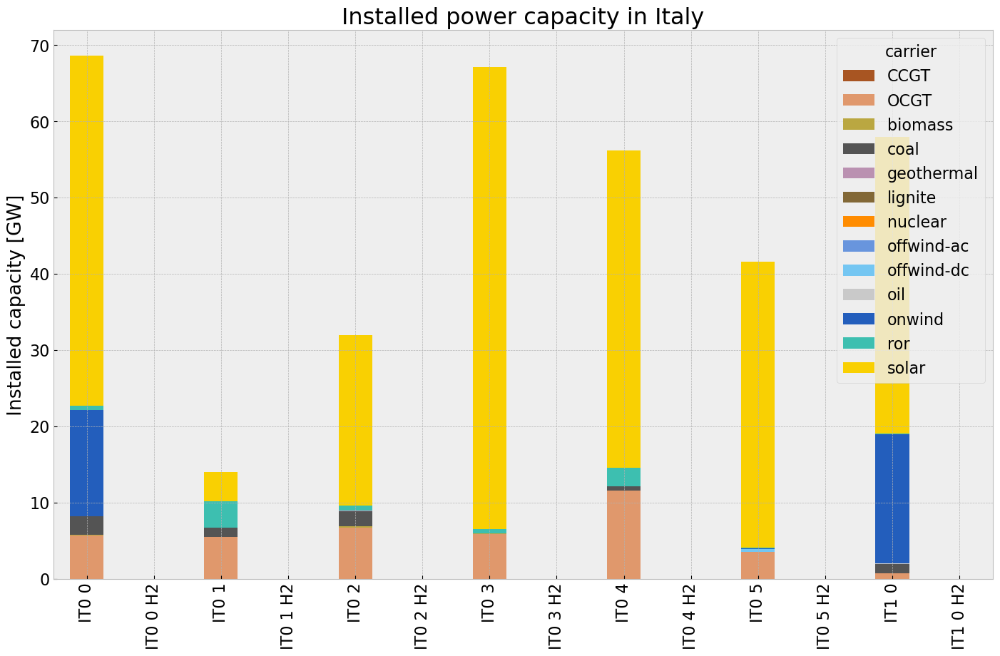

<Figure size 640x480 with 0 Axes>

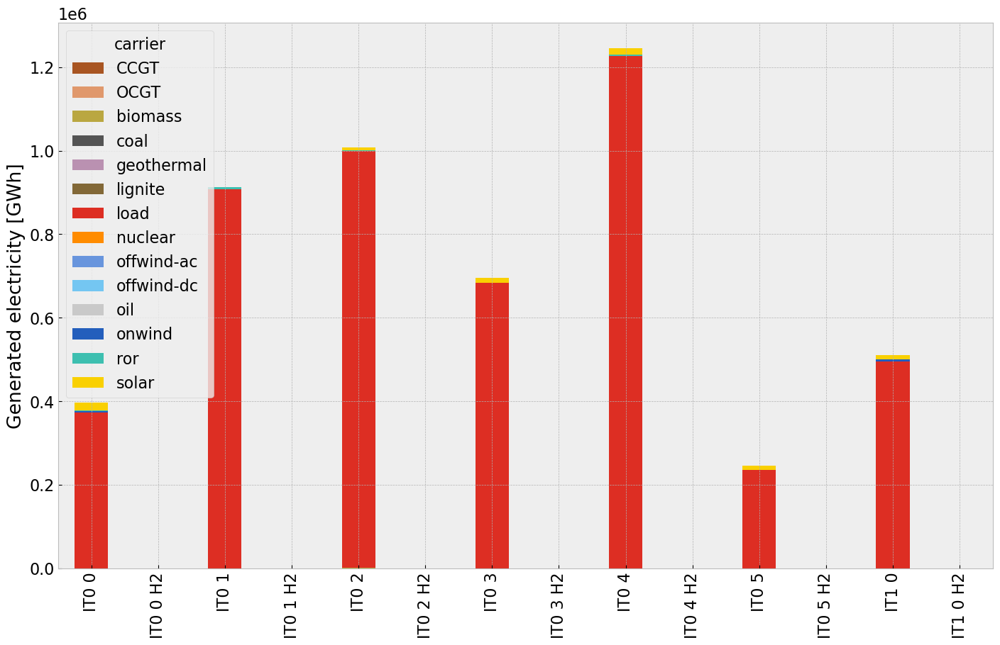

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\478108386.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\478108386.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3964699090.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage

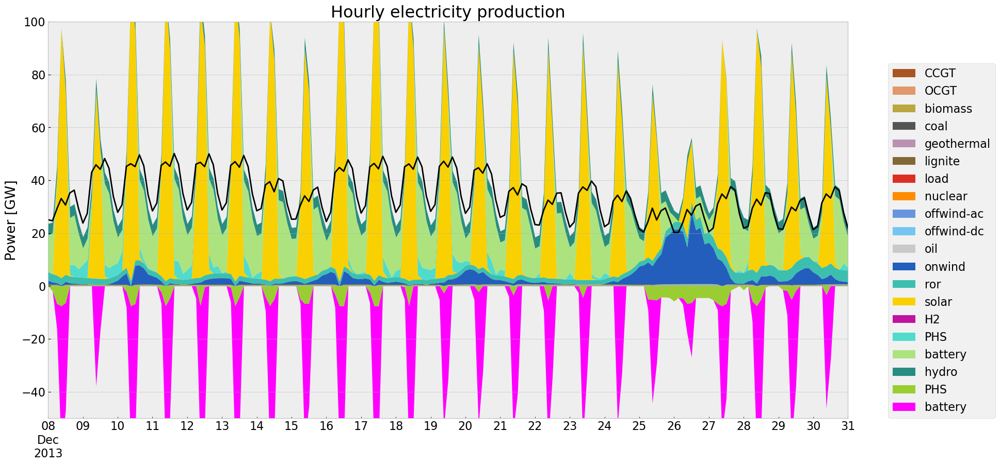

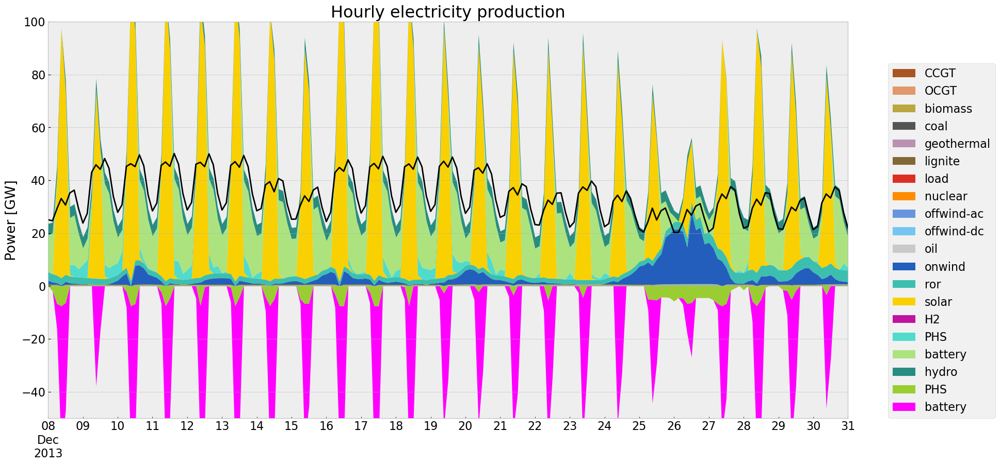

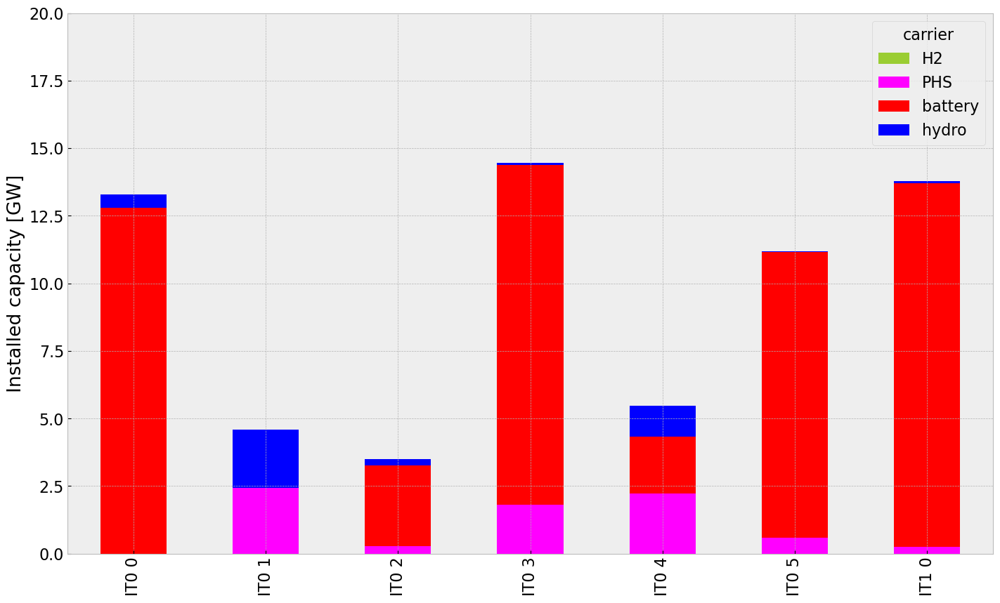

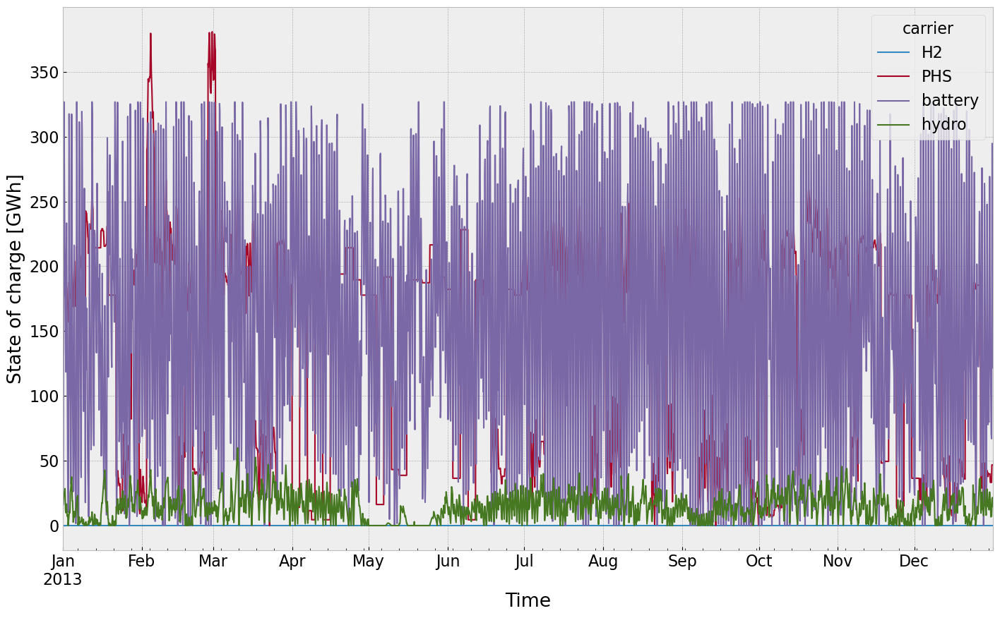

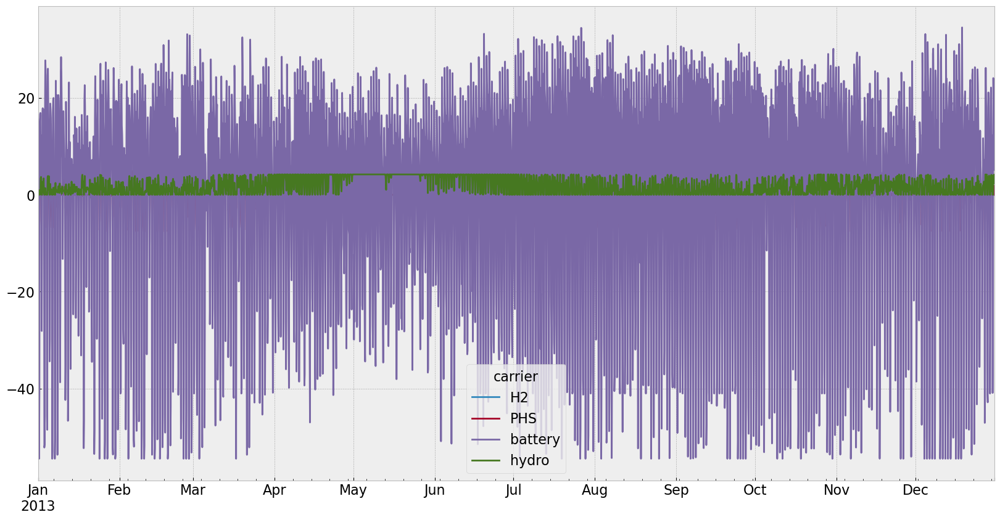

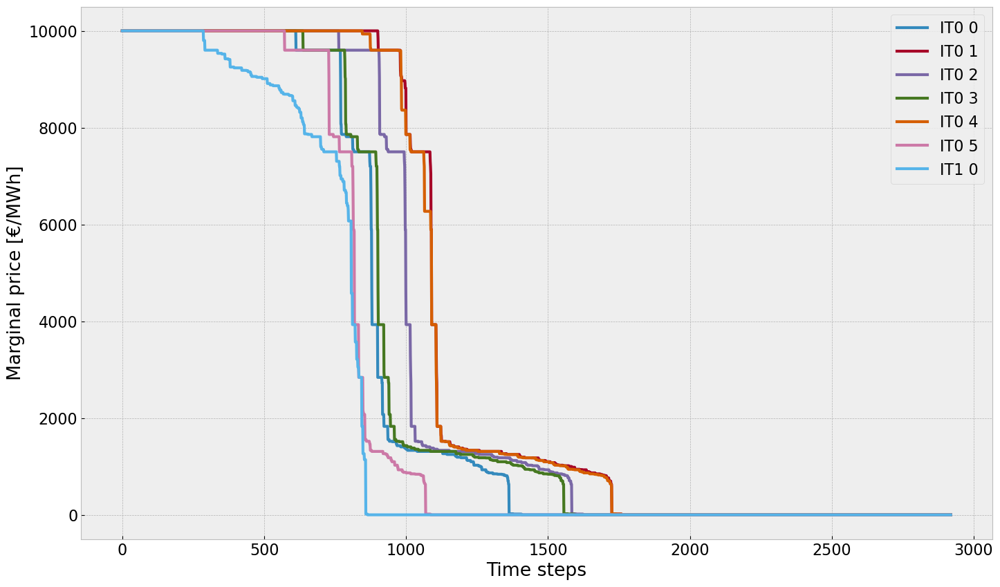

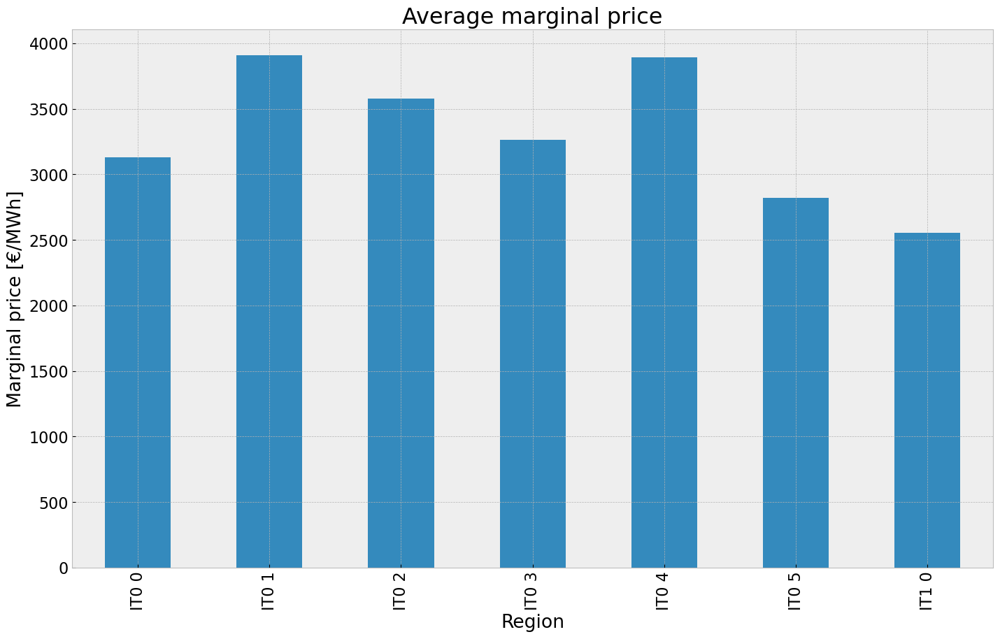

In [64]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

#installed storage unit
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)

# Scenario Analysis

## Installed Capacity

In [65]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

In [66]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,39.420200,39.420200,39.420200,39.420200
Biomass,0.508000,0.508000,0.508000,0.508000
Coal,7.275926,7.275926,7.275926,7.275926
Geothermal,0.059000,0.059000,0.059000,0.059000
Lignite,0.000000,0.000000,0.000000,0.000000
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,0.000000,0.000000,0.000000,0.000000
Offshore Wind DC,0.354482,0.354482,0.354482,0.354482


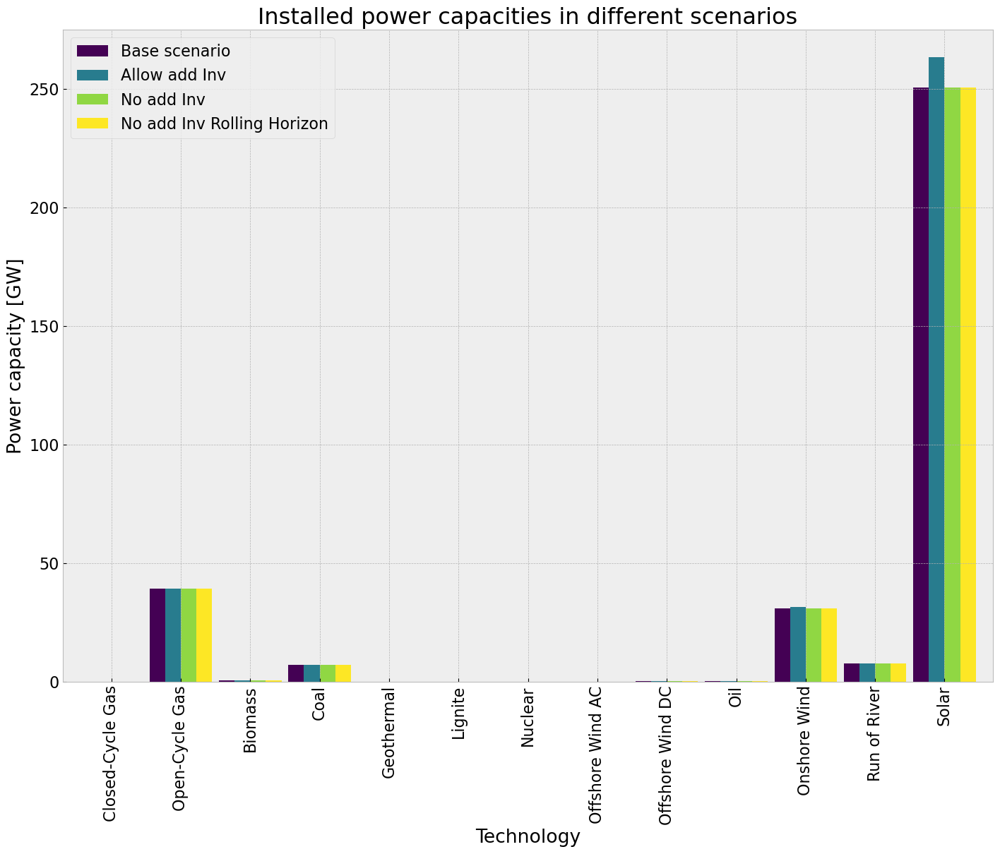

In [106]:
#colors = cm.viridis(np.linspace(0, 5, len(comp_inst_cap)))

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        ylim=[0,275],
                        width=0.9
)
plt.show()

## Power Generation

In [68]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)

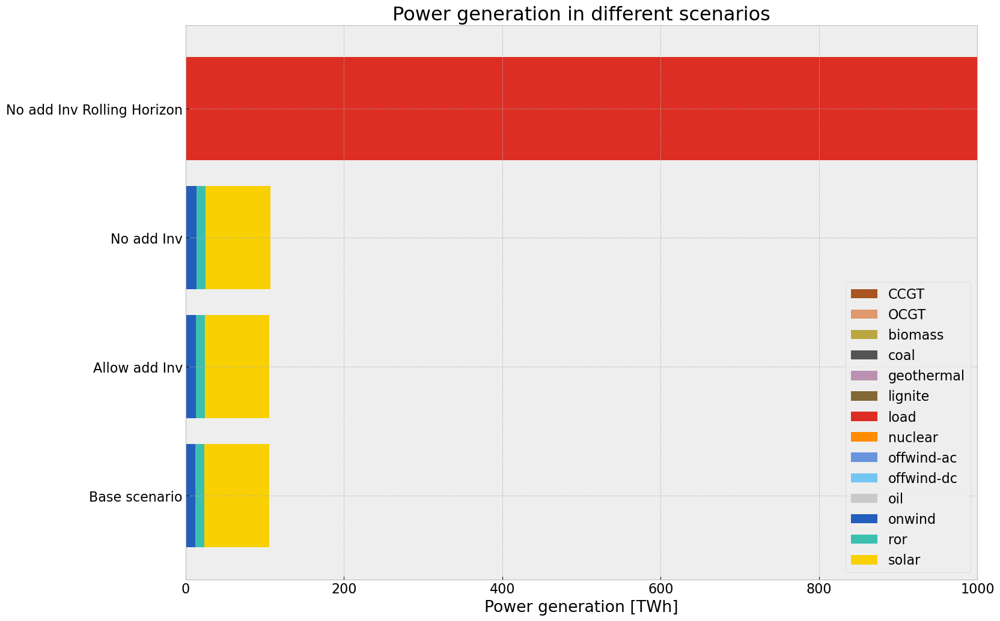

In [107]:
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        xlim=[0,1000],
                        width=0.8
)
plt.show()

## Average System Cost

In [70]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

if 'AC' in system_cost_base:
    comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\2925963551.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  comp_system_cost.fillna(0, inplace=True)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\649005694.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\649005694.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


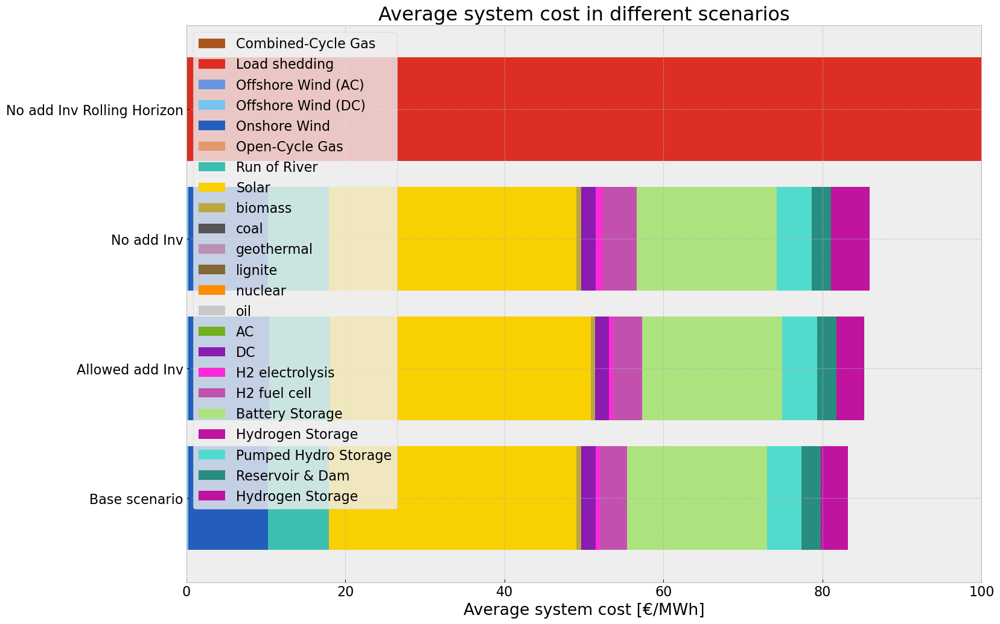

In [71]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        xlim=[0,100],
                        width=0.8
)
plt.show()

## Curtailment

In [72]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [73]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10664\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


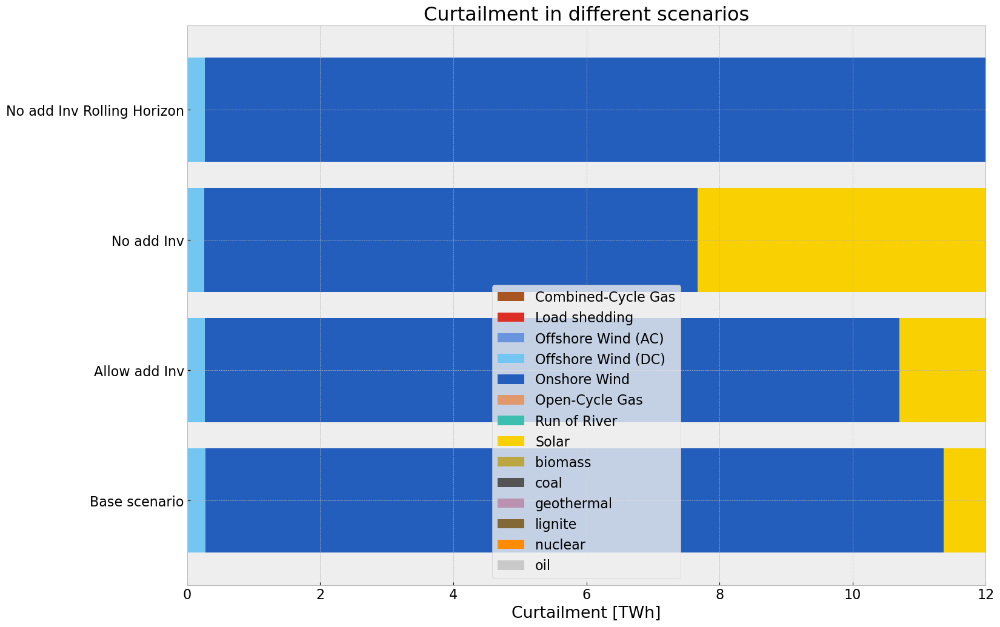

In [74]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        xlim=[0,12],
                        width=0.8
)
plt.show()